# PROJECT : Census Income 

Problem Statement:

This data was extracted from the 1994 Census bureau database by Ronny Kohavi and Barry Becker (Data Mining and Visualization, Silicon Graphics). A set of reasonably clean records was extracted using the following conditions: ((AAGE>16) && (AGI>100) && (AFNLWGT>1) && (HRSWK>0)). The prediction task is to determine whether a person makes over $50K a year.

Description of fnlwgt (final weight)
The weights on the Current Population Survey (CPS) files are controlled to independent estimates of the civilian non-institutional population of the US. These are prepared monthly for us by Population Division here at the Census Bureau. We use 3 sets of controls. These are:

A single cell estimate of the population 16+ for each state.

Controls for Hispanic Origin by age and sex.

Controls by Race, age and sex.

We use all three sets of controls in our weighting program and "rake" through them 6 times so that by the end we come back to all the controls we used. The term estimate refers to population totals derived from CPS by creating "weighted tallies" of any specified socio-economic characteristics of the population. People with similar demographic characteristics should have similar weights. There is one important caveat to remember about this statement. That is that since the CPS sample is actually a collection of 51 state samples, each with its own probability of selection, the statement only applies within state.

Import the libraries and loading the data file link from github

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings as wns
wns.filterwarnings("ignore")

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset1/master/census_income.csv')

df.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [3]:
#Shape of the dataset
df.shape

(32560, 15)

There are total 32,560 rows and 15 columns in our dataset

In [4]:
#Column Names of our datset
df.columns

Index(['Age', 'Workclass', 'Fnlwgt', 'Education', 'Education_num',
       'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Native_country',
       'Income'],
      dtype='object')

In [5]:
#Information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32560 non-null  int64 
 1   Workclass       32560 non-null  object
 2   Fnlwgt          32560 non-null  int64 
 3   Education       32560 non-null  object
 4   Education_num   32560 non-null  int64 
 5   Marital_status  32560 non-null  object
 6   Occupation      32560 non-null  object
 7   Relationship    32560 non-null  object
 8   Race            32560 non-null  object
 9   Sex             32560 non-null  object
 10  Capital_gain    32560 non-null  int64 
 11  Capital_loss    32560 non-null  int64 
 12  Hours_per_week  32560 non-null  int64 
 13  Native_country  32560 non-null  object
 14  Income          32560 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [6]:
#DataTypes of dataset
df.dtypes

Age                int64
Workclass         object
Fnlwgt             int64
Education         object
Education_num      int64
Marital_status    object
Occupation        object
Relationship      object
Race              object
Sex               object
Capital_gain       int64
Capital_loss       int64
Hours_per_week     int64
Native_country    object
Income            object
dtype: object

In my dataset , there are 6 columns with datatype object and the remaining 9 columns have datatype int.

In [7]:
#Check for missing values

df.isnull().sum()

Age               0
Workclass         0
Fnlwgt            0
Education         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64

In [8]:
#Summary Statistics of dataset

df.describe()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week
count,32560.000000,3.256000e+04,32560.000000,32560.000000,32560.000000,32560.000000
mean,38.581634,1.897818e+05,10.080590,1077.615172,87.306511,40.437469
std,13.640642,1.055498e+05,2.572709,7385.402999,402.966116,12.347618
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783630e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


<AxesSubplot:>

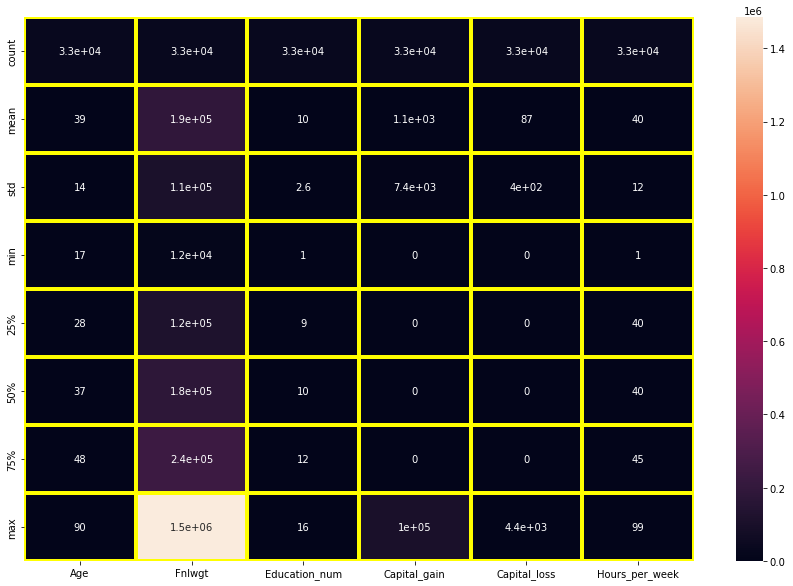

In [9]:
#Graphical representation 
plt.figure(figsize=(15,10))
sns.heatmap(df.describe(),annot=True,linecolor='yellow',linewidths=4)

In the above cell , there are no missing values present and the data have a fair amount of outliers present

In [10]:
df.describe(include='O')

,Workclass,Education,Marital_status,Occupation,Relationship,Race,Sex,Native_country,Income
count,32560,32560,32560,32560,32560,32560,32560,32560,32560
unique,9,16,7,15,6,5,2,42,2
top,Private,HS-grad,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,<=50K
freq,22696,10501,14976,4140,13193,27815,21789,29169,24719


# Univariate Analysis

I will start visualizing the data through graphs and getting a fair amount of idea about how the feature variables
behaves with the target variable.

In [11]:
df.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


Divide the data into categorical and numerical variables

In [12]:
categorical_variables = df.select_dtypes(include=['O'])

categorical_variables

,Workclass,Education,Marital_status,Occupation,Relationship,Race,Sex,Native_country,Income
0,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,<=50K
1,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,<=50K
2,Private,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,<=50K
3,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,Cuba,<=50K
4,Private,Masters,Married-civ-spouse,Exec-managerial,Wife,White,Female,United-States,<=50K
...,...,...,...,...,...,...,...,...,...
32555,Private,Assoc-acdm,Married-civ-spouse,Tech-support,Wife,White,Female,United-States,<=50K
32556,Private,HS-grad,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,United-States,>50K
32557,Private,HS-grad,Widowed,Adm-clerical,Unmarried,White,Female,United-States,<=50K
32558,Private,HS-grad,Never-married,Adm-clerical,Own-child,White,Male,United-States,<=50K


In [13]:
categorical_variables.shape

(32560, 9)

Exploring Categorical variables

1]Count Plot

<AxesSubplot:xlabel='Workclass', ylabel='count'>

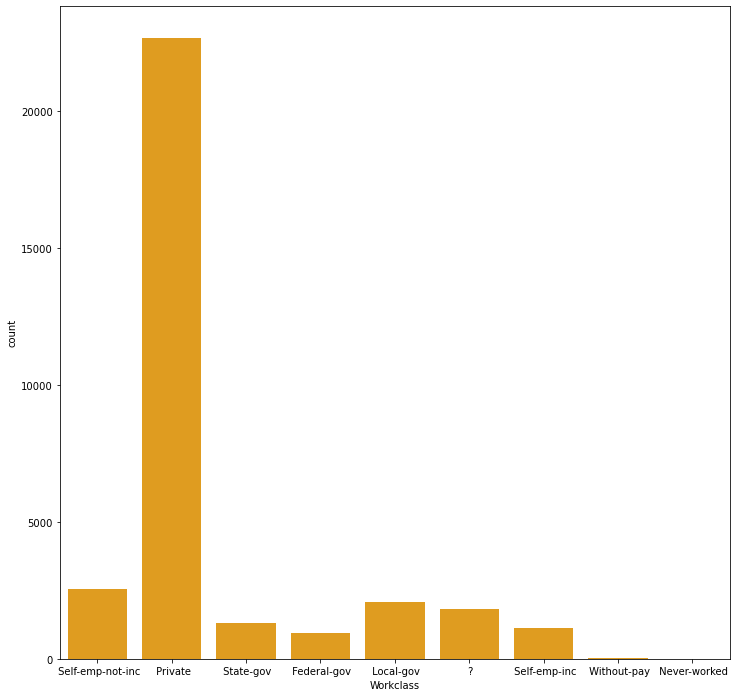

In [14]:
#Workclass

plt.figure(figsize=(12,12))
sns.countplot(df['Workclass'],color='orange')

The 'Private' sector has more count than the other workclasses in the dataset
'Never-worked' has nothing so it will not affect much in model which I will design in the latter stages.

The workclass plot contains '?' which will affect the model.I will replace the ? record in latter stages

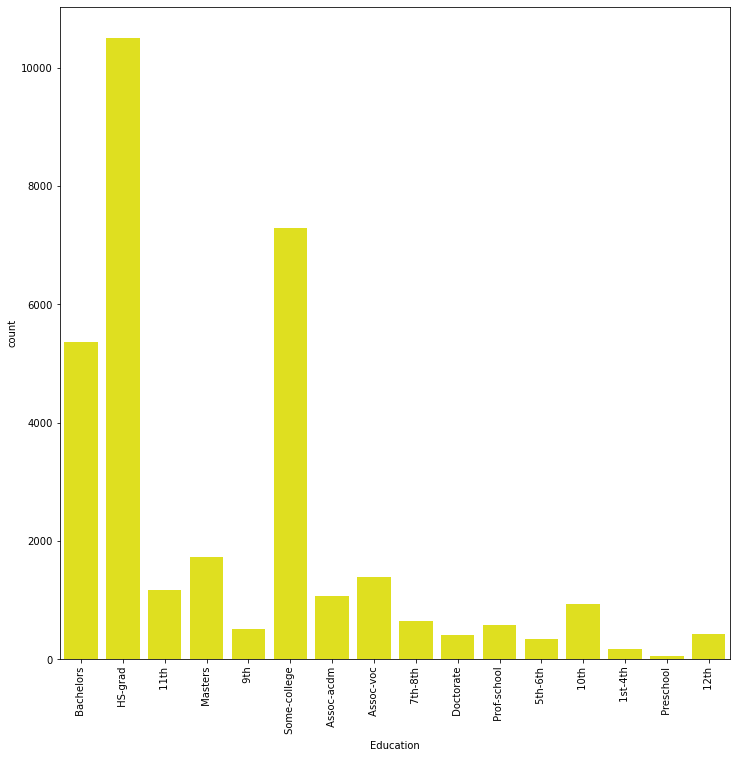

In [15]:
#Education

plt.figure(figsize=(12,12))
sns.countplot(df['Education'],color='yellow')
plt.xticks(rotation=90)
plt.show()

<AxesSubplot:xlabel='Marital_status', ylabel='count'>

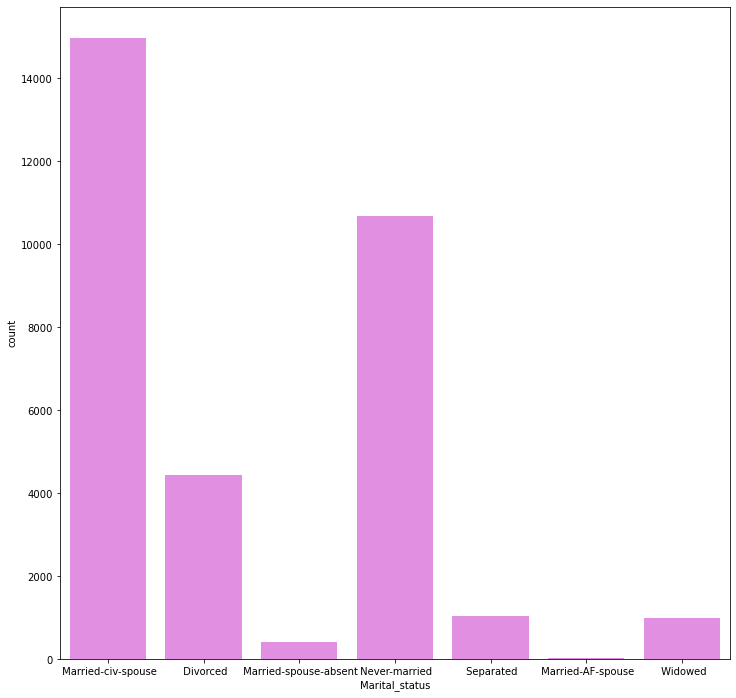

In [16]:
#Maritial_Status

plt.figure(figsize=(12,12))
sns.countplot(df['Marital_status'],color='violet')

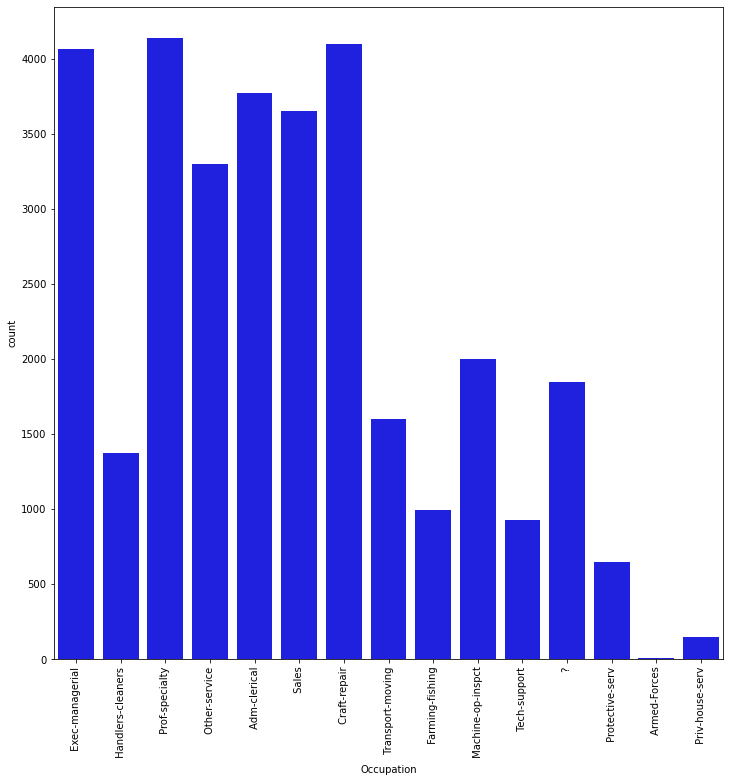

In [17]:
#Occupation

plt.figure(figsize=(12,12))
sns.countplot(df['Occupation'],color='blue')
plt.xticks(rotation=90)
plt.show()

The occupation plot contains '?' which will affect the model.I will replace the ? record in latter stages

<AxesSubplot:xlabel='Relationship', ylabel='count'>

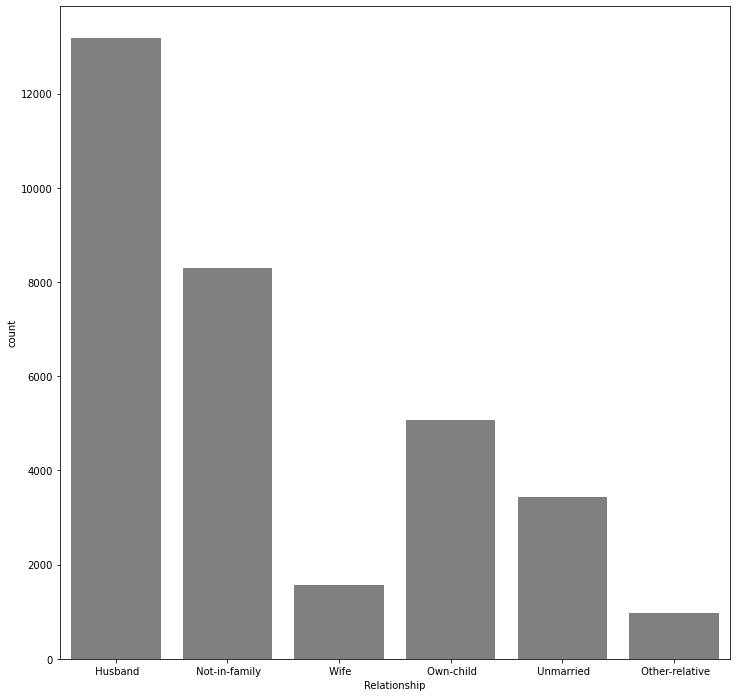

In [18]:
#Relationship

plt.figure(figsize=(12,12))
sns.countplot(df['Relationship'],color='grey')

<AxesSubplot:xlabel='Race', ylabel='count'>

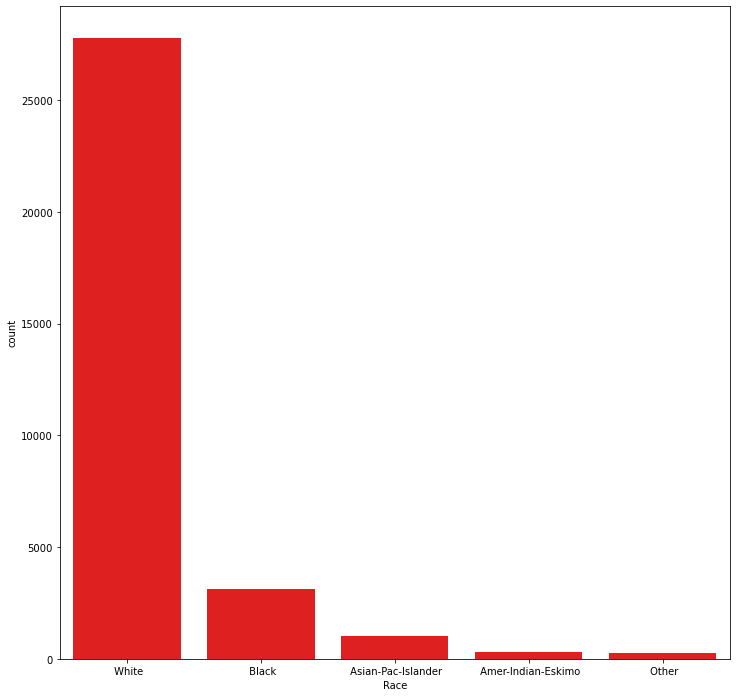

In [19]:
#Race

plt.figure(figsize=(12,12))
sns.countplot(df['Race'],color='red')

<AxesSubplot:xlabel='Sex', ylabel='count'>

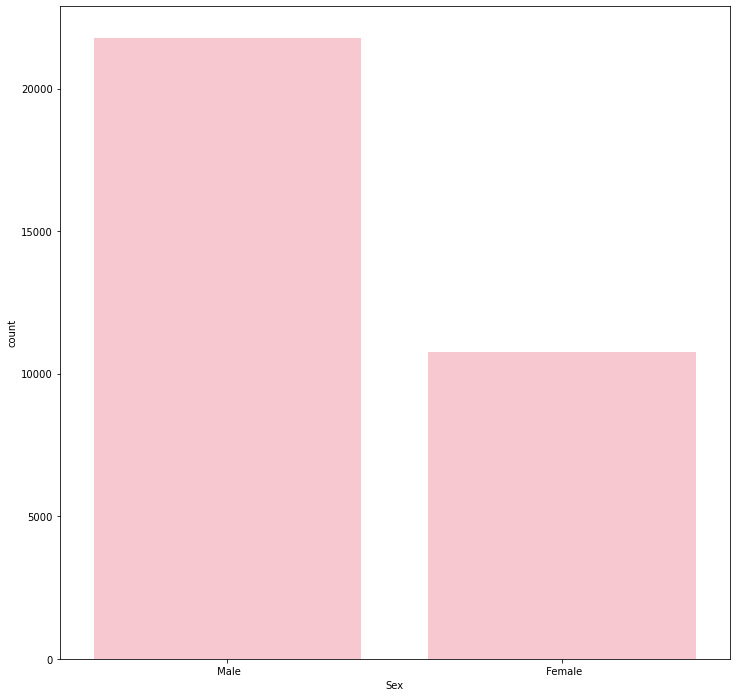

In [20]:
#Sex

plt.figure(figsize=(12,12))
sns.countplot(df['Sex'],color='pink')

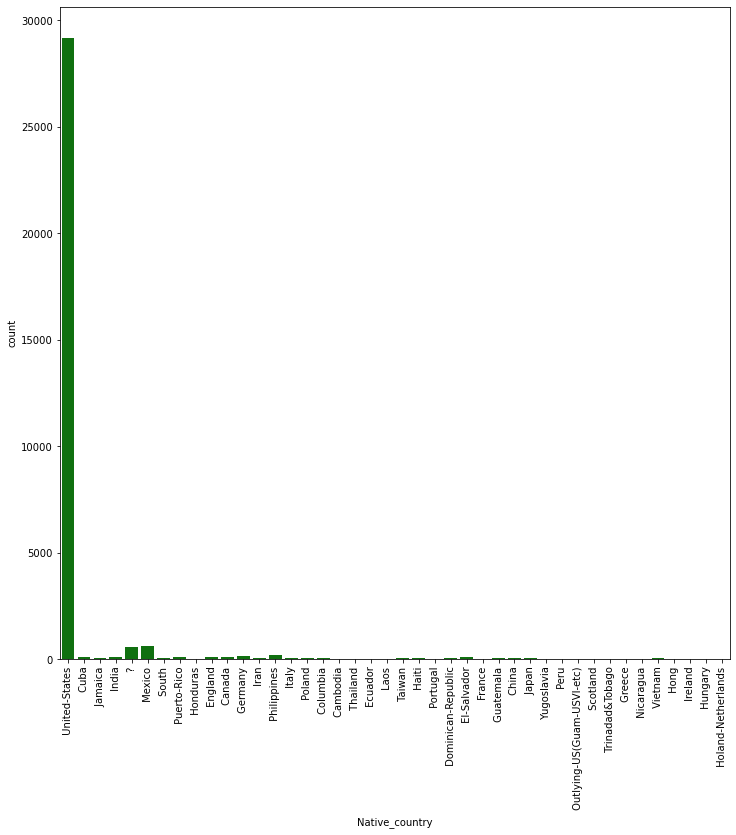

In [21]:
#Native_country

plt.figure(figsize=(12,12))
sns.countplot(df['Native_country'],color='green')
plt.xticks(rotation=90)
plt.show()

The Native_country plot contains '?' which will affect the model.I will replace the ? record in latter stages

<AxesSubplot:xlabel='Income', ylabel='count'>

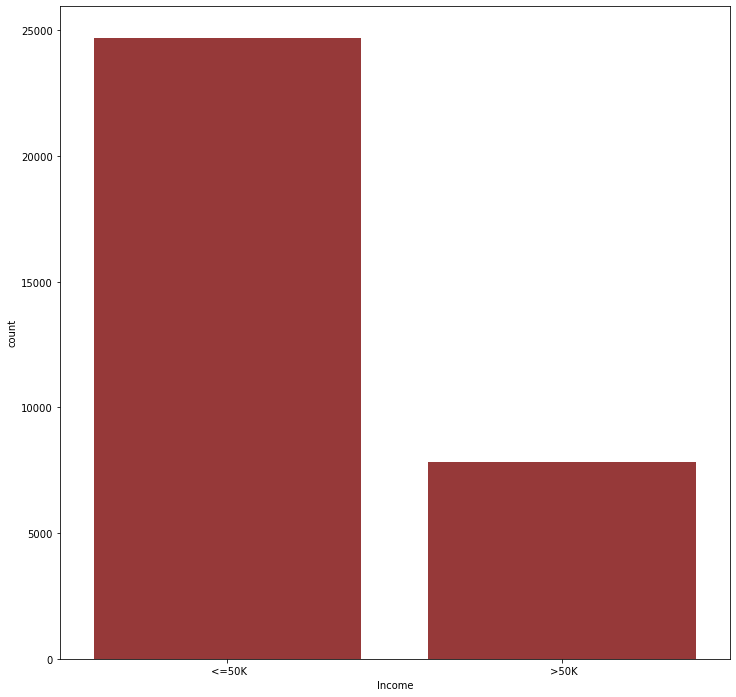

In [22]:
#Income

plt.figure(figsize=(12,12))
sns.countplot(df['Income'],color='brown')

The visualizations done with count plot in the above cells shows the count of each and every feature which helps in understanding our data.

There are certain values which are denoated with ? which will affect our model very badly and can give inaccurate results.

In [23]:
#Replacing ? in Workclass , Occupation , Native_country

In [24]:
df['Workclass'].replace({' ?':' Other-Working-Class'},inplace=True)
df['Occupation'].replace({' ?':' Other-Occupation'},inplace=True)
df['Native_country'].replace({' ?':' Others'},inplace=True)

Counting the number of records in categorical variables

In [25]:
for col in categorical_variables:
    o = df[col].value_counts()
    print(o)
    print('-'*40)

 Private                22696
 Self-emp-not-inc        2541
 Local-gov               2093
 Other-Working-Class     1836
 State-gov               1297
 Self-emp-inc            1116
 Federal-gov              960
 Without-pay               14
 Never-worked               7
Name: Workclass, dtype: int64
----------------------------------------
 HS-grad         10501
 Some-college     7291
 Bachelors        5354
 Masters          1723
 Assoc-voc        1382
 11th             1175
 Assoc-acdm       1067
 10th              933
 7th-8th           646
 Prof-school       576
 9th               514
 12th              433
 Doctorate         413
 5th-6th           333
 1st-4th           168
 Preschool          51
Name: Education, dtype: int64
----------------------------------------
 Married-civ-spouse       14976
 Never-married            10682
 Divorced                  4443
 Separated                 1025
 Widowed                    993
 Married-spouse-absent      418
 Married-AF-spouse          

Exploring Numerical variables

In [26]:
num_var = df.select_dtypes(include=['int64'])

num_var

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week
0,50,83311,13,0,0,13
1,38,215646,9,0,0,40
2,53,234721,7,0,0,40
3,28,338409,13,0,0,40
4,37,284582,14,0,0,40
...,...,...,...,...,...,...
32555,27,257302,12,0,0,38
32556,40,154374,9,0,0,40
32557,58,151910,9,0,0,40
32558,22,201490,9,0,0,20


In [27]:
num_var.shape

(32560, 6)

<AxesSubplot:xlabel='Age', ylabel='Density'>

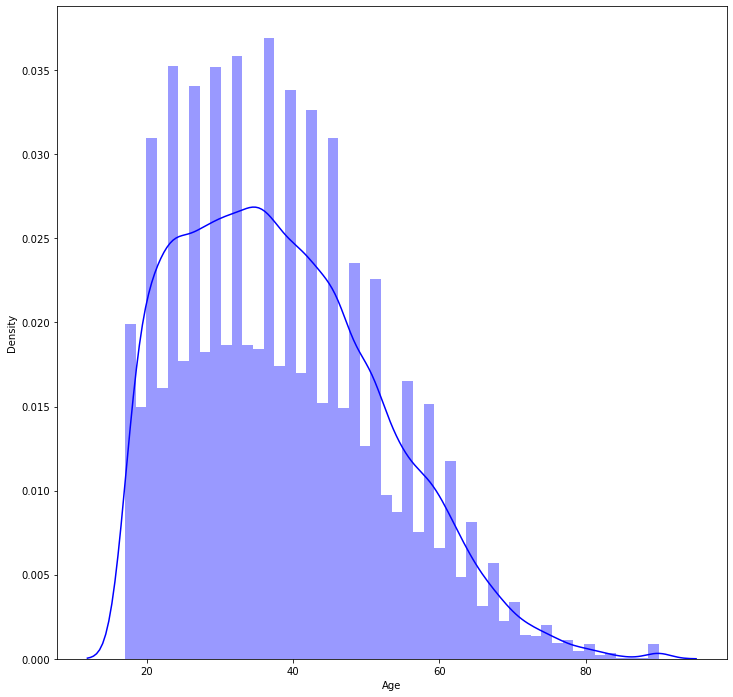

In [28]:
#Age

plt.figure(figsize=(12,12))
sns.distplot(num_var['Age'],color='blue')

<AxesSubplot:xlabel='Fnlwgt', ylabel='Density'>

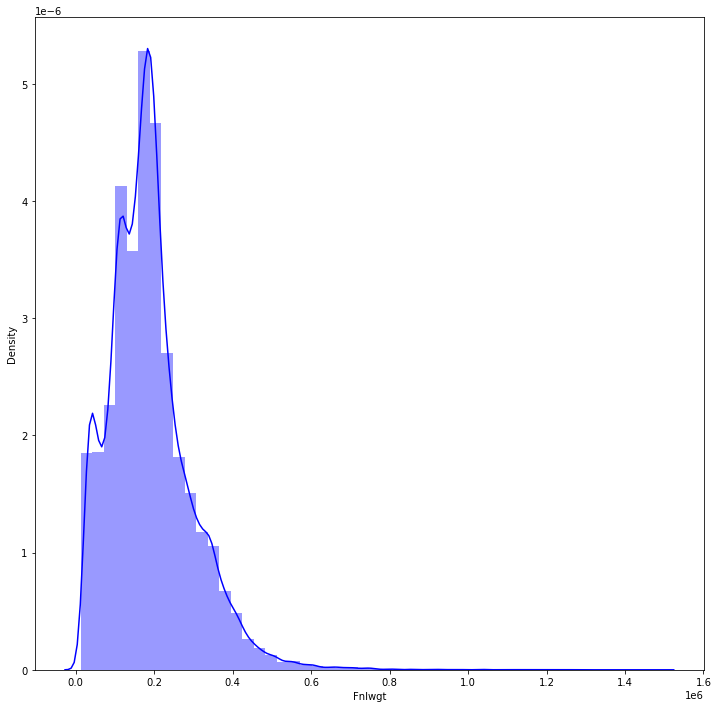

In [29]:
#Fnlwgt

plt.figure(figsize=(12,12))
sns.distplot(num_var['Fnlwgt'],color='blue')

<AxesSubplot:xlabel='Education_num', ylabel='Density'>

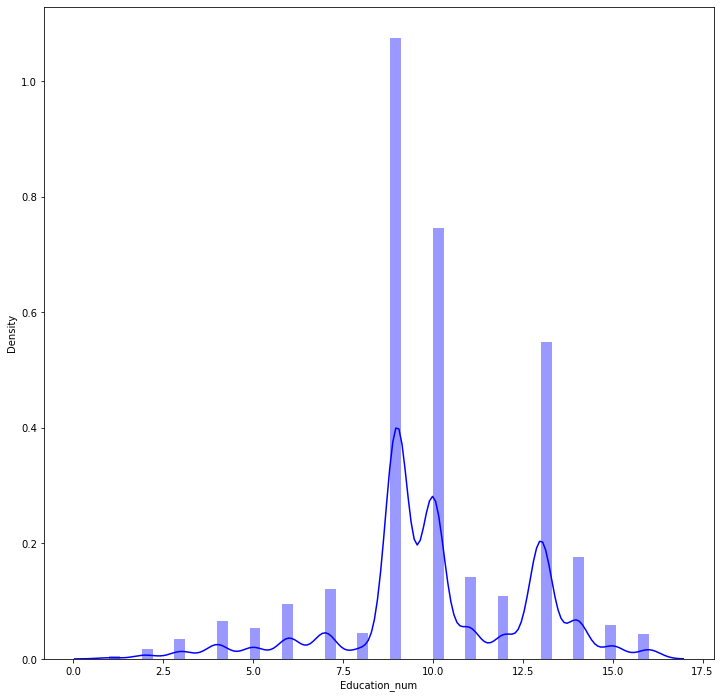

In [30]:
#Education_num

plt.figure(figsize=(12,12))
sns.distplot(num_var['Education_num'],color='blue')

<AxesSubplot:xlabel='Capital_gain', ylabel='Density'>

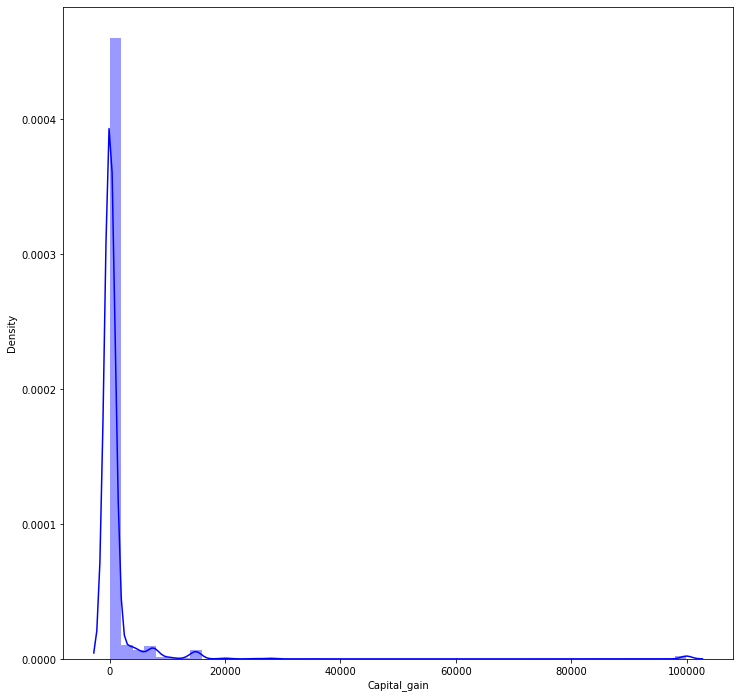

In [31]:
#Capital_gain

plt.figure(figsize=(12,12))
sns.distplot(num_var['Capital_gain'],color='blue')

<AxesSubplot:xlabel='Capital_loss', ylabel='Density'>

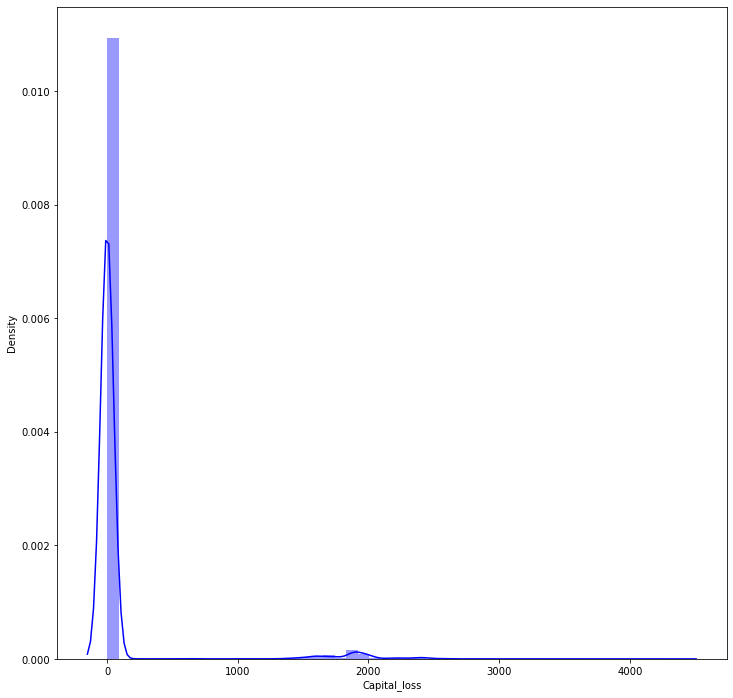

In [32]:
#Capital_loss

plt.figure(figsize=(12,12))
sns.distplot(num_var['Capital_loss'],color='blue')

<AxesSubplot:xlabel='Hours_per_week', ylabel='Density'>

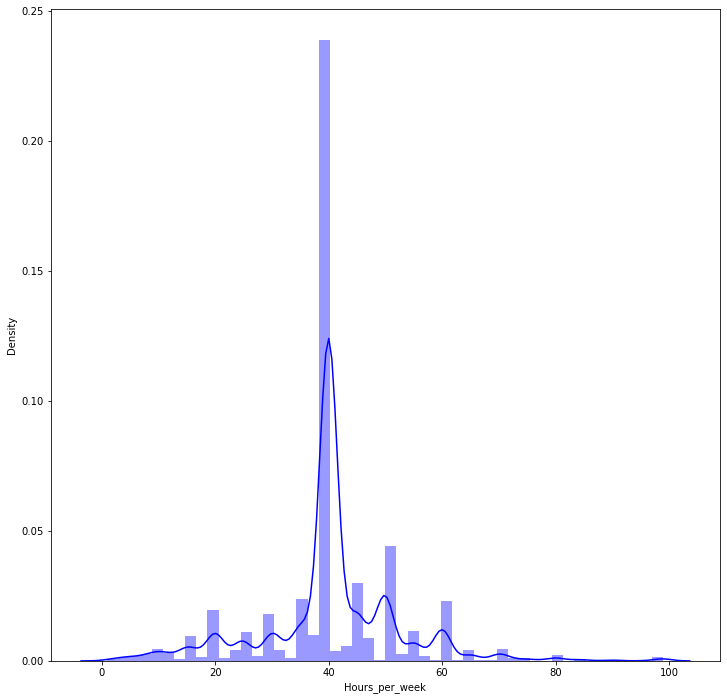

In [33]:
#Hours_per_week

plt.figure(figsize=(12,12))
sns.distplot(num_var['Hours_per_week'],color='blue')

The distributions in the numerical variables is not fully normally distributed in which certain features are highly skewed variables.In the next cell ,I will see the skewness of numerical variables.

Checking for skewness

In [34]:
df.skew()

Age                0.558738
Fnlwgt             1.446972
Education_num     -0.311630
Capital_gain      11.953690
Capital_loss       4.594549
Hours_per_week     0.227636
dtype: float64

Explore the numerical data using violin plot

<AxesSubplot:xlabel='Age'>

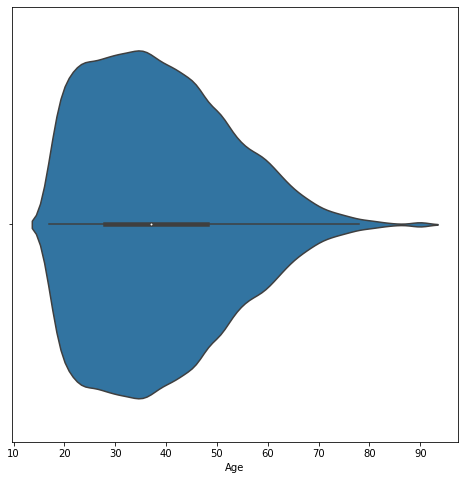

In [35]:
#Age

plt.figure(figsize=(8,8))
sns.violinplot(num_var['Age'])

<AxesSubplot:xlabel='Fnlwgt'>

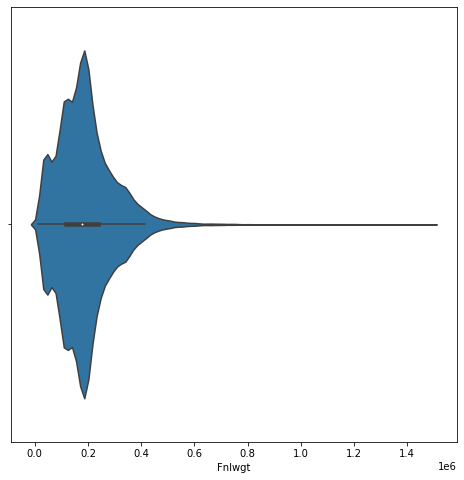

In [36]:
#Fnlwgt

plt.figure(figsize=(8,8))
sns.violinplot(num_var['Fnlwgt'])

<AxesSubplot:xlabel='Education_num'>

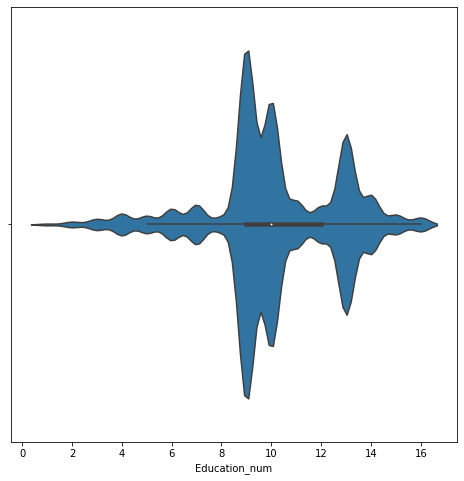

In [37]:
#Education_num

plt.figure(figsize=(8,8))
sns.violinplot(num_var['Education_num'])

<AxesSubplot:xlabel='Capital_gain'>

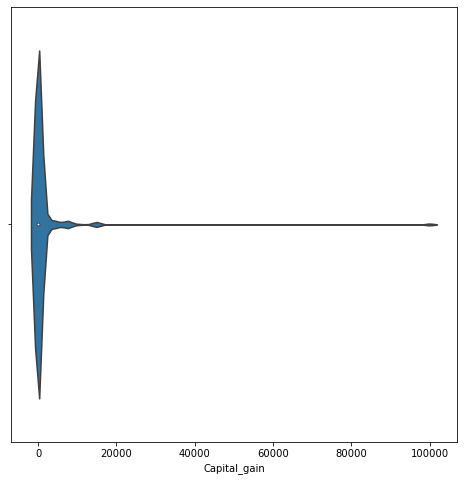

In [38]:
#Capital_gain

plt.figure(figsize=(8,8))
sns.violinplot(num_var['Capital_gain'])

<AxesSubplot:xlabel='Capital_loss'>

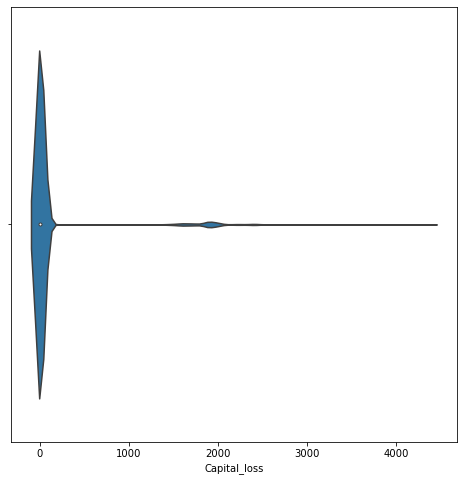

In [39]:
#Capital_loss

plt.figure(figsize=(8,8))
sns.violinplot(num_var['Capital_loss'])

<AxesSubplot:xlabel='Hours_per_week'>

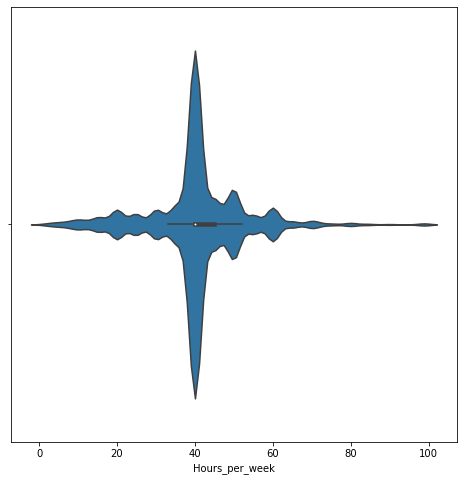

In [40]:
#Hours_per_week

plt.figure(figsize=(8,8))
sns.violinplot(num_var['Hours_per_week'])

I have used violen plot to just see how the distribution pans out.

# Bivariate Analysis

Now I will go ahead and check for feature vs target analysis 

I will use lineplot to compare the feature variable with respect to target variable

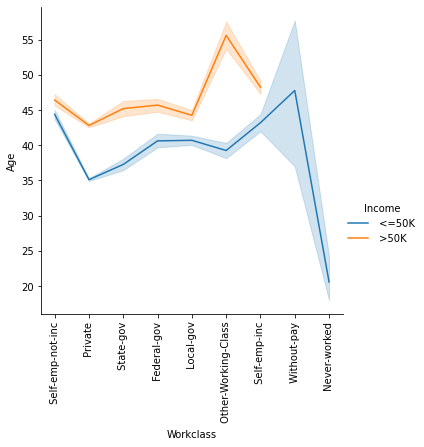

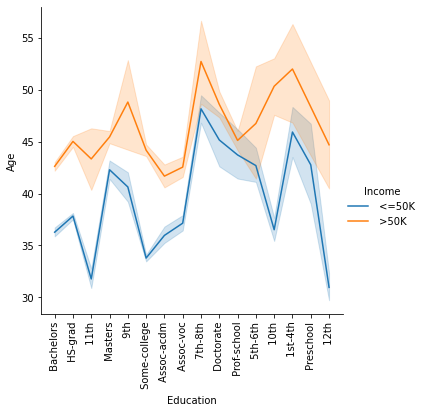

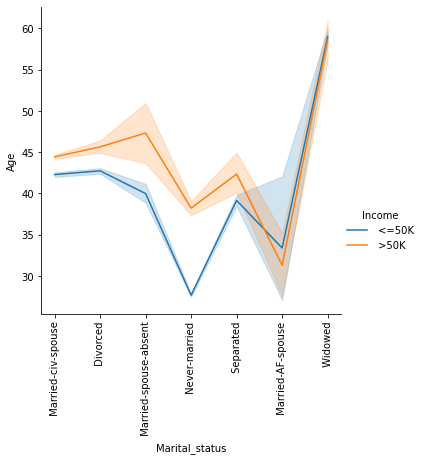

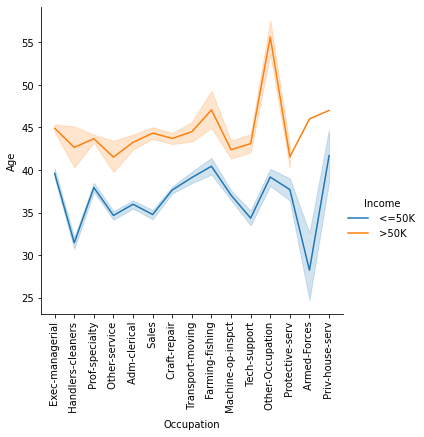

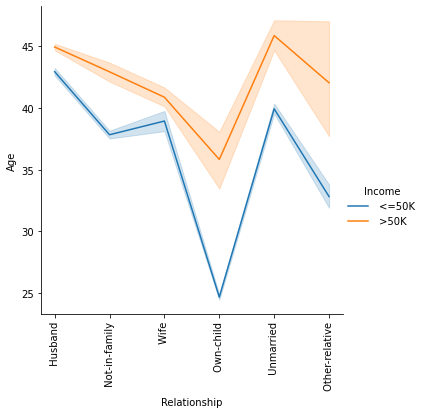

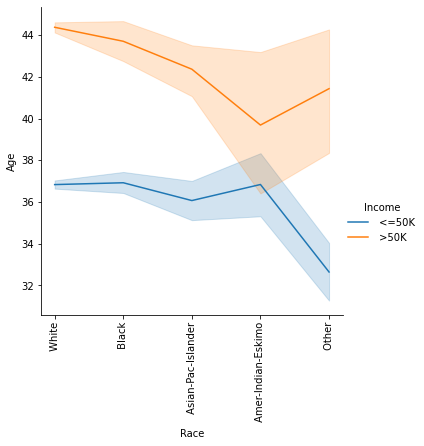

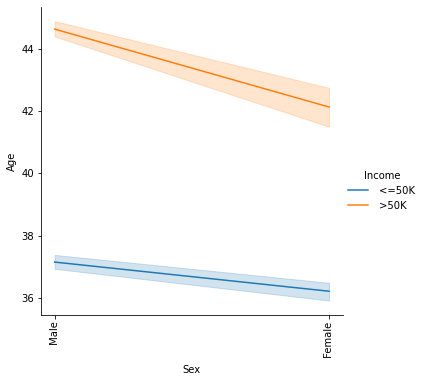

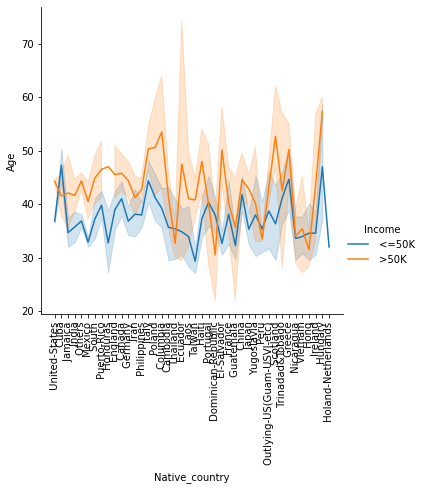

In [41]:
plot = 0
f = categorical_variables.drop(['Income'],axis=1)
for i , j in f.items():
    sns.relplot(x=i,y='Age',hue='Income',data=df,kind='line')
    plt.xticks(rotation=90)
    plot += 1
plt.show()

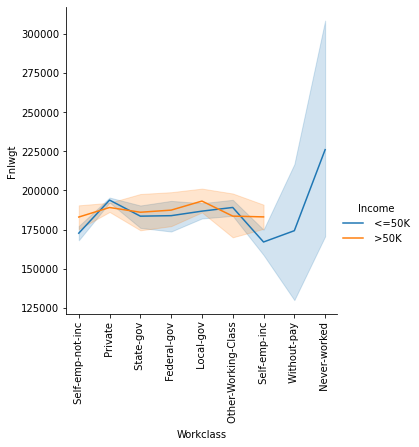

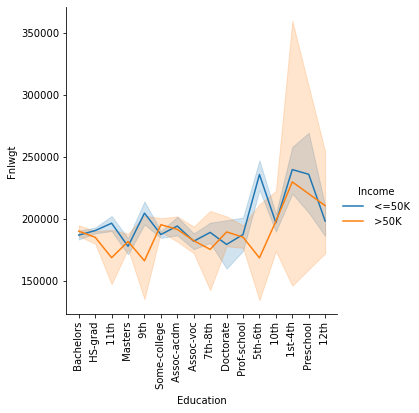

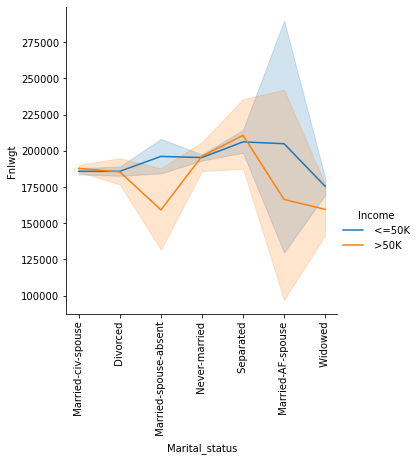

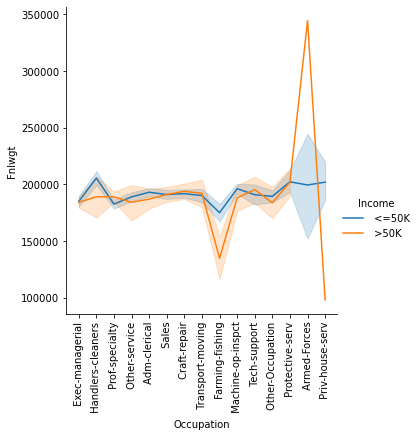

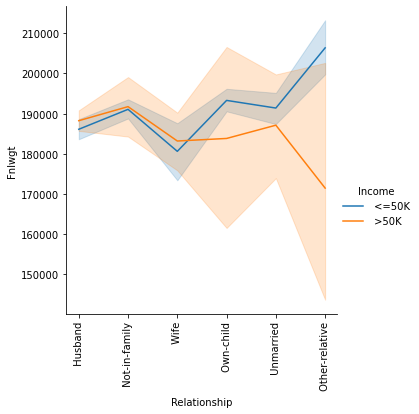

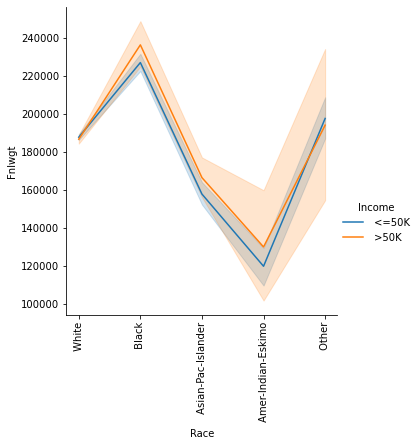

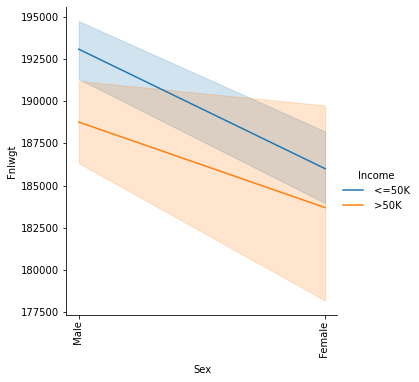

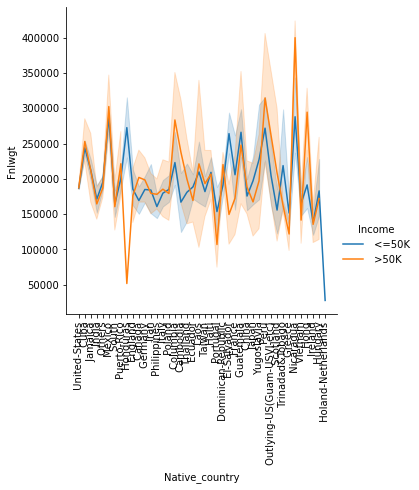

In [42]:
plot = 0
f = categorical_variables.drop(['Income'],axis=1)
for i , j in f.items():
    sns.relplot(x=i,y='Fnlwgt',hue='Income',data=df,kind='line')
    plt.xticks(rotation=90)
    plot += 1
plt.show()

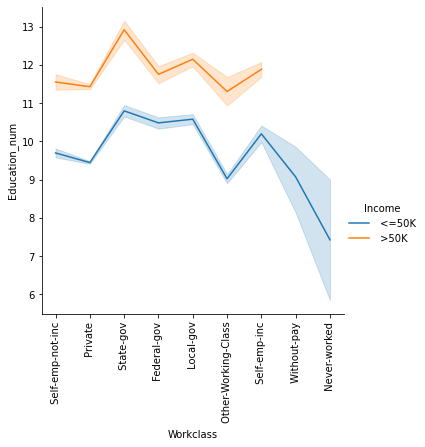

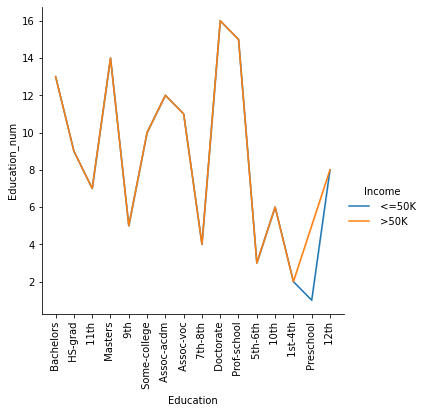

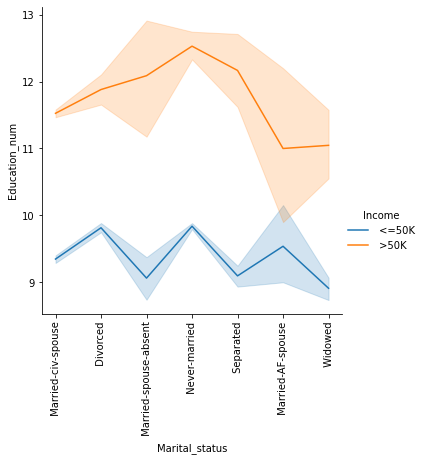

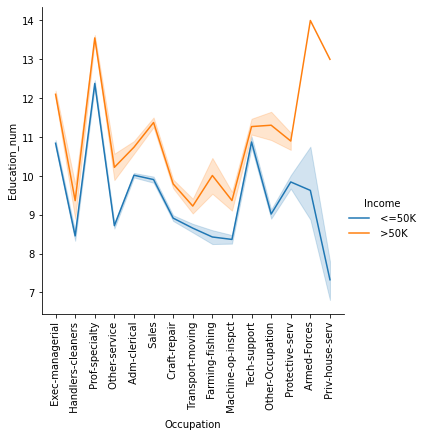

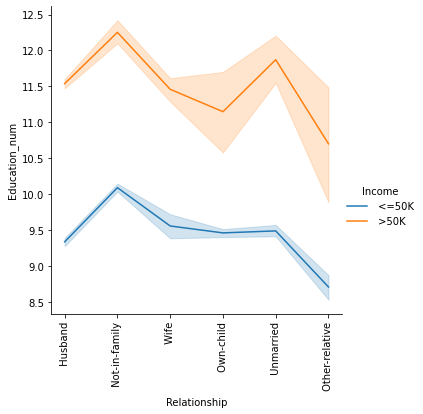

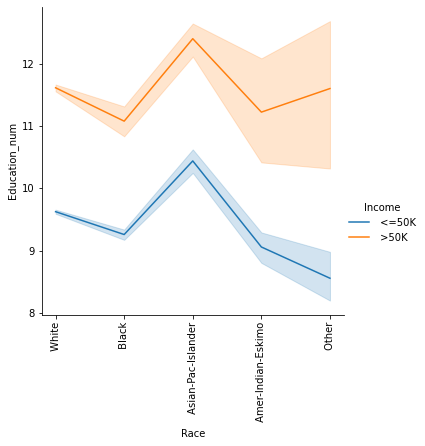

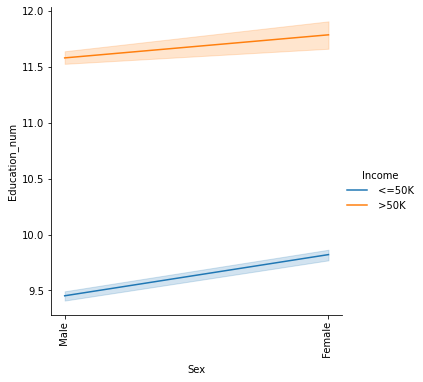

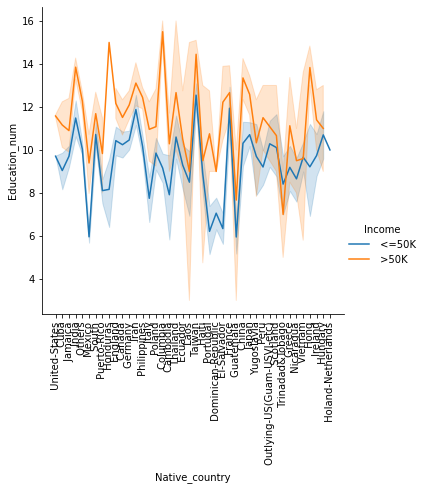

In [43]:
plot = 0
f = categorical_variables.drop(['Income'],axis=1)
for i , j in f.items():
    sns.relplot(x=i,y='Education_num',hue='Income',data=df,kind='line')
    plt.xticks(rotation=90)
    plot += 1
plt.show()

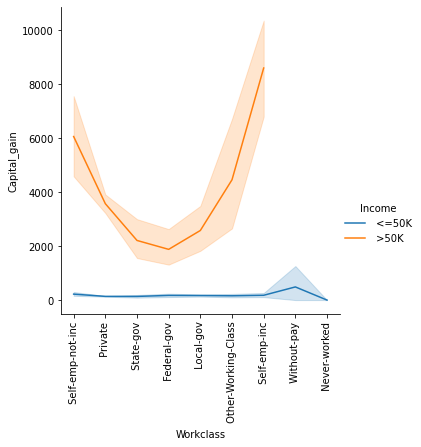

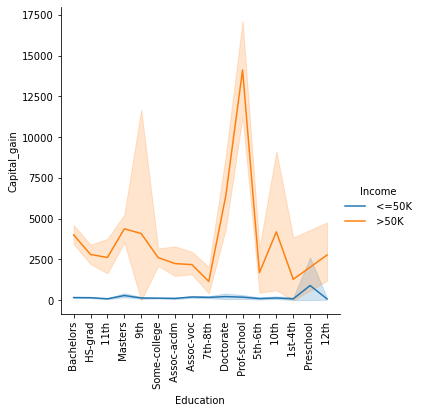

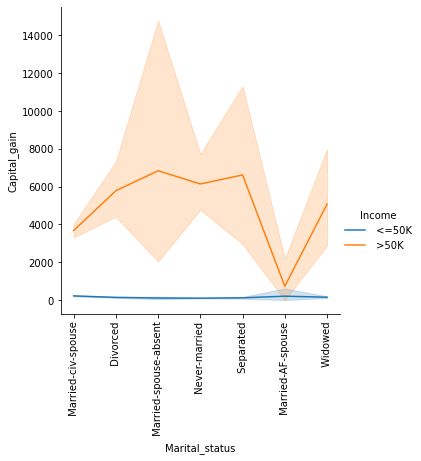

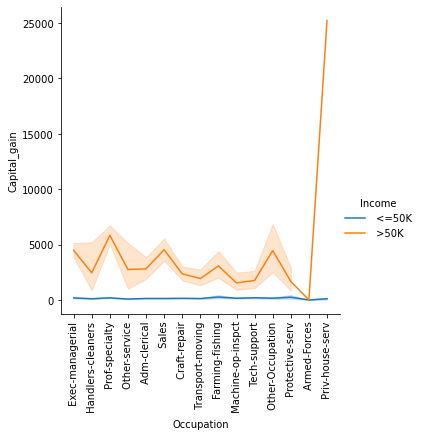

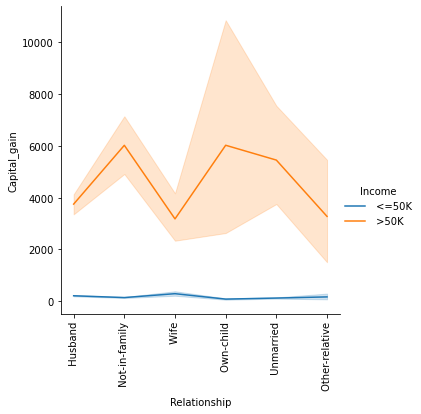

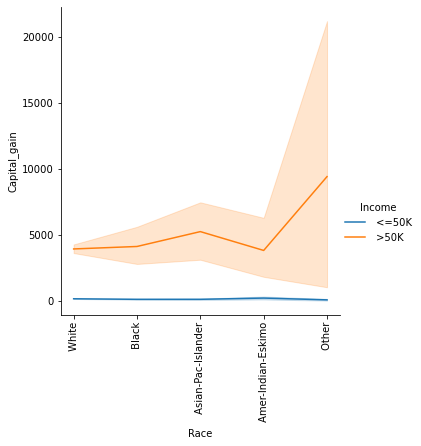

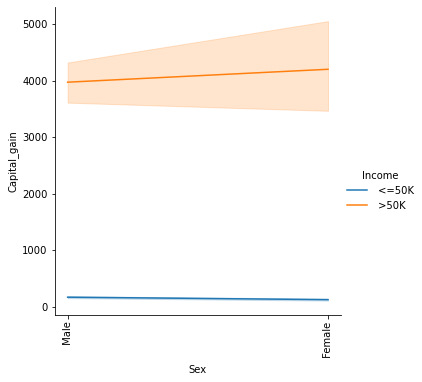

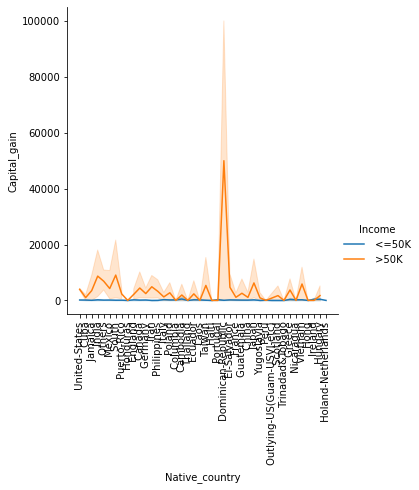

In [44]:
plot = 0
f = categorical_variables.drop(['Income'],axis=1)
for i , j in f.items():
    sns.relplot(x=i,y='Capital_gain',hue='Income',data=df,kind='line')
    plt.xticks(rotation=90)
    plot += 1
plt.show()

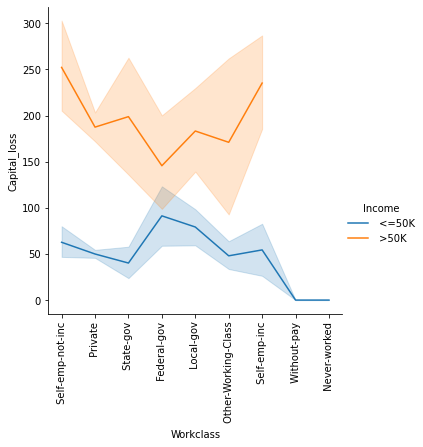

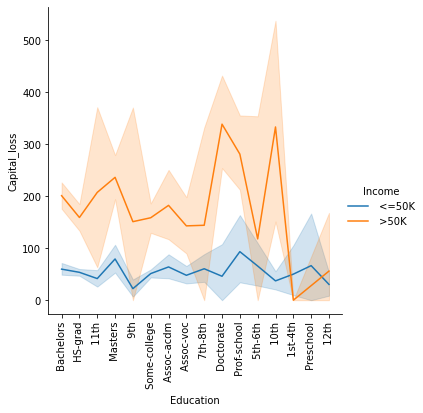

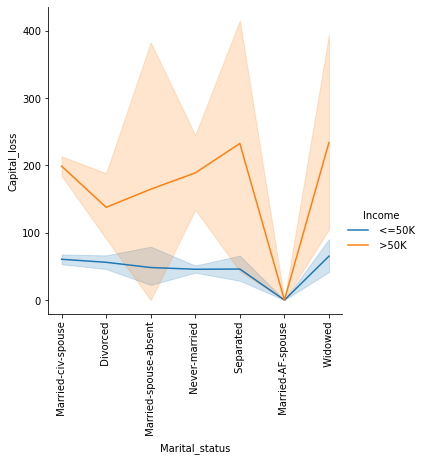

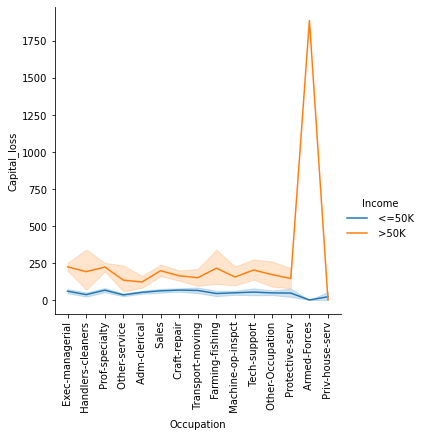

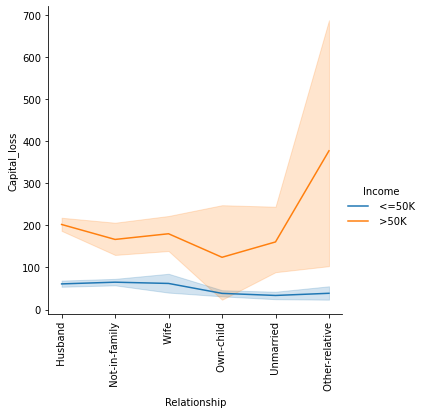

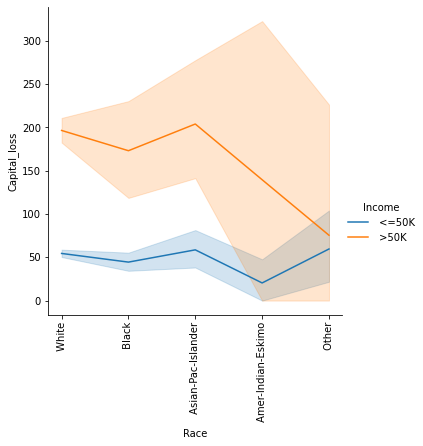

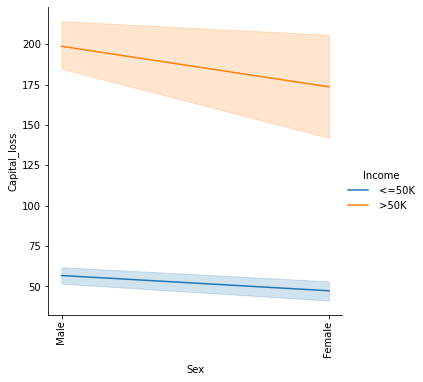

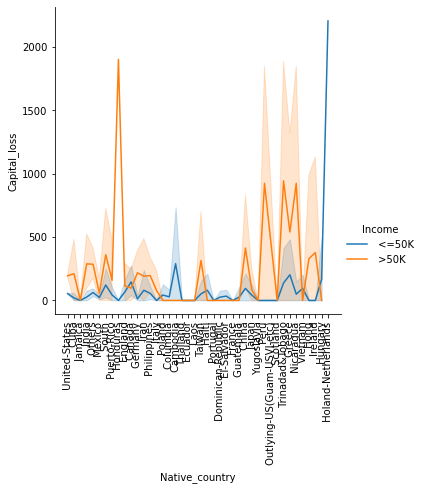

In [45]:
plot = 0
f = categorical_variables.drop(['Income'],axis=1)
for i , j in f.items():
    sns.relplot(x=i,y='Capital_loss',hue='Income',data=df,kind='line')
    plt.xticks(rotation=90)
    plot += 1
plt.show()

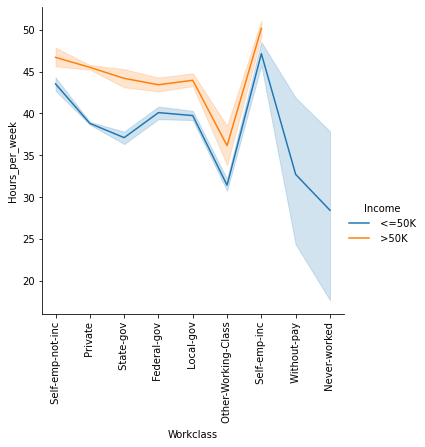

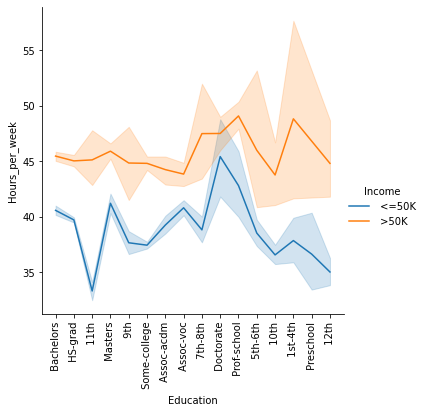

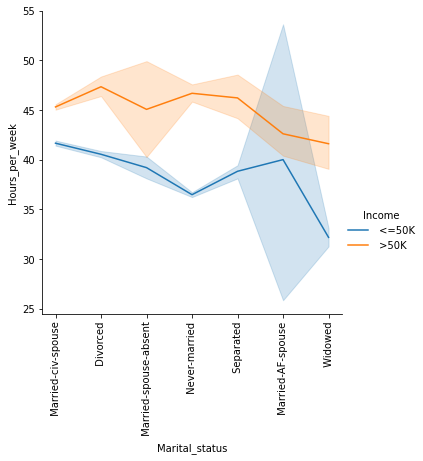

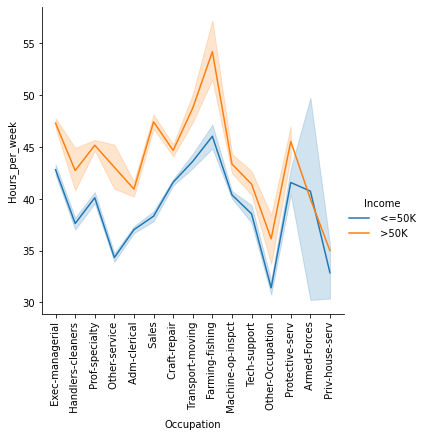

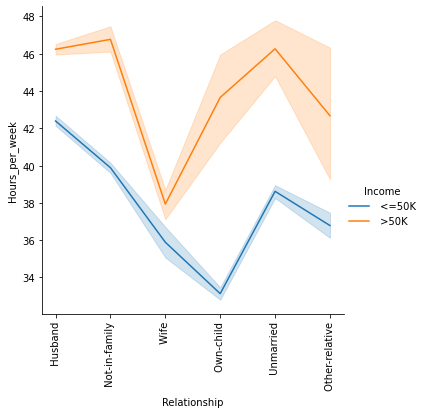

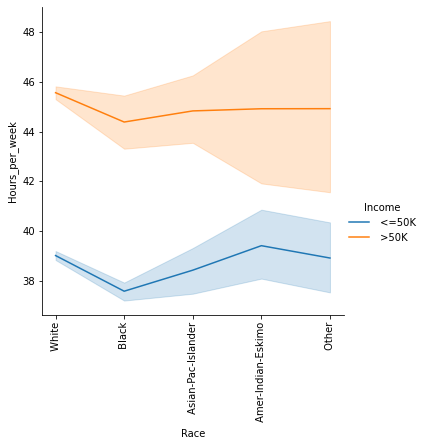

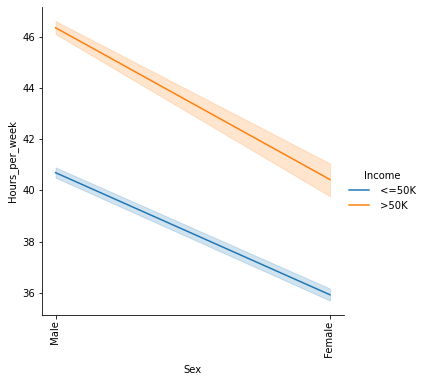

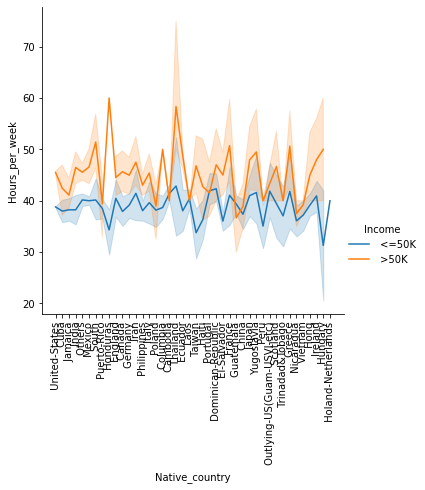

In [46]:
plot = 0
f = categorical_variables.drop(['Income'],axis=1)
for i , j in f.items():
    sns.relplot(x=i,y='Hours_per_week',hue='Income',data=df,kind='line')
    plt.xticks(rotation=90)
    plot += 1
plt.show()

I created a line plot with every numerical vs categorical variables with hue being the target variable i.e Income

Now I will explore with barplot plot

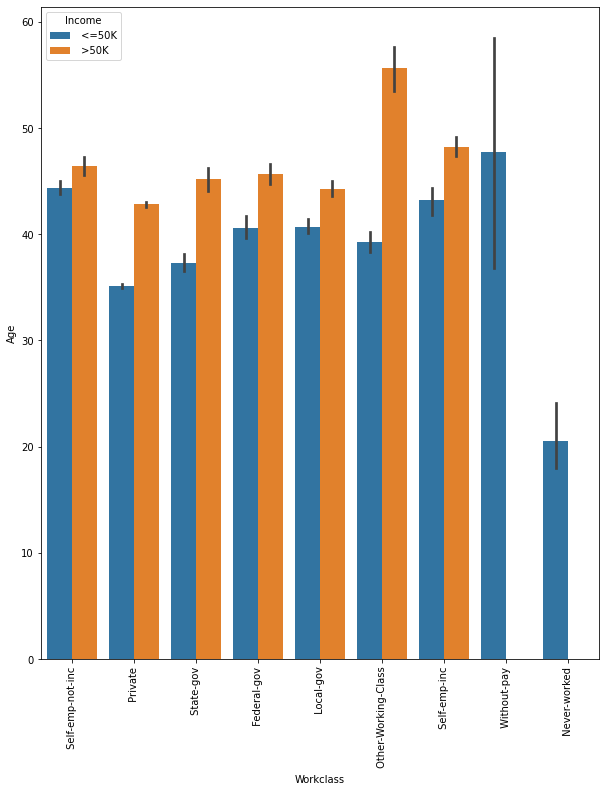

----------------------------------------------------------------------------------------------------


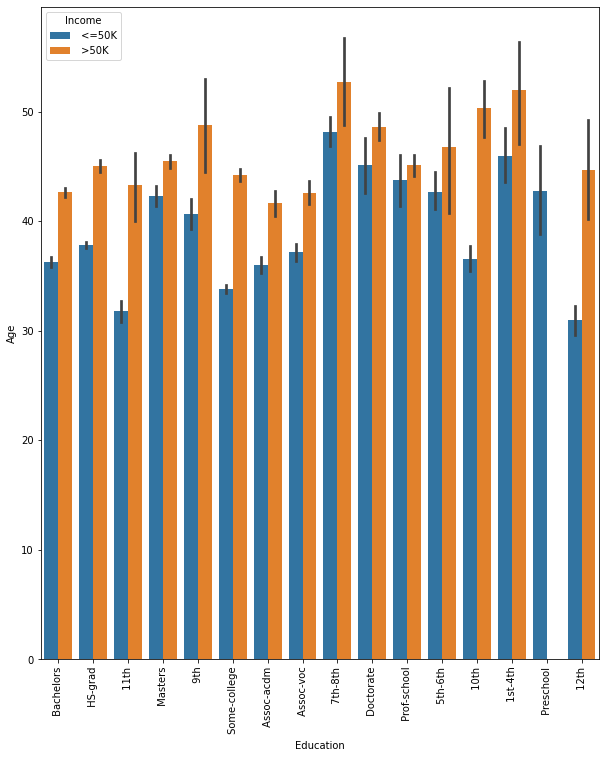

----------------------------------------------------------------------------------------------------


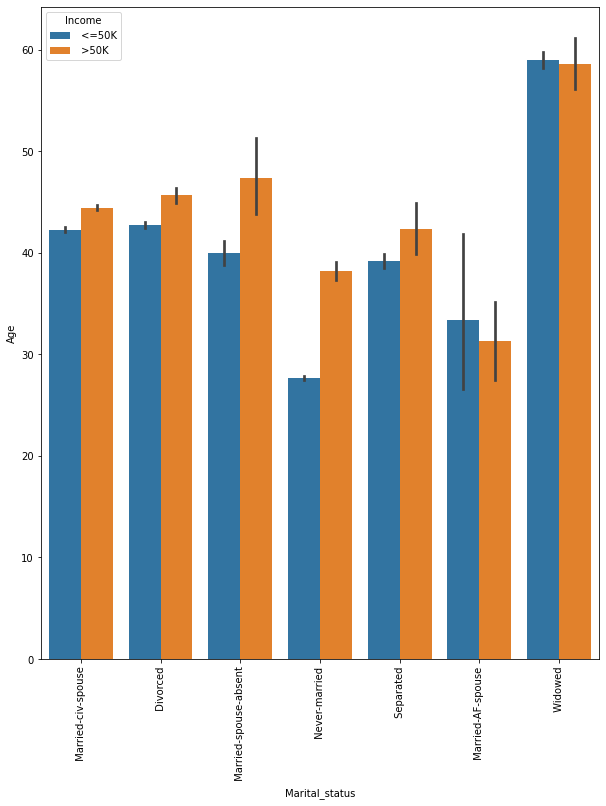

----------------------------------------------------------------------------------------------------


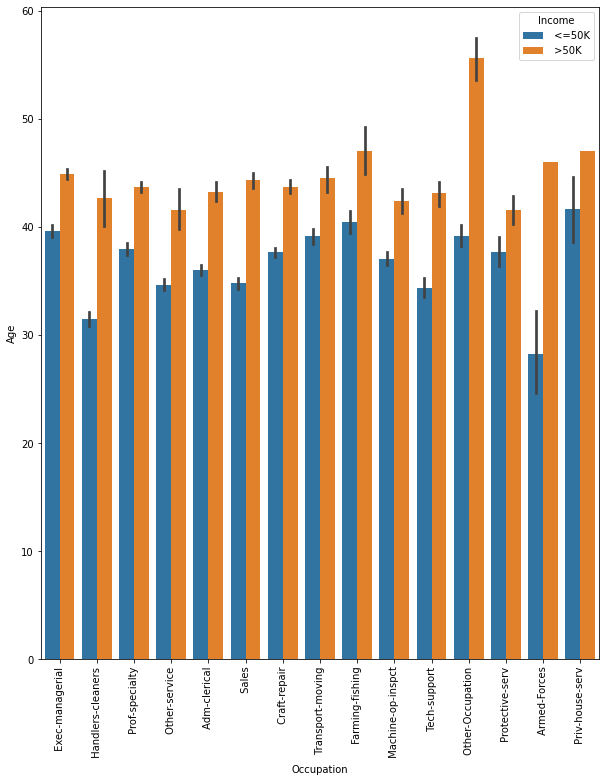

----------------------------------------------------------------------------------------------------


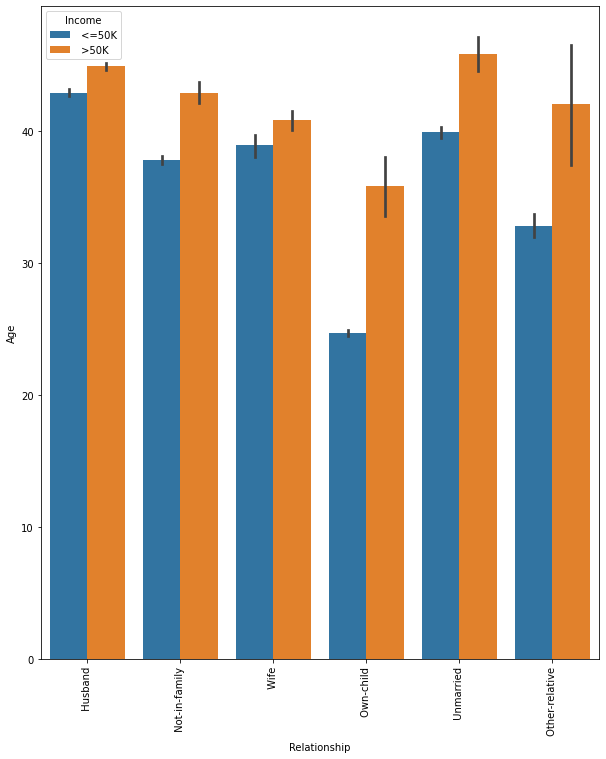

----------------------------------------------------------------------------------------------------


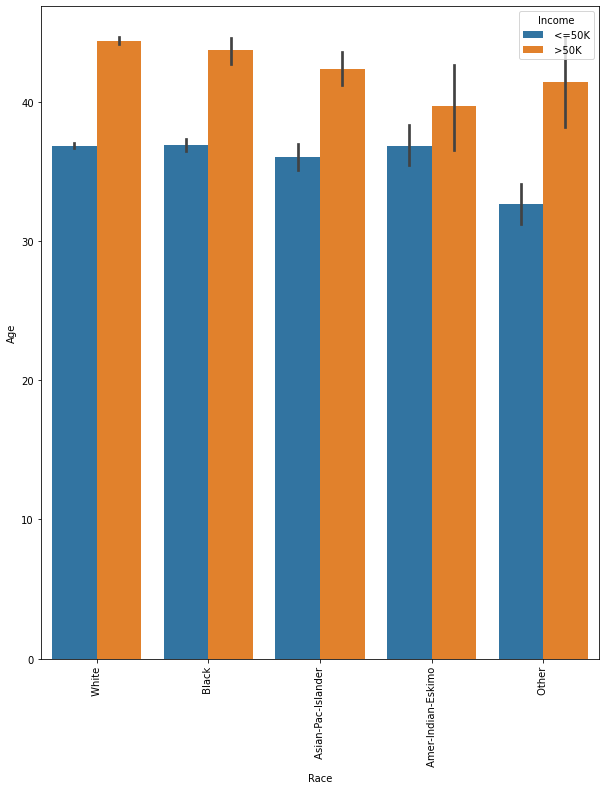

----------------------------------------------------------------------------------------------------


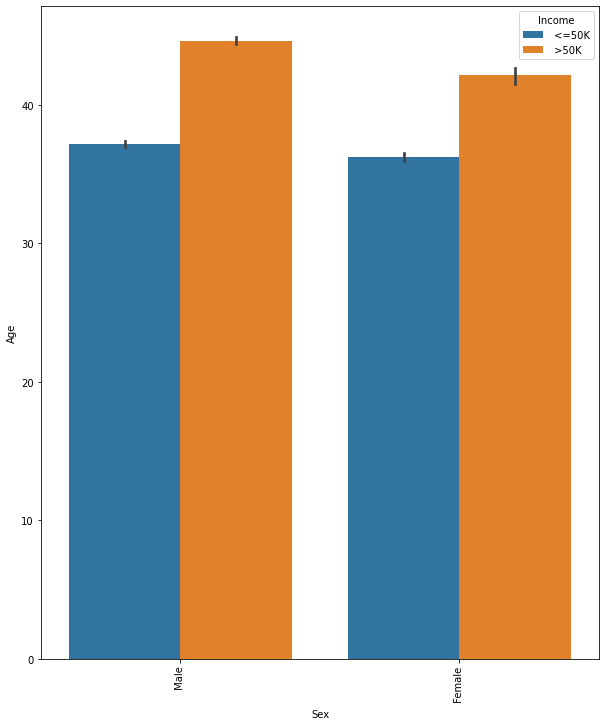

----------------------------------------------------------------------------------------------------


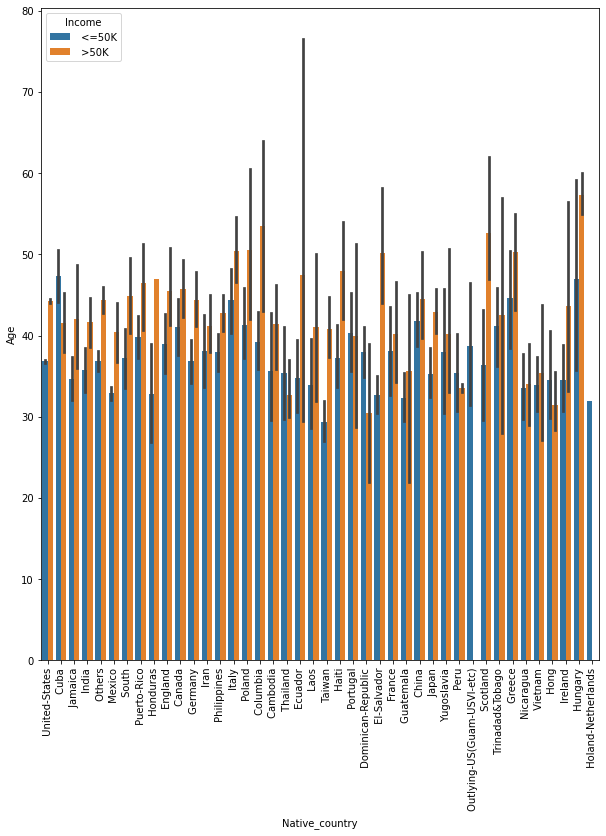

----------------------------------------------------------------------------------------------------


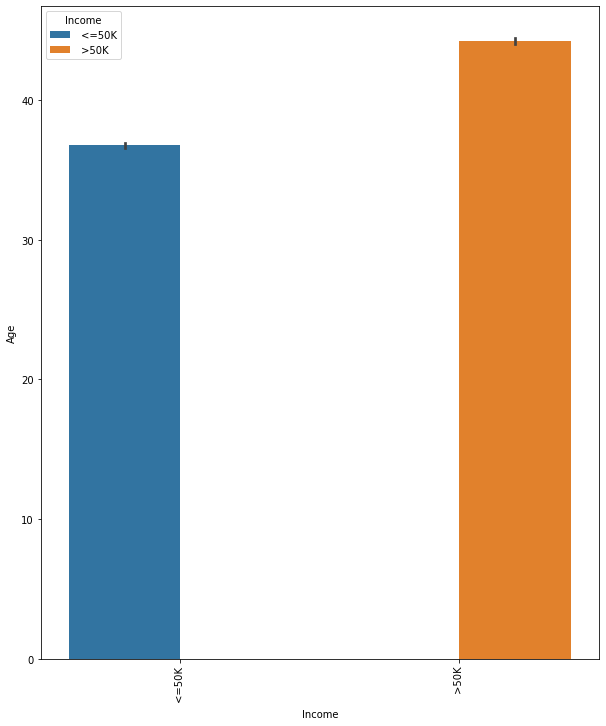

----------------------------------------------------------------------------------------------------


In [47]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.barplot(df[c],df.Age,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Age')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

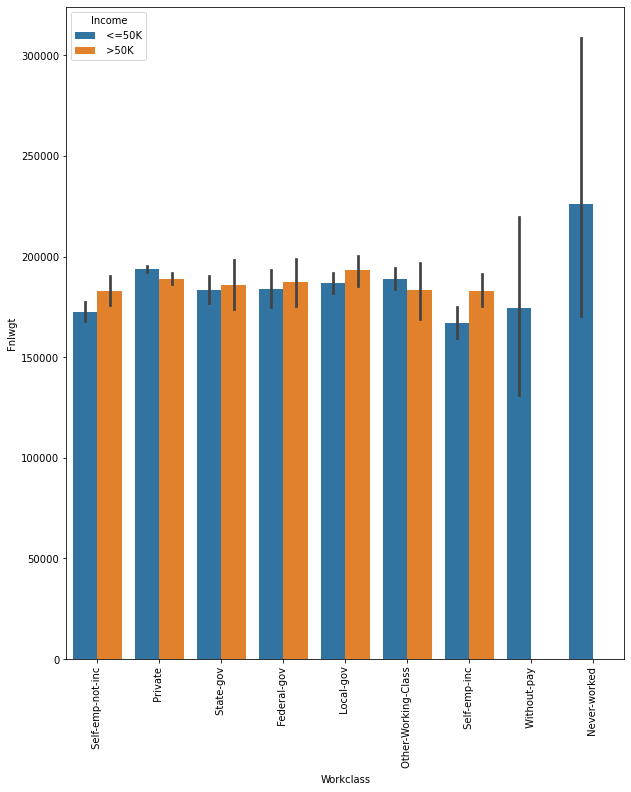

----------------------------------------------------------------------------------------------------


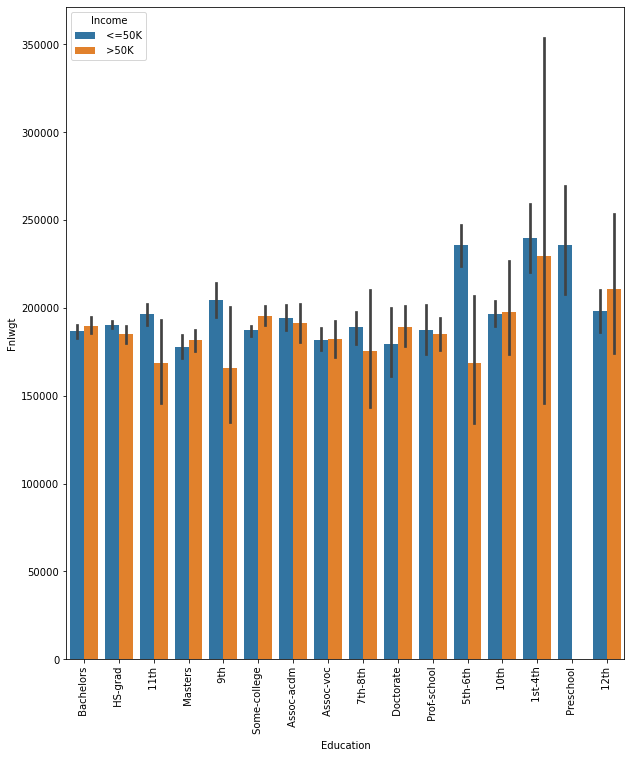

----------------------------------------------------------------------------------------------------


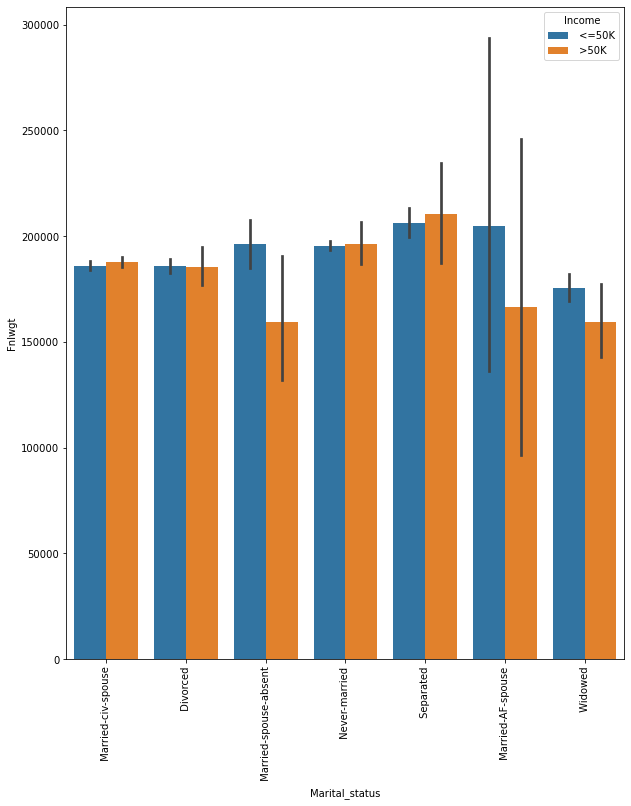

----------------------------------------------------------------------------------------------------


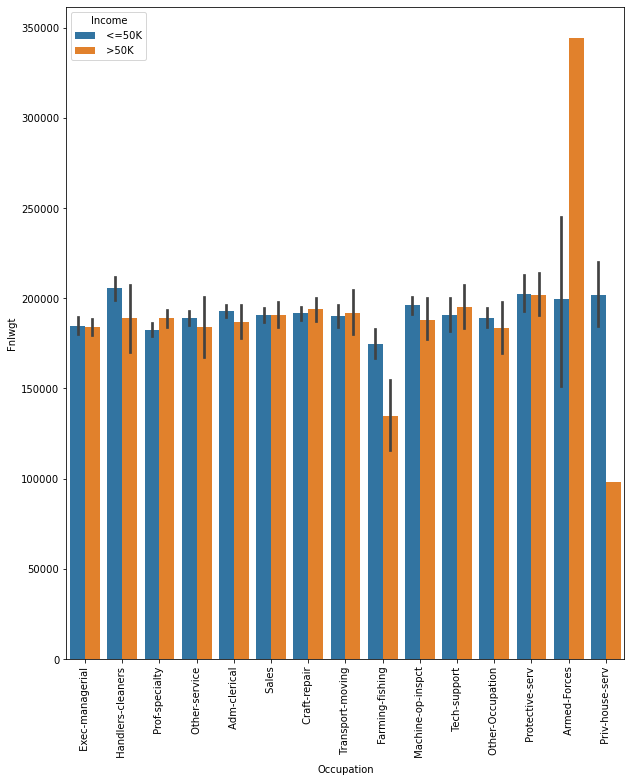

----------------------------------------------------------------------------------------------------


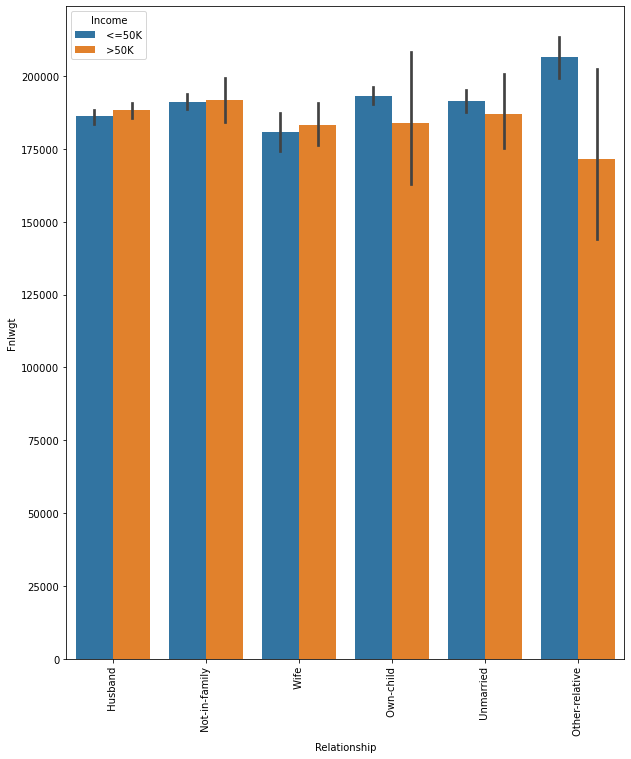

----------------------------------------------------------------------------------------------------


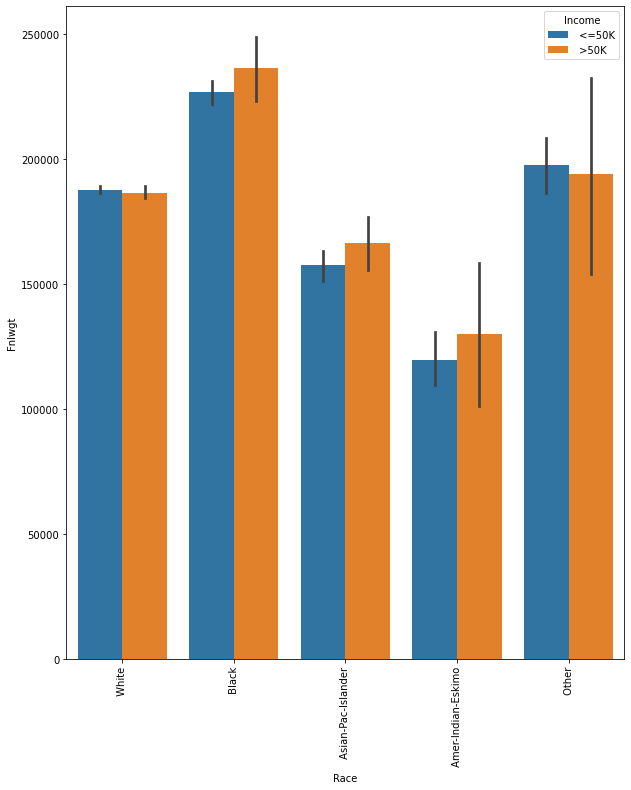

----------------------------------------------------------------------------------------------------


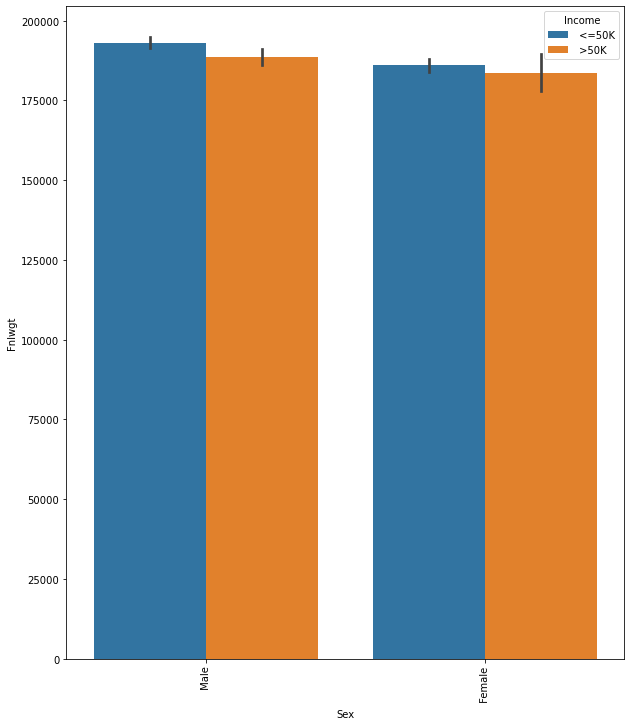

----------------------------------------------------------------------------------------------------


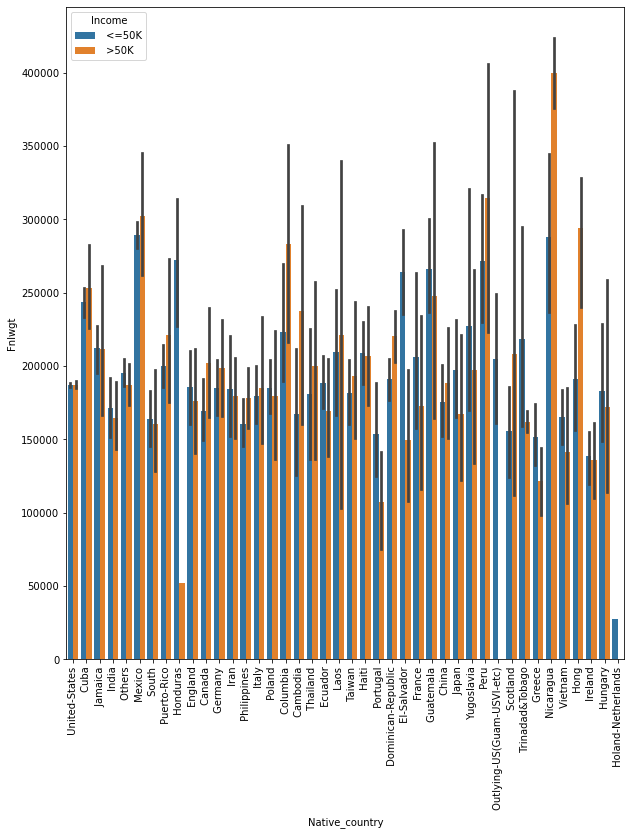

----------------------------------------------------------------------------------------------------


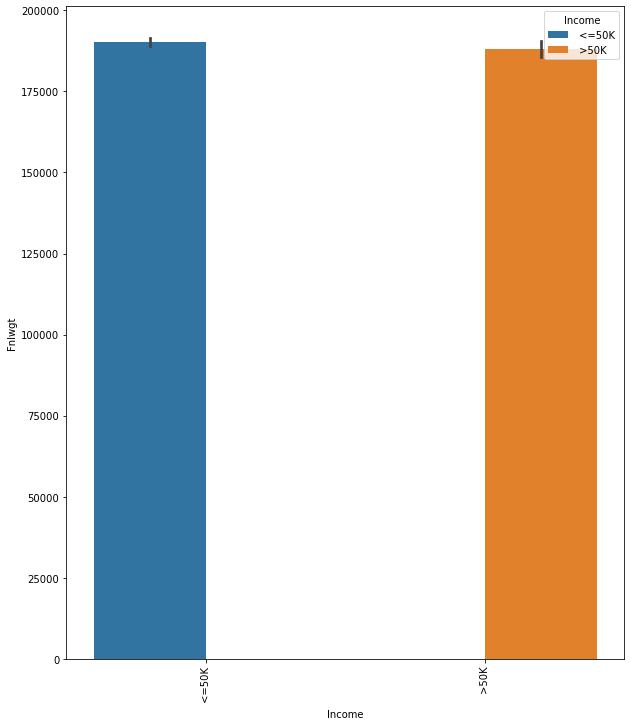

----------------------------------------------------------------------------------------------------


In [48]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.barplot(df[c],df.Fnlwgt,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Fnlwgt')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

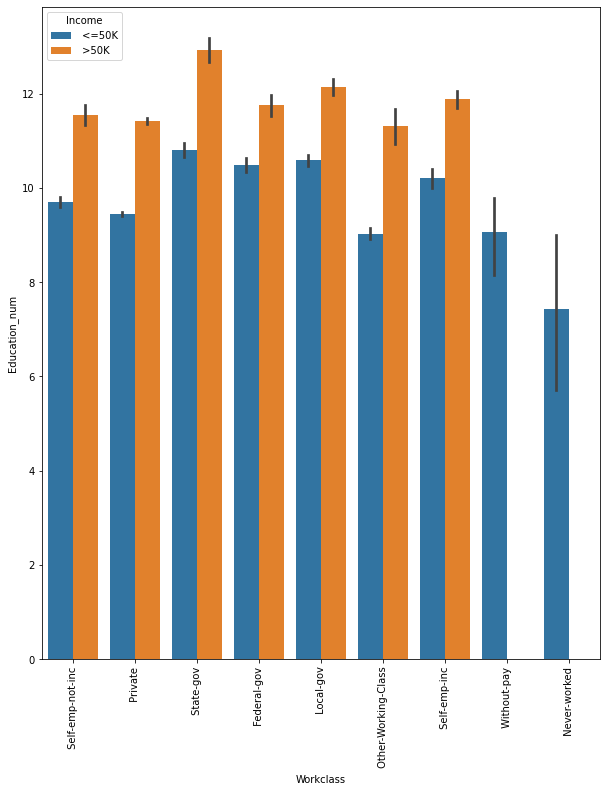

----------------------------------------------------------------------------------------------------


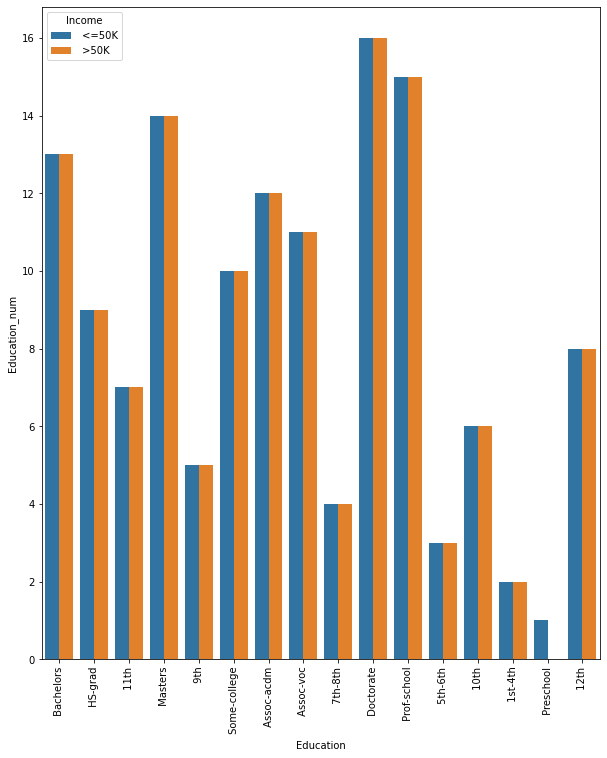

----------------------------------------------------------------------------------------------------


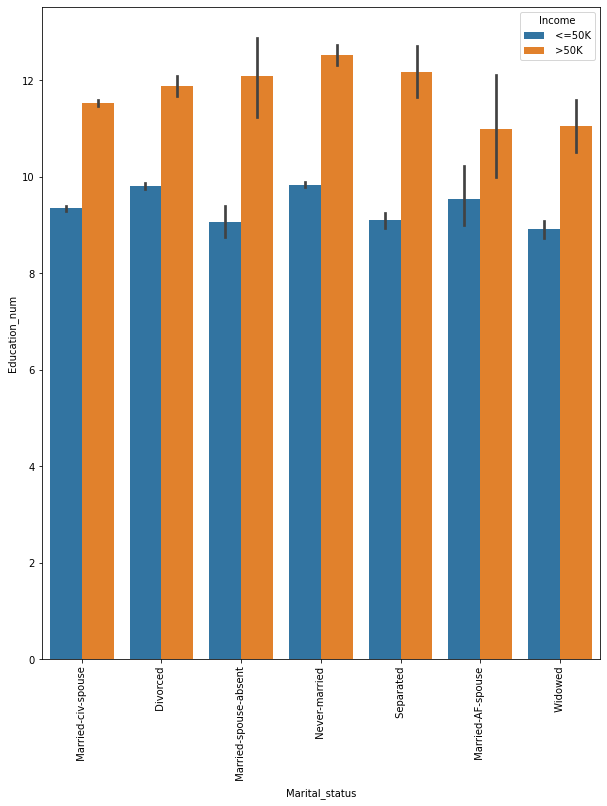

----------------------------------------------------------------------------------------------------


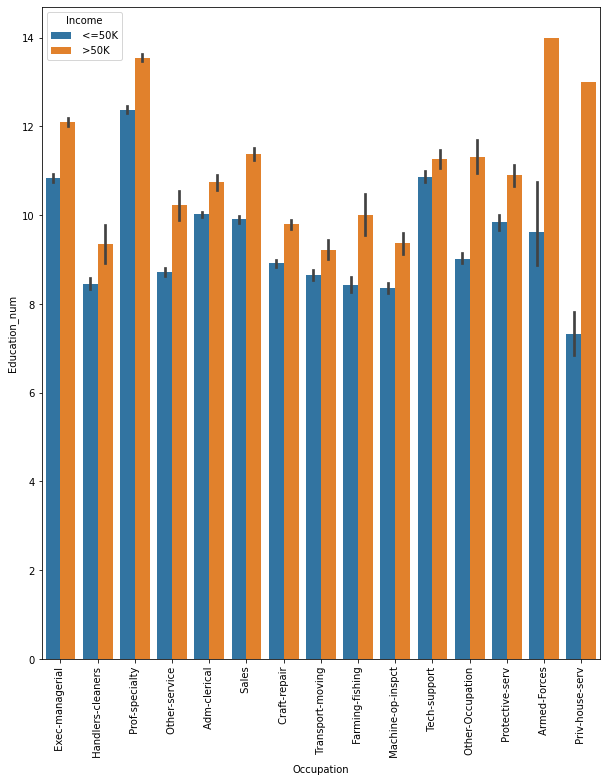

----------------------------------------------------------------------------------------------------


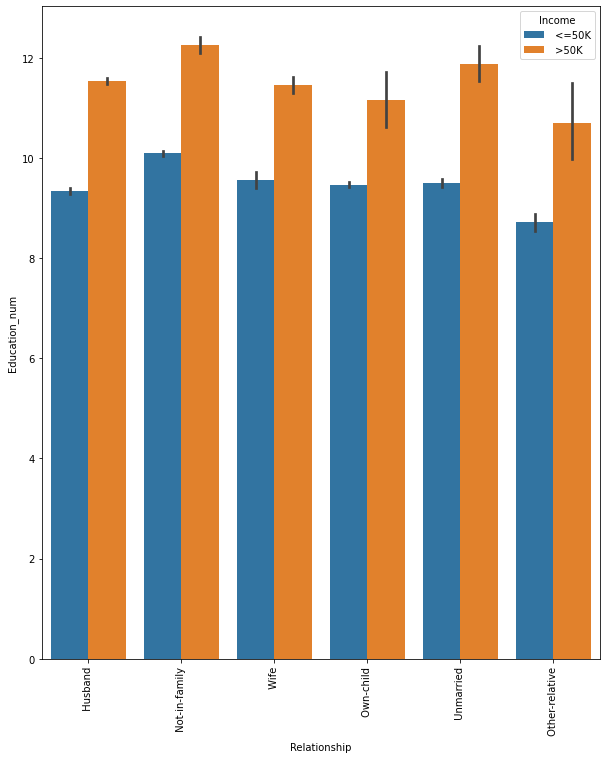

----------------------------------------------------------------------------------------------------


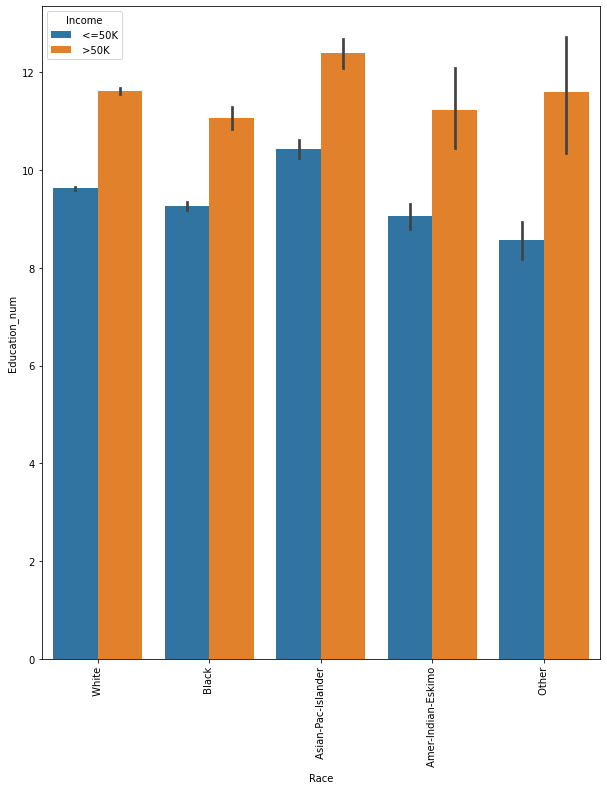

----------------------------------------------------------------------------------------------------


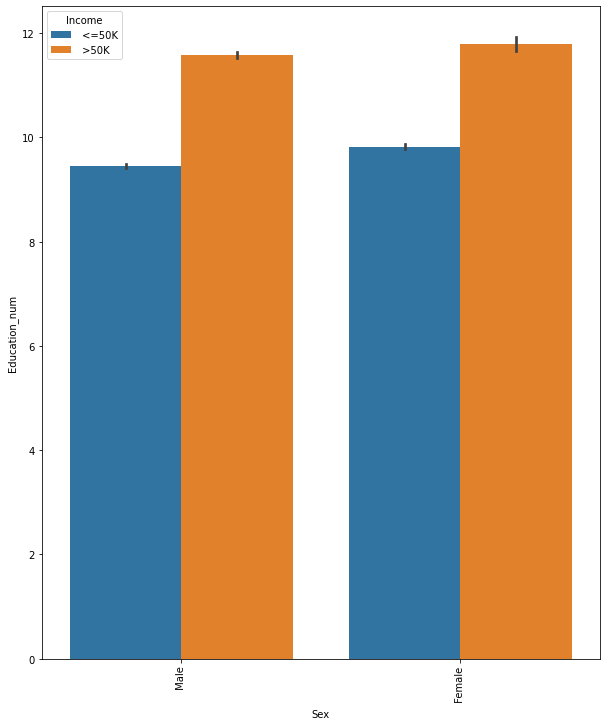

----------------------------------------------------------------------------------------------------


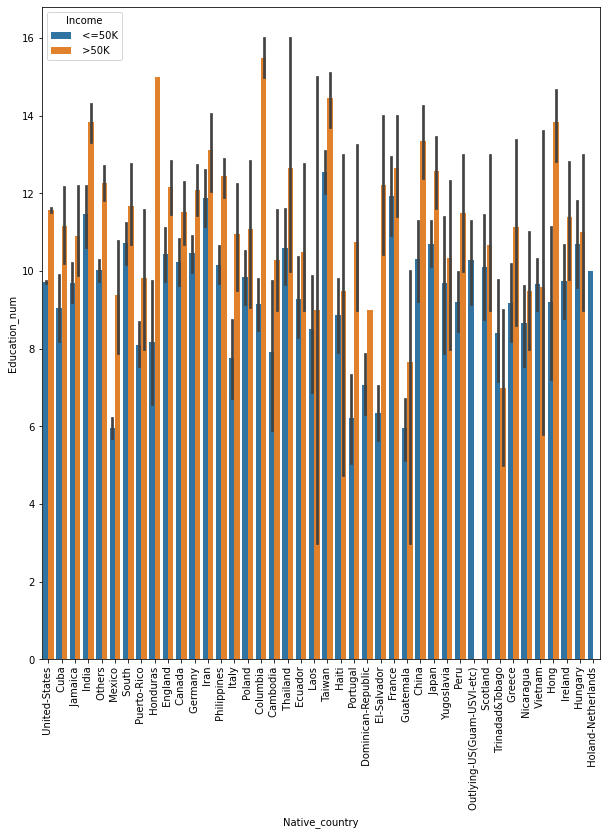

----------------------------------------------------------------------------------------------------


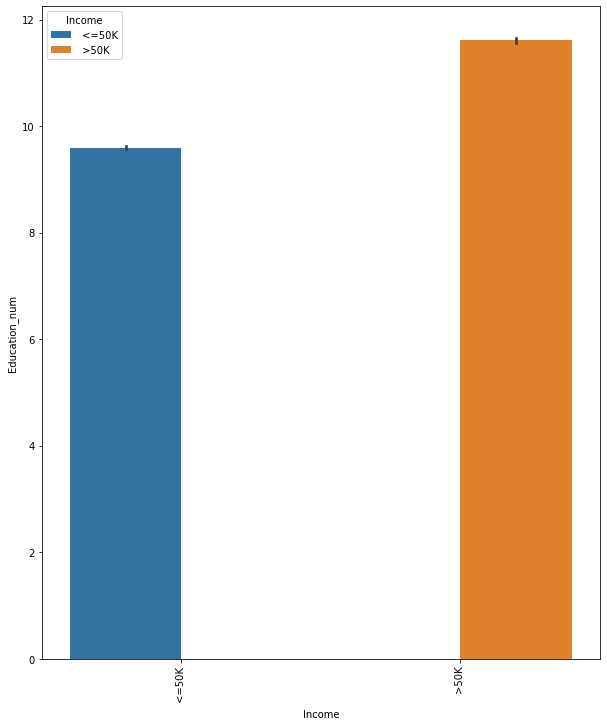

----------------------------------------------------------------------------------------------------


In [49]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.barplot(df[c],df.Education_num,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Education_num')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

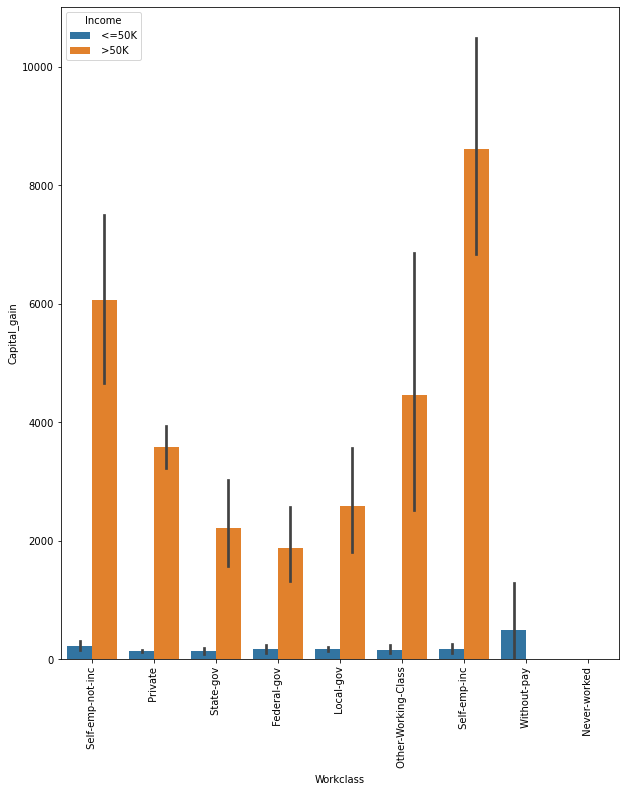

----------------------------------------------------------------------------------------------------


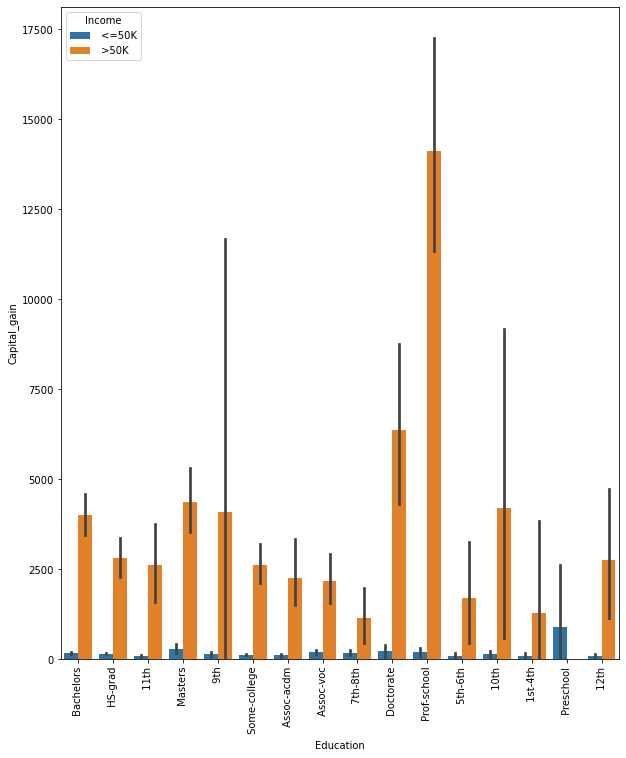

----------------------------------------------------------------------------------------------------


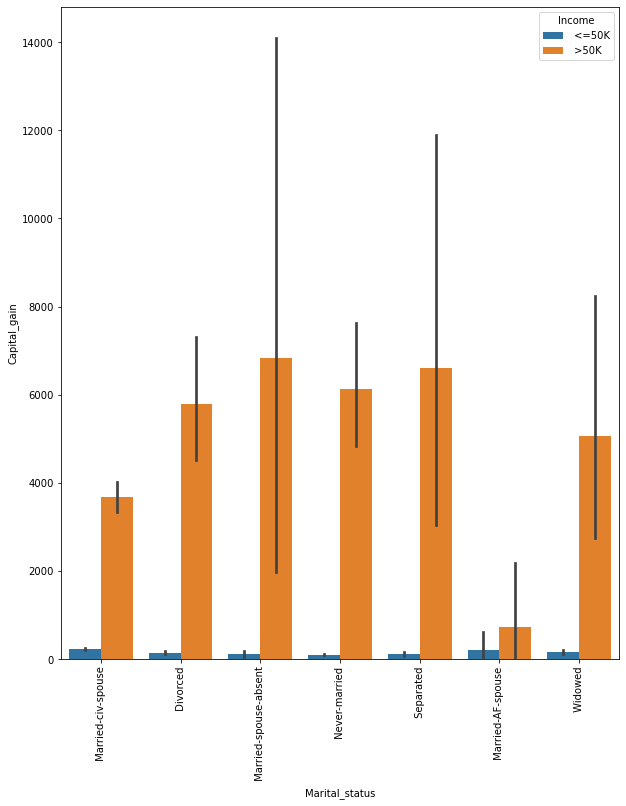

----------------------------------------------------------------------------------------------------


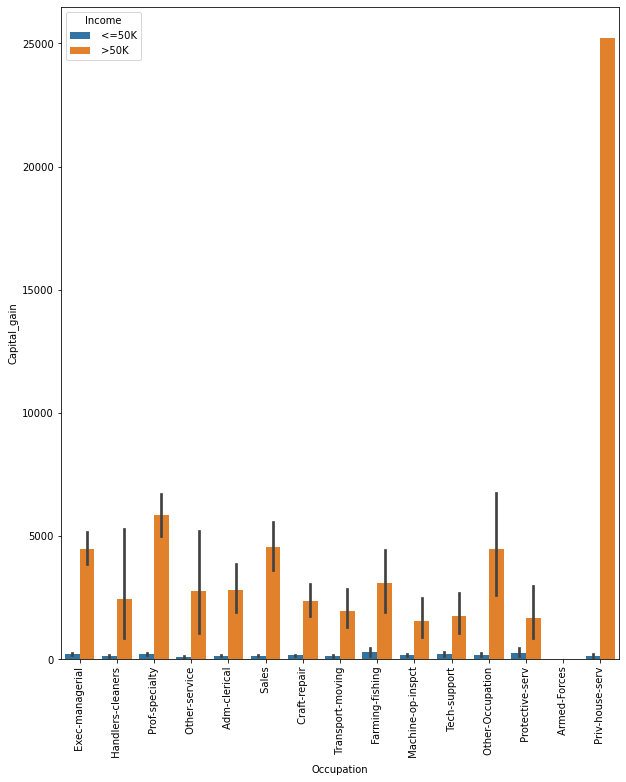

----------------------------------------------------------------------------------------------------


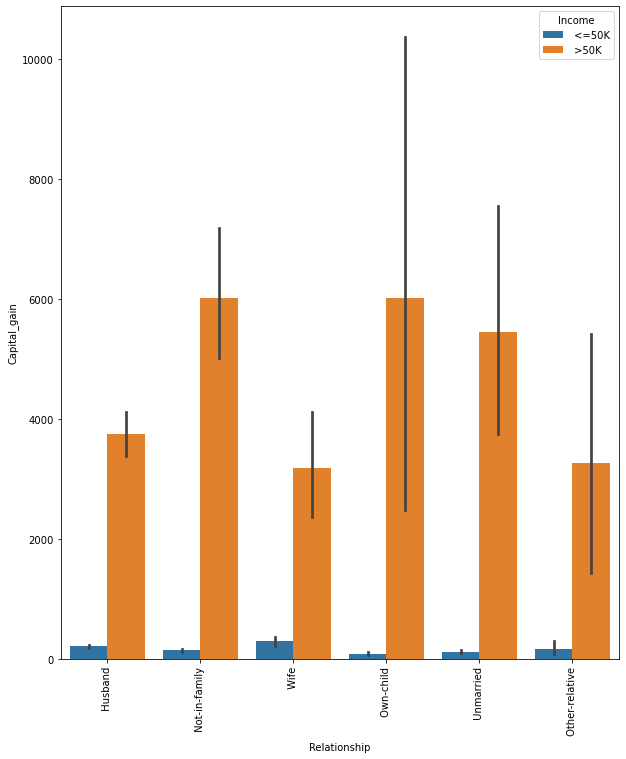

----------------------------------------------------------------------------------------------------


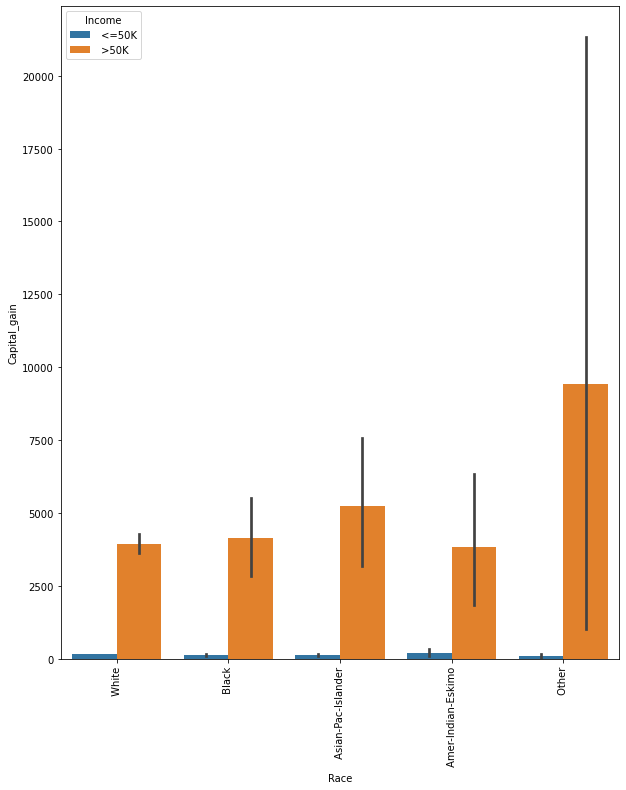

----------------------------------------------------------------------------------------------------


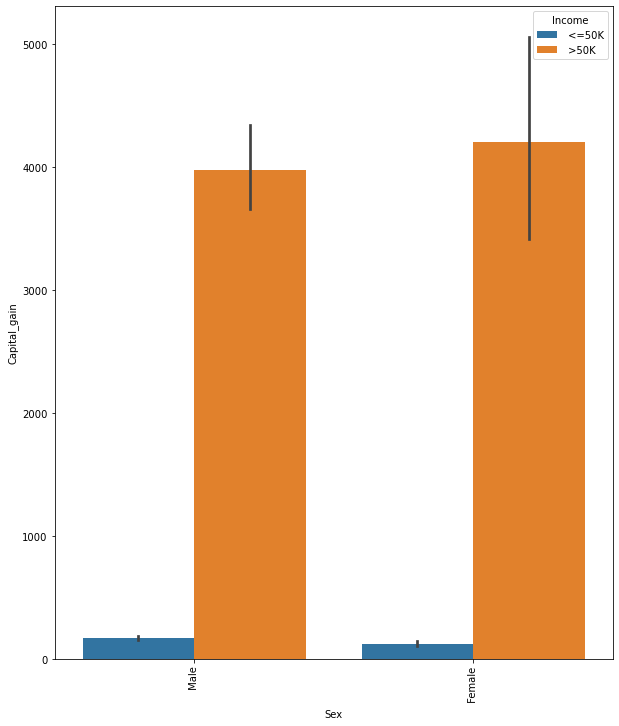

----------------------------------------------------------------------------------------------------


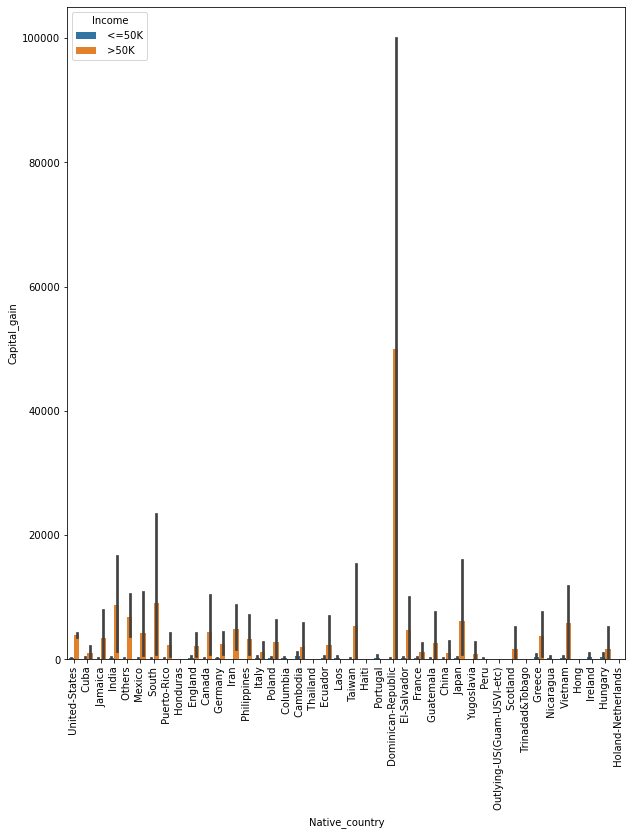

----------------------------------------------------------------------------------------------------


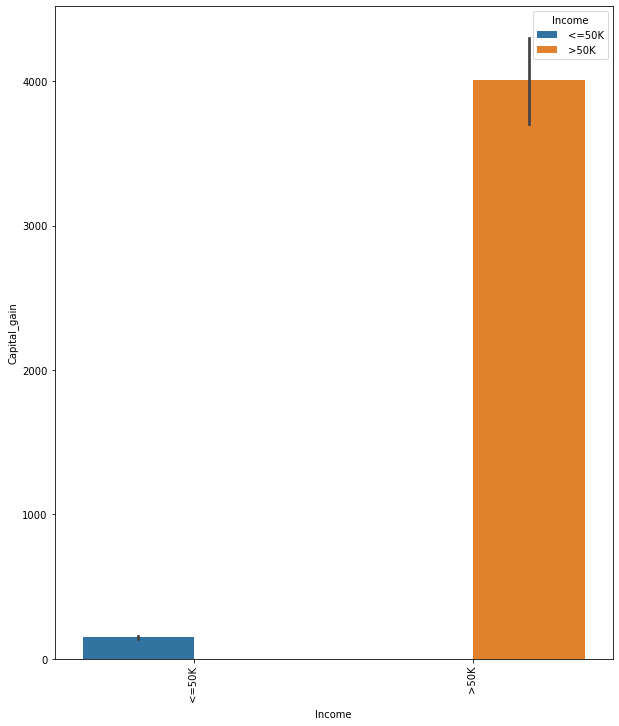

----------------------------------------------------------------------------------------------------


In [50]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.barplot(df[c],df.Capital_gain,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Capital_gain')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

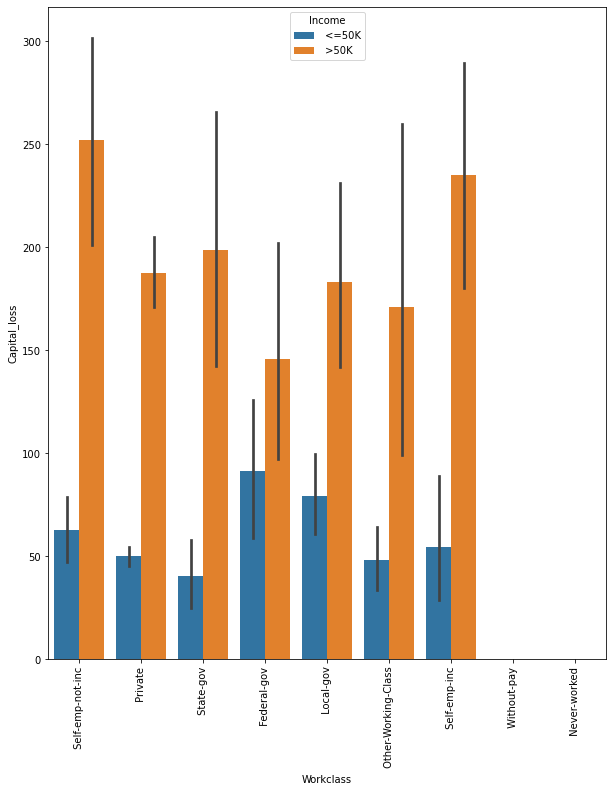

----------------------------------------------------------------------------------------------------


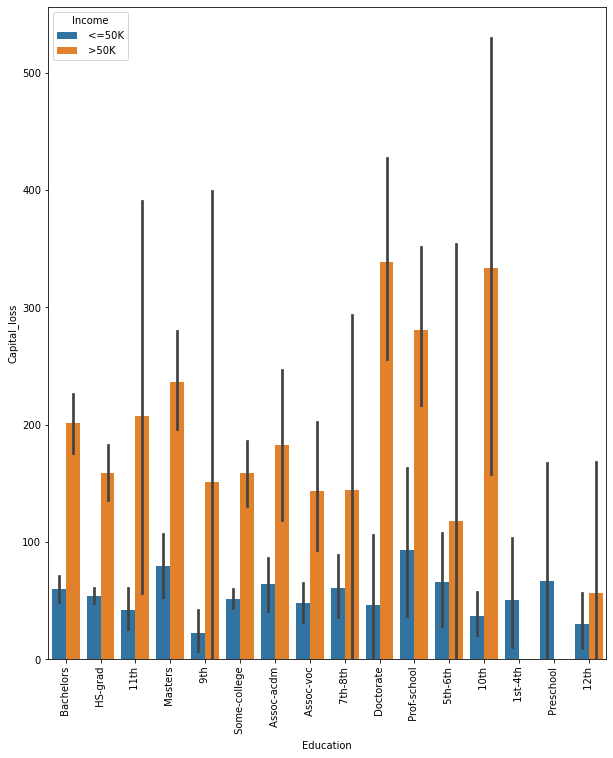

----------------------------------------------------------------------------------------------------


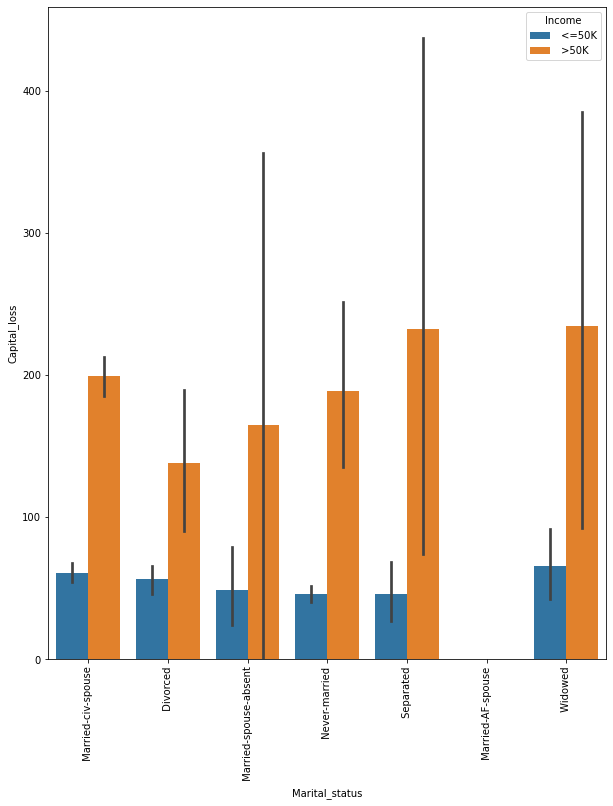

----------------------------------------------------------------------------------------------------


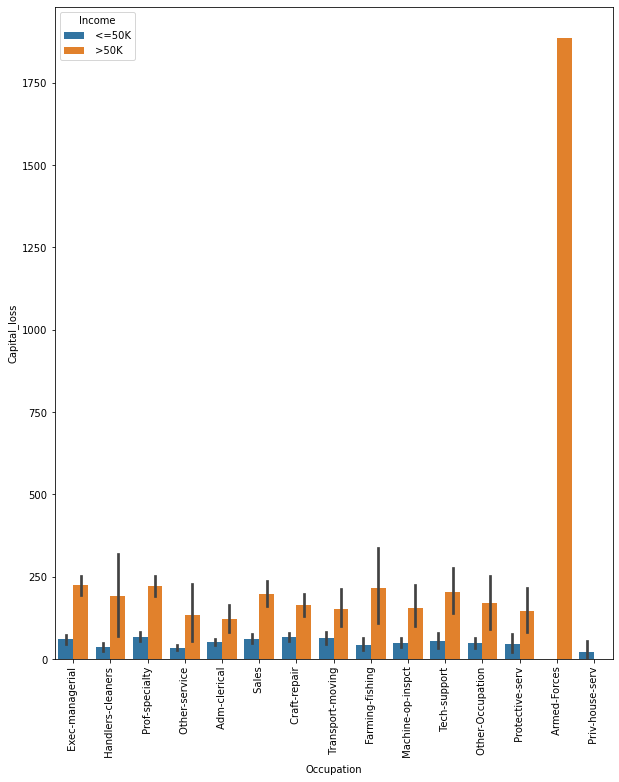

----------------------------------------------------------------------------------------------------


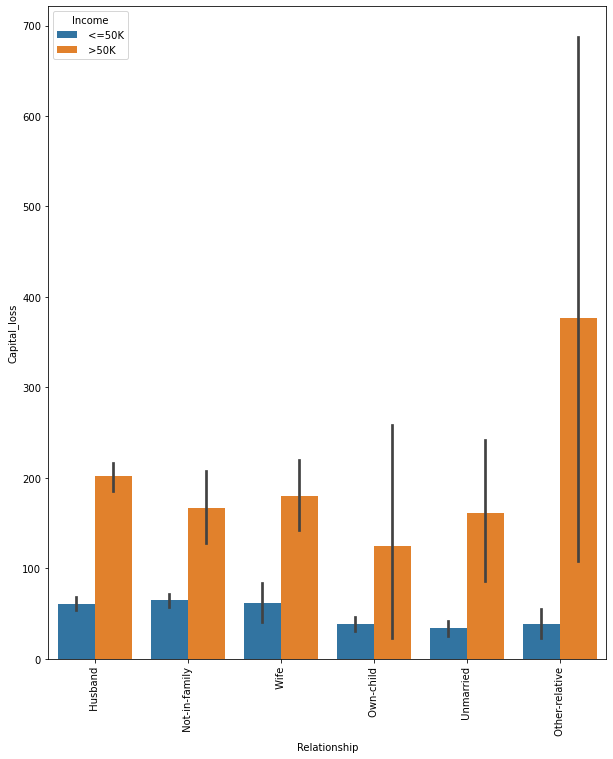

----------------------------------------------------------------------------------------------------


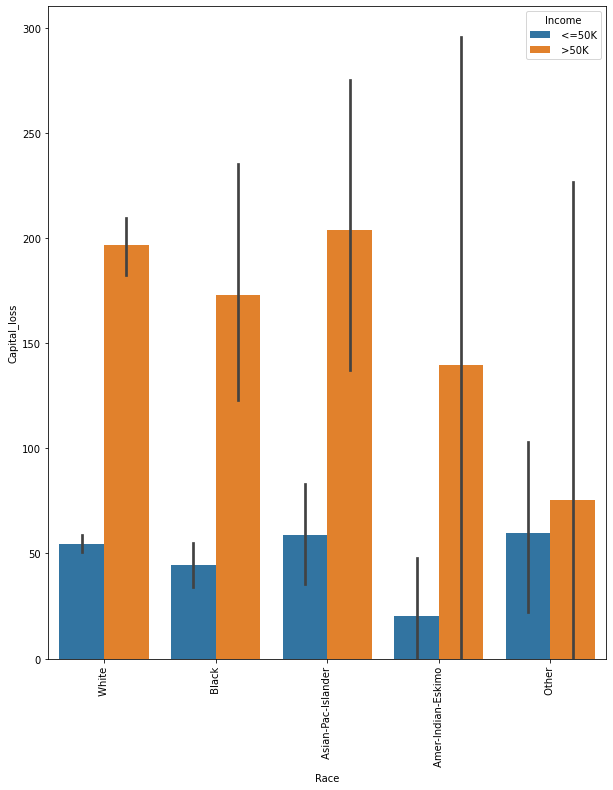

----------------------------------------------------------------------------------------------------


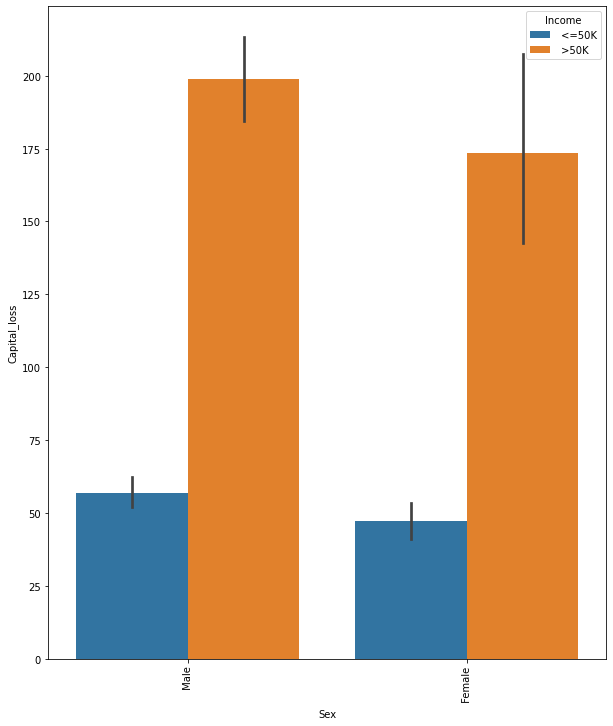

----------------------------------------------------------------------------------------------------


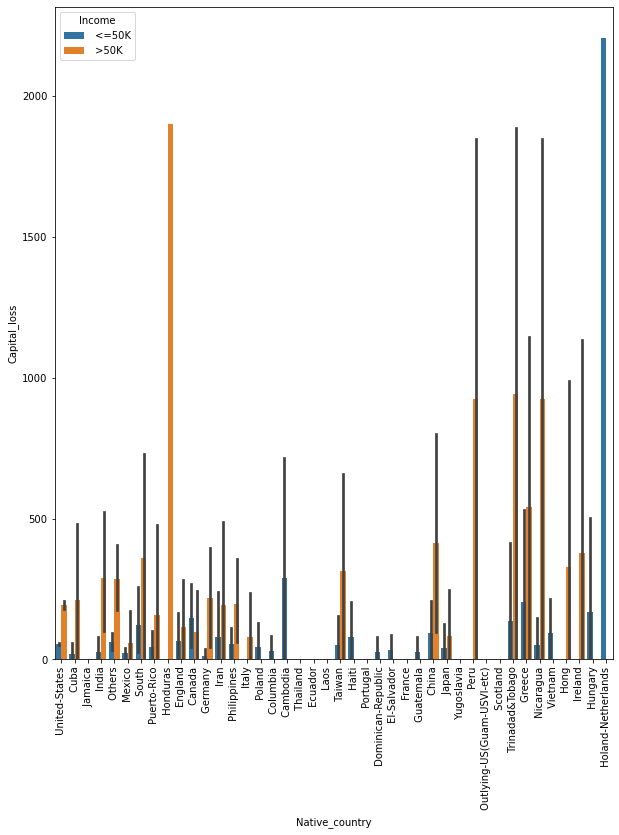

----------------------------------------------------------------------------------------------------


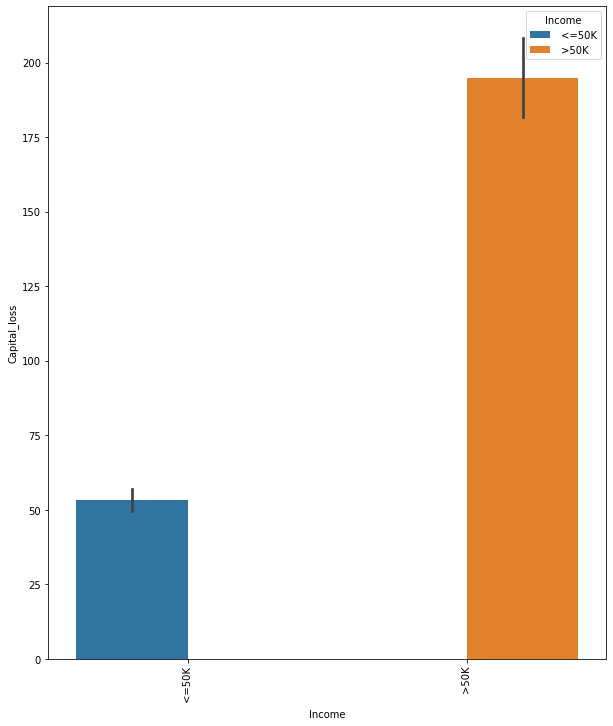

----------------------------------------------------------------------------------------------------


In [51]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.barplot(df[c],df.Capital_loss,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Capital_loss')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

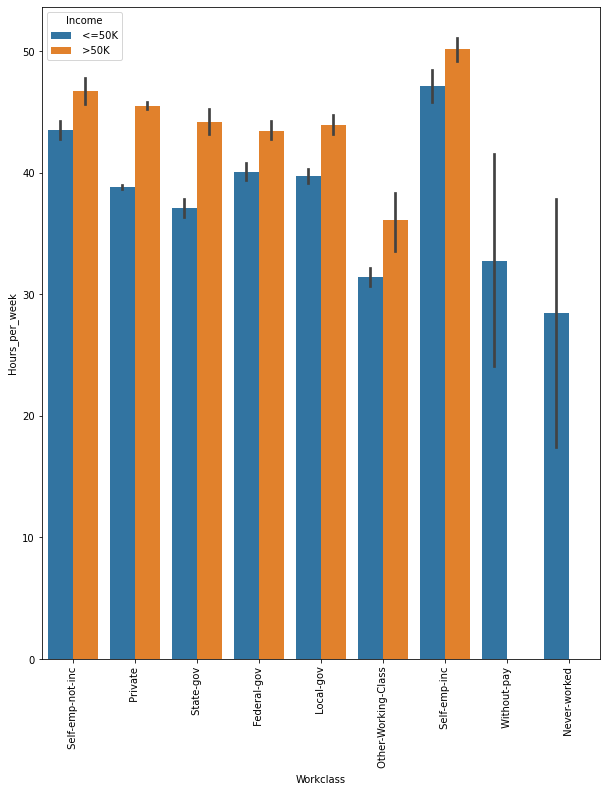

----------------------------------------------------------------------------------------------------


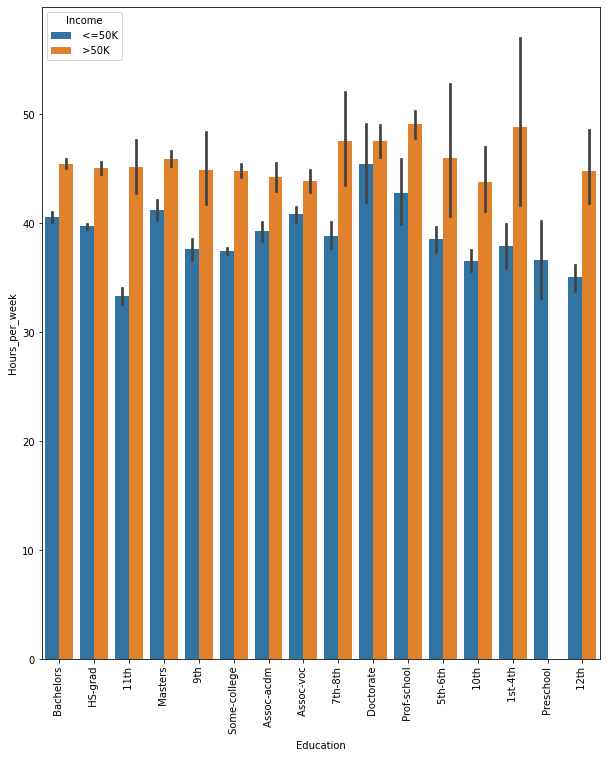

----------------------------------------------------------------------------------------------------


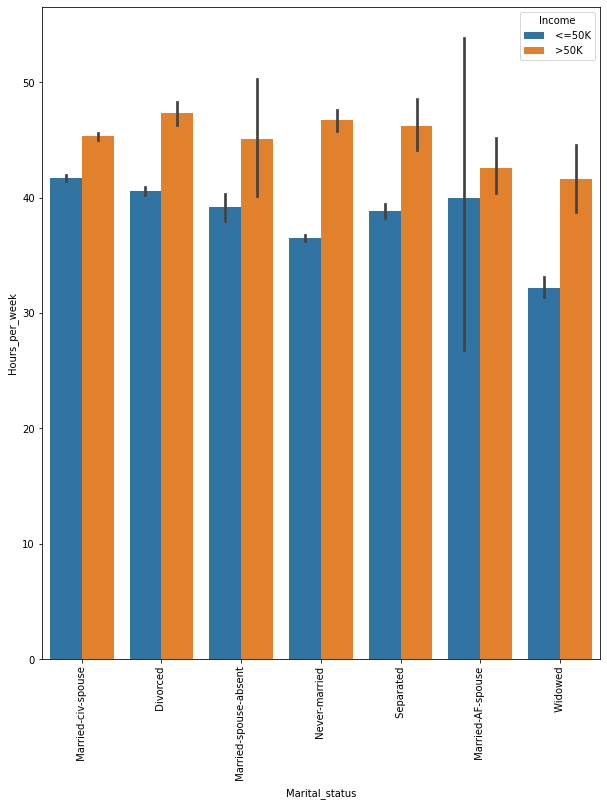

----------------------------------------------------------------------------------------------------


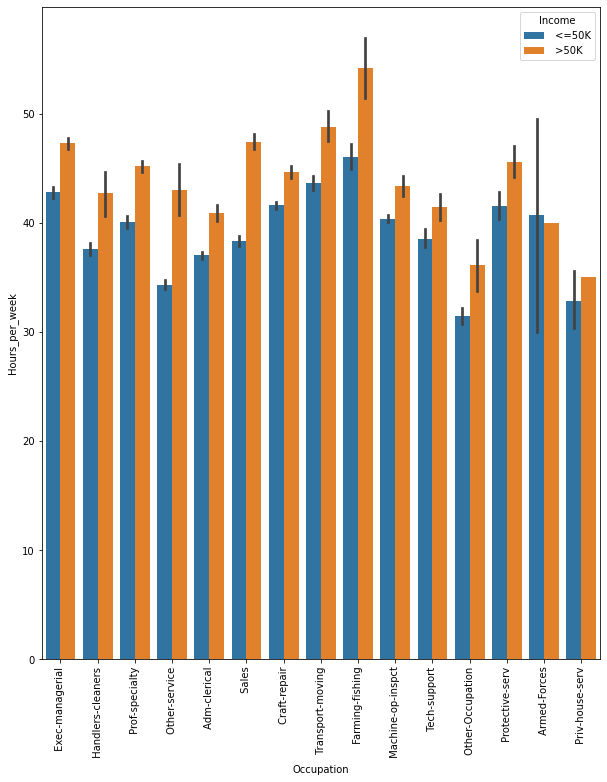

----------------------------------------------------------------------------------------------------


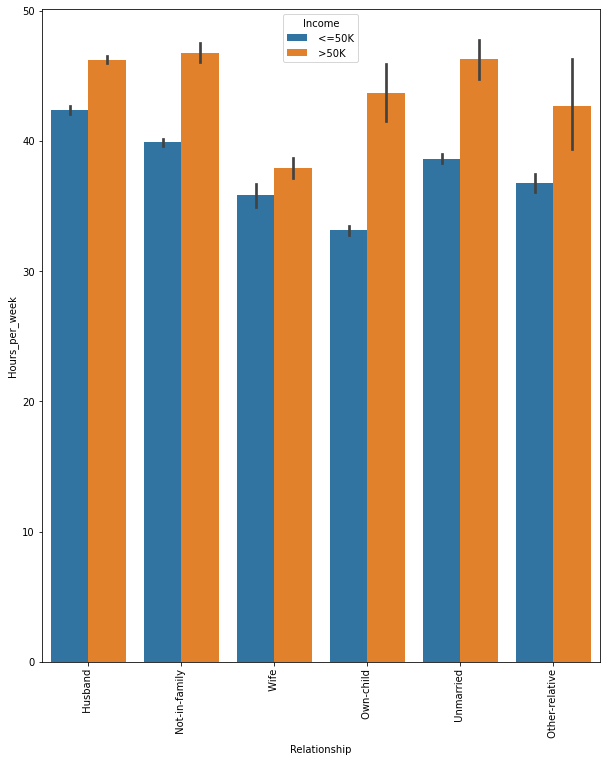

----------------------------------------------------------------------------------------------------


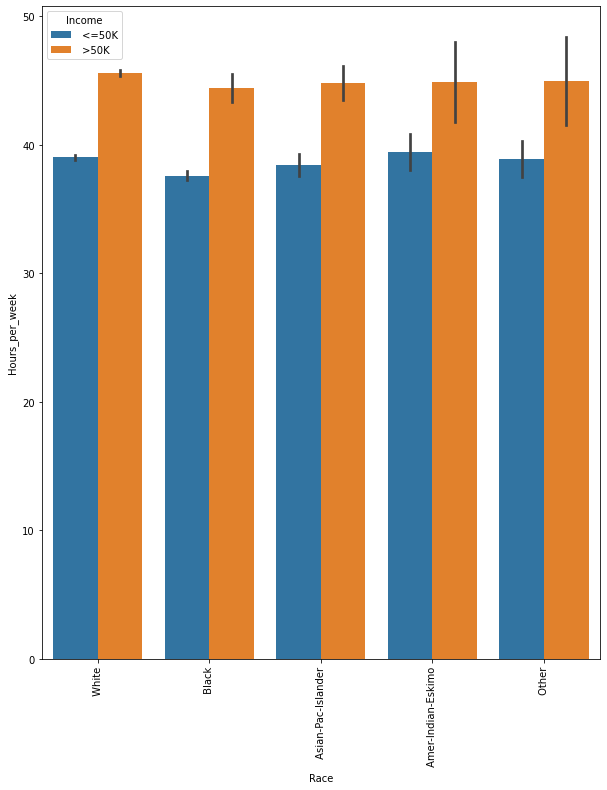

----------------------------------------------------------------------------------------------------


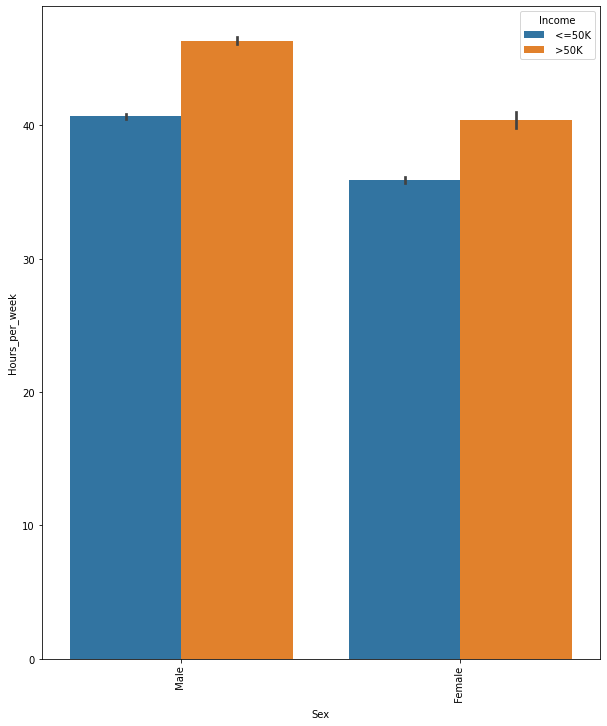

----------------------------------------------------------------------------------------------------


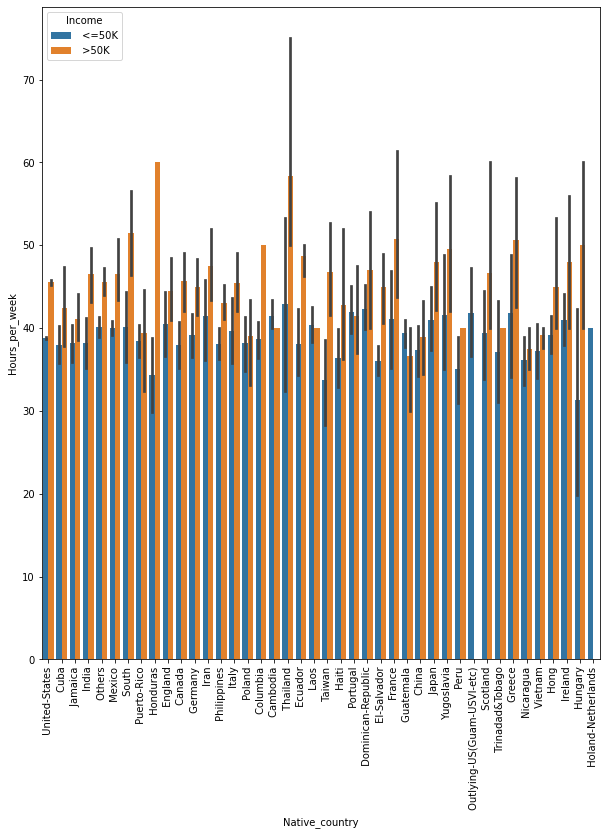

----------------------------------------------------------------------------------------------------


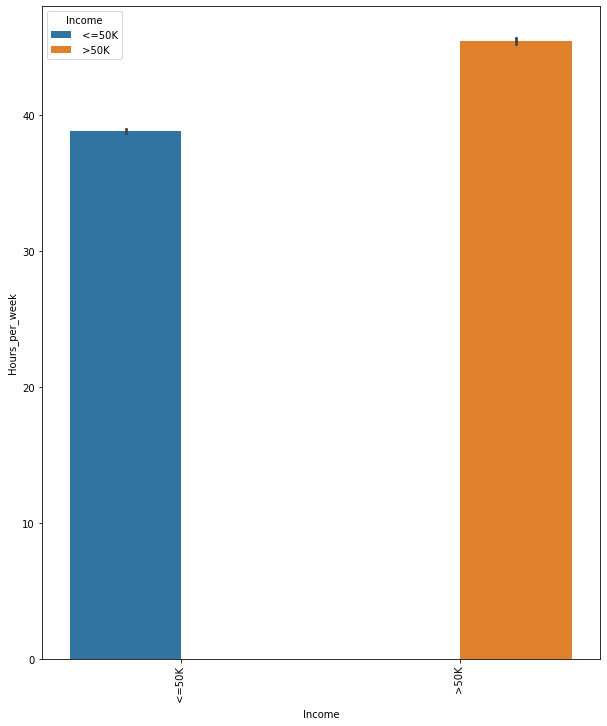

----------------------------------------------------------------------------------------------------


In [52]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.barplot(df[c],df.Hours_per_week,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Hours_per_week')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

I created a bar plot with every numerical vs categorical variables with hue being the target variable i.e Income

2]Strip Plot -- It basically creates a scatter plot based on the category.

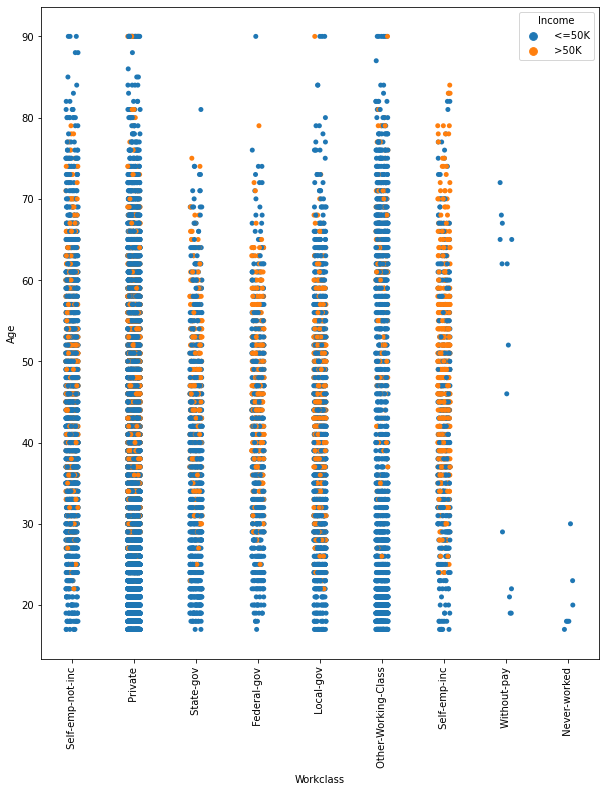

----------------------------------------------------------------------------------------------------


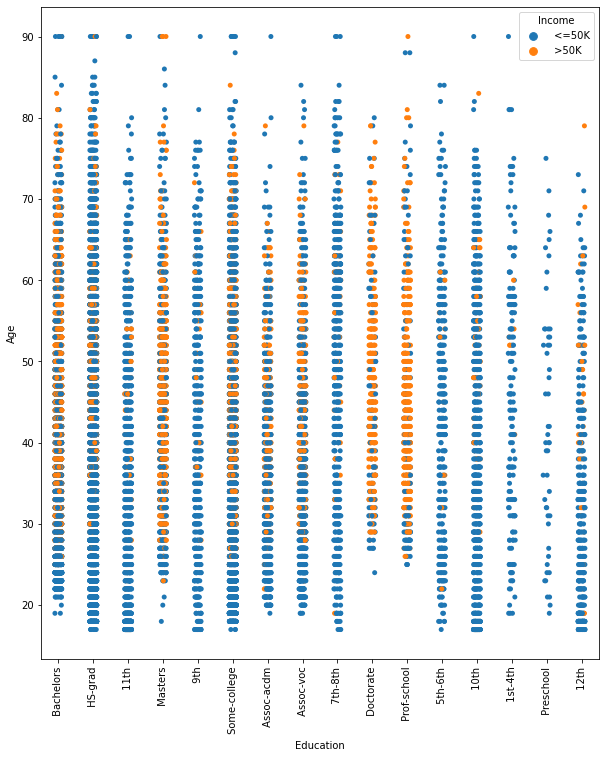

----------------------------------------------------------------------------------------------------


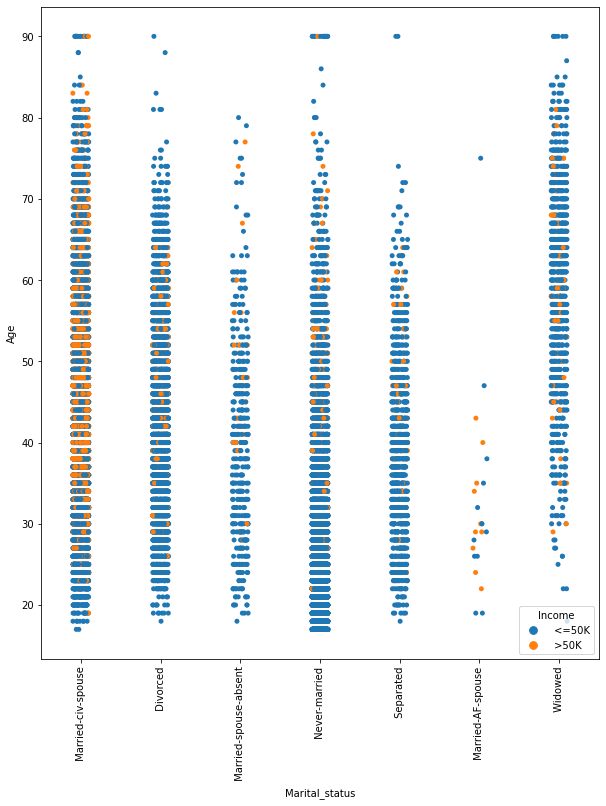

----------------------------------------------------------------------------------------------------


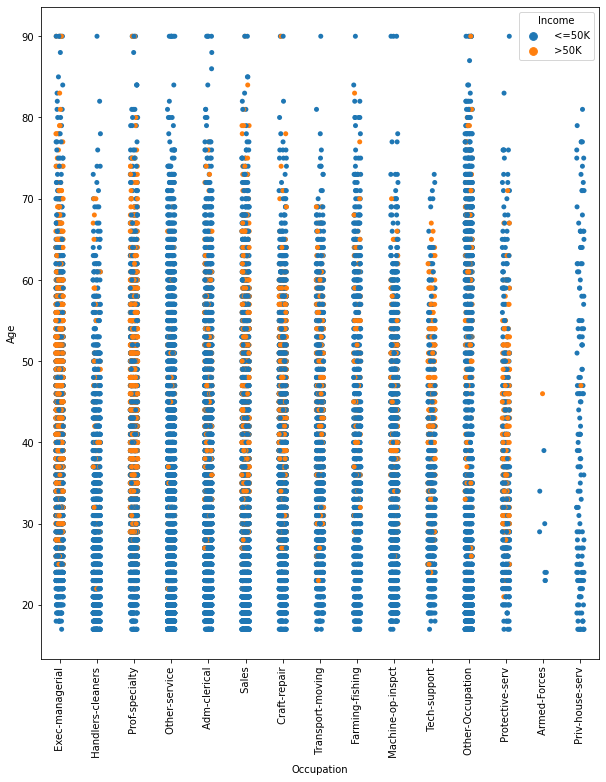

----------------------------------------------------------------------------------------------------


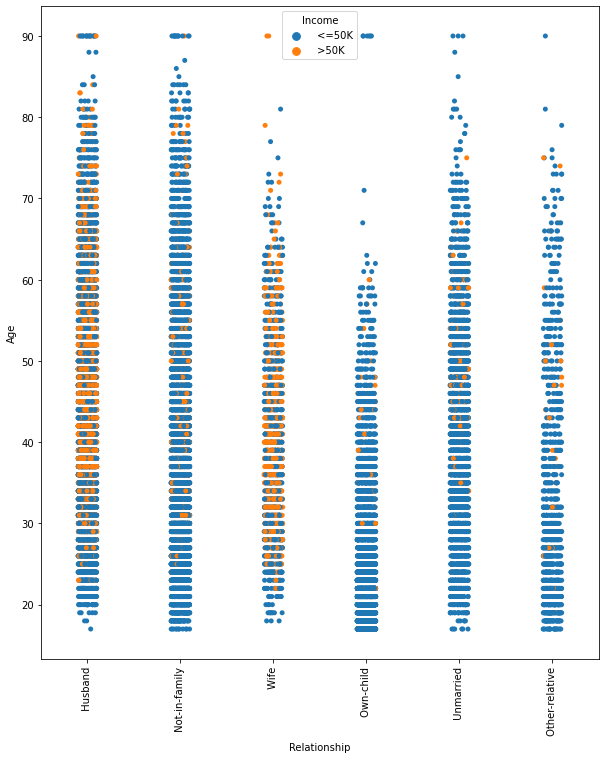

----------------------------------------------------------------------------------------------------


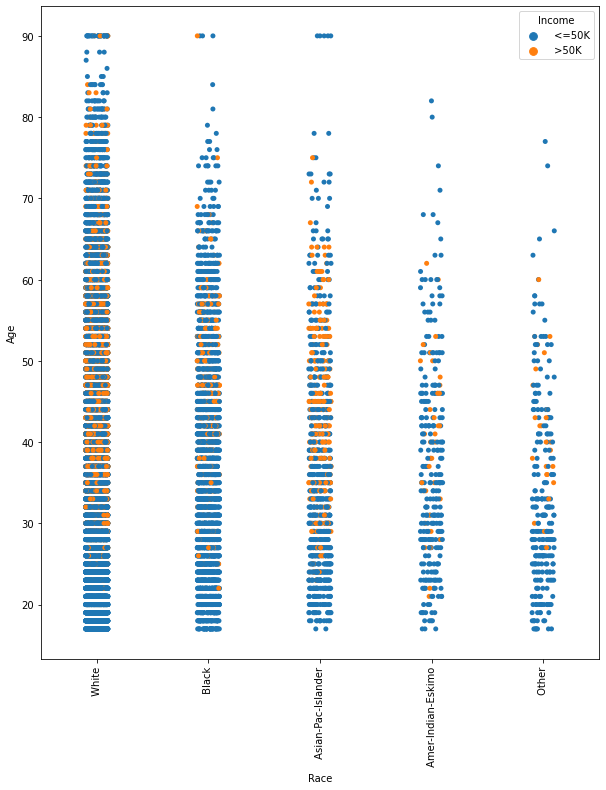

----------------------------------------------------------------------------------------------------


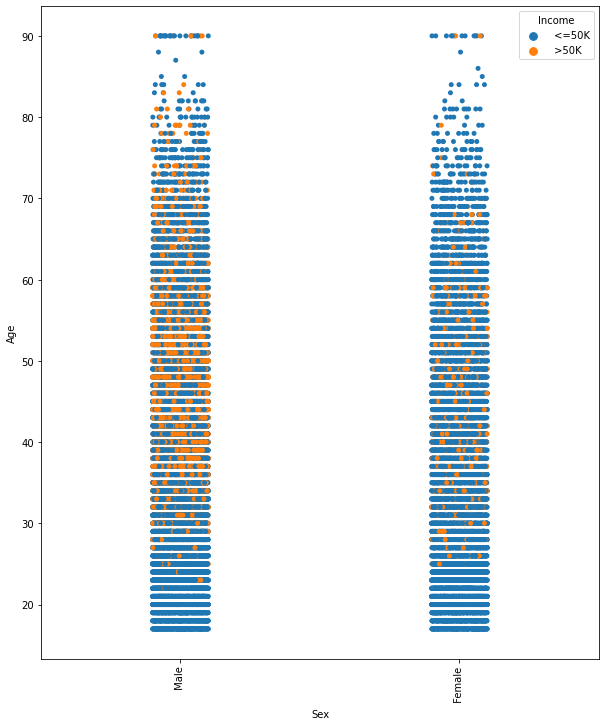

----------------------------------------------------------------------------------------------------


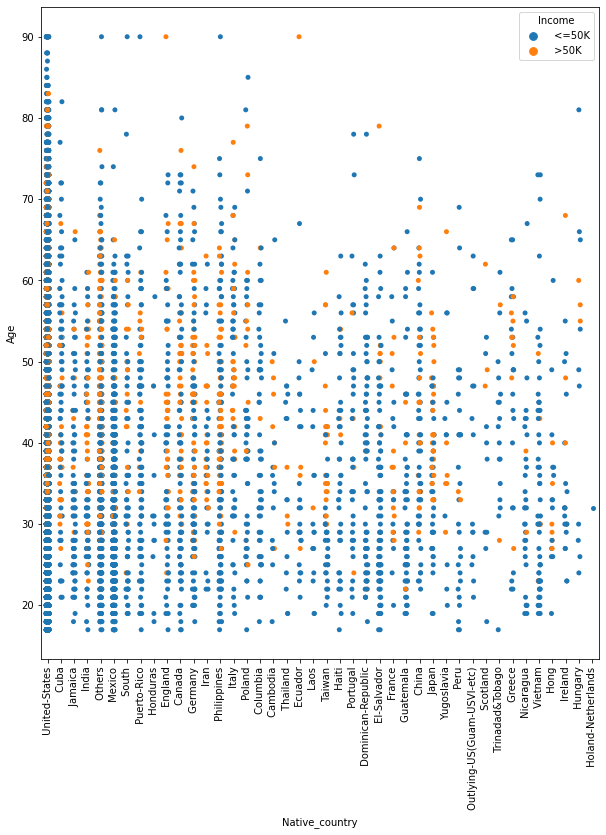

----------------------------------------------------------------------------------------------------


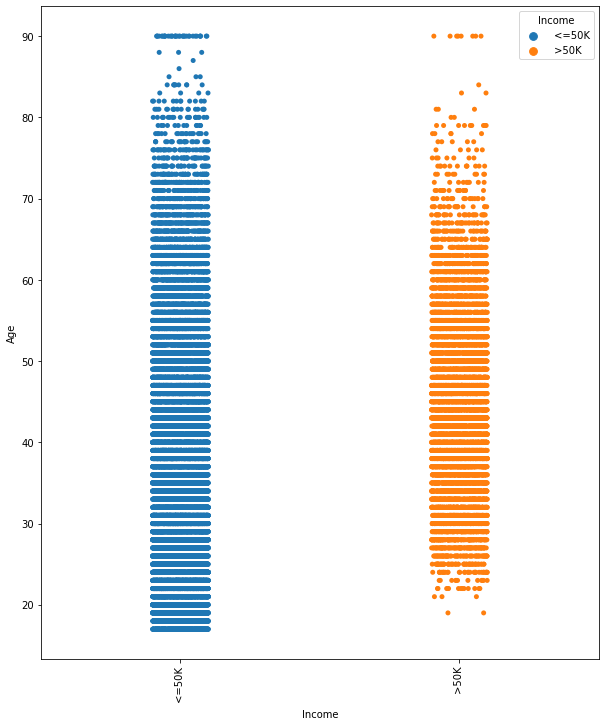

----------------------------------------------------------------------------------------------------


In [53]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.stripplot(df[c],df.Age,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Age')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

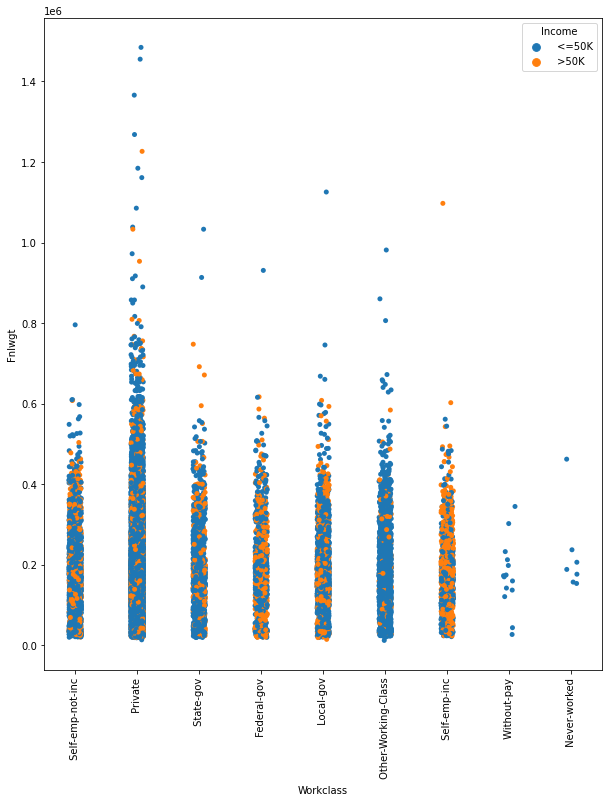

----------------------------------------------------------------------------------------------------


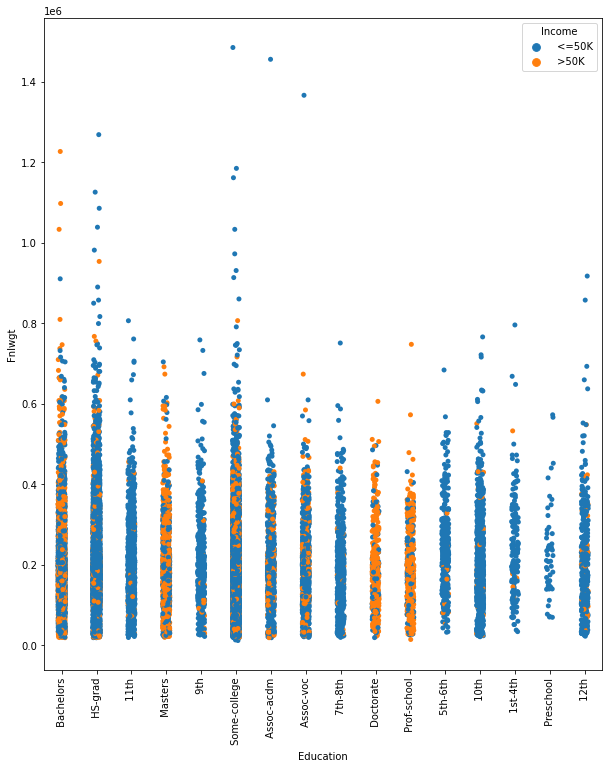

----------------------------------------------------------------------------------------------------


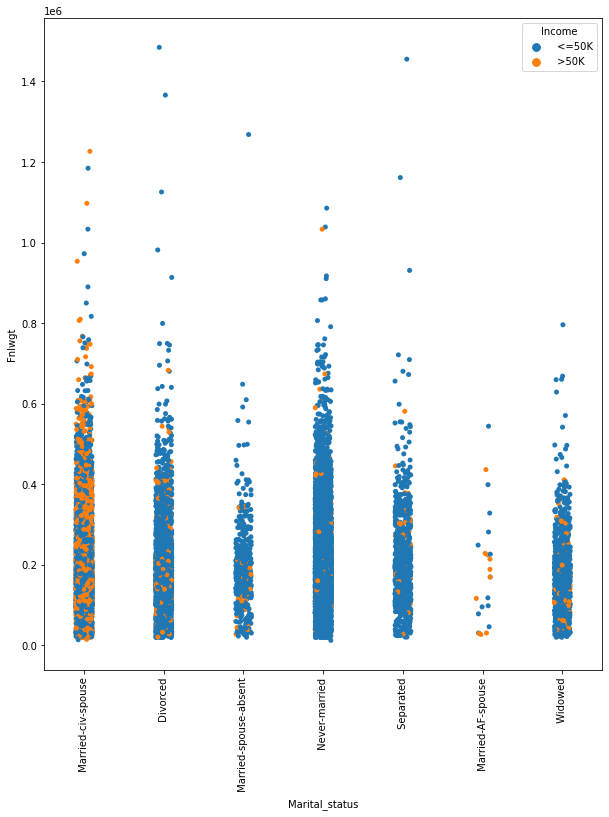

----------------------------------------------------------------------------------------------------


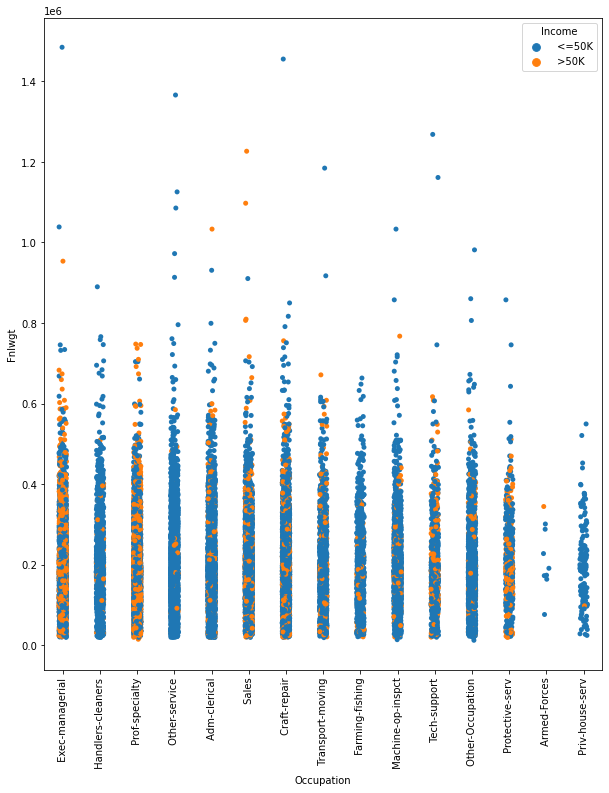

----------------------------------------------------------------------------------------------------


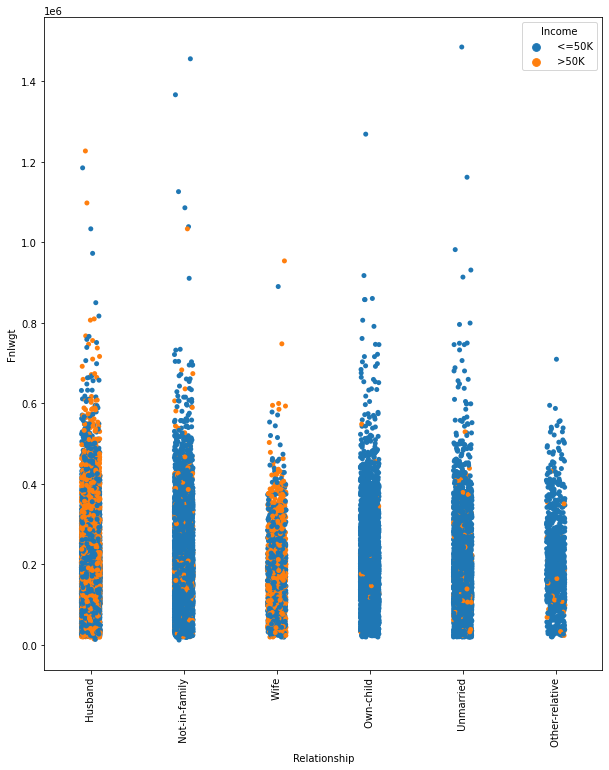

----------------------------------------------------------------------------------------------------


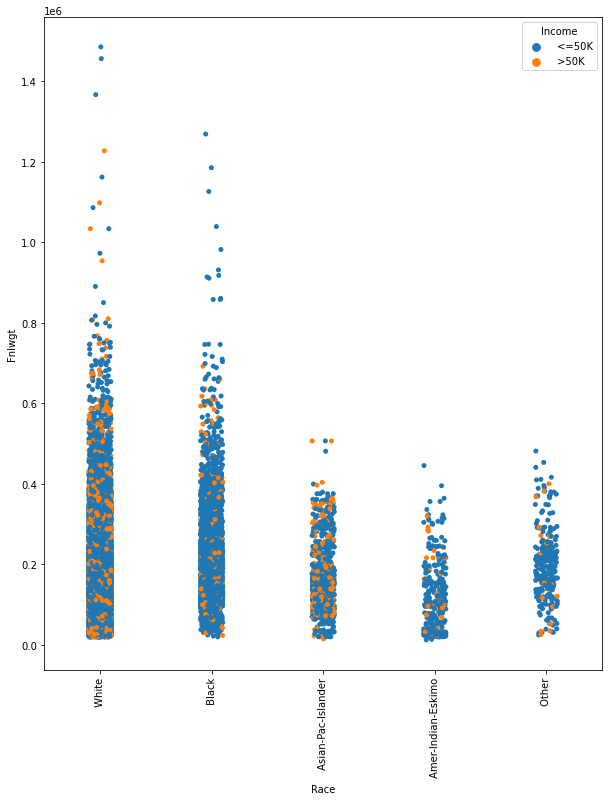

----------------------------------------------------------------------------------------------------


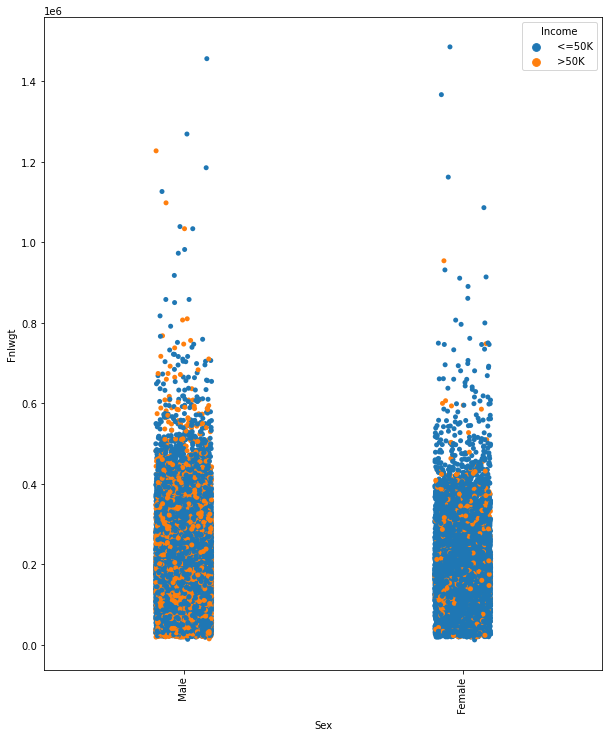

----------------------------------------------------------------------------------------------------


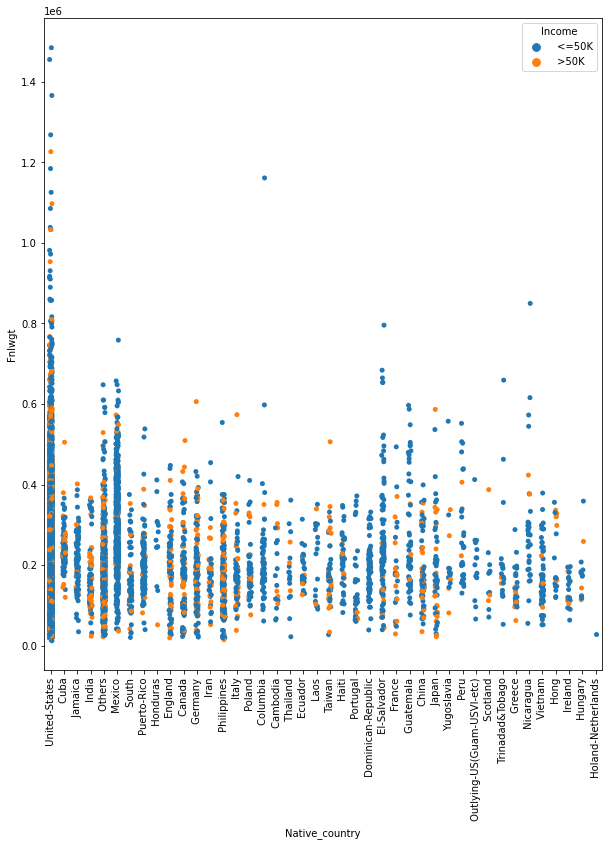

----------------------------------------------------------------------------------------------------


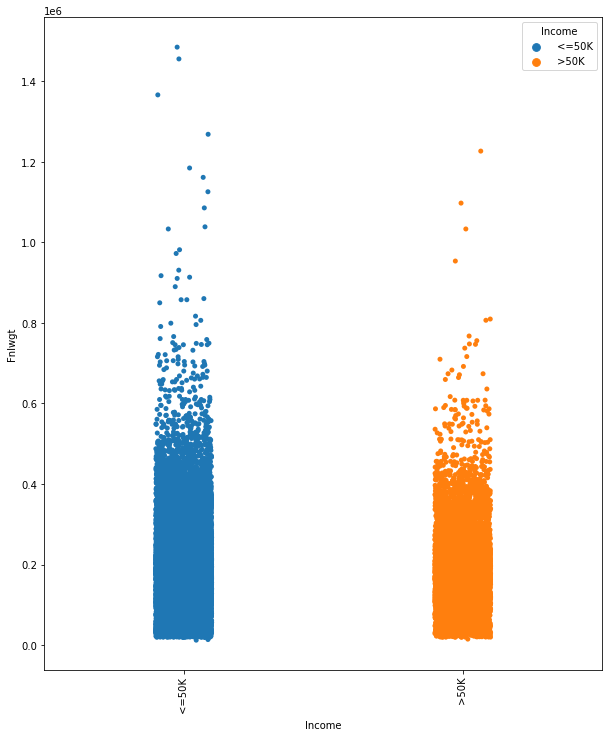

----------------------------------------------------------------------------------------------------


In [54]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.stripplot(df[c],df.Fnlwgt,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Fnlwgt')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

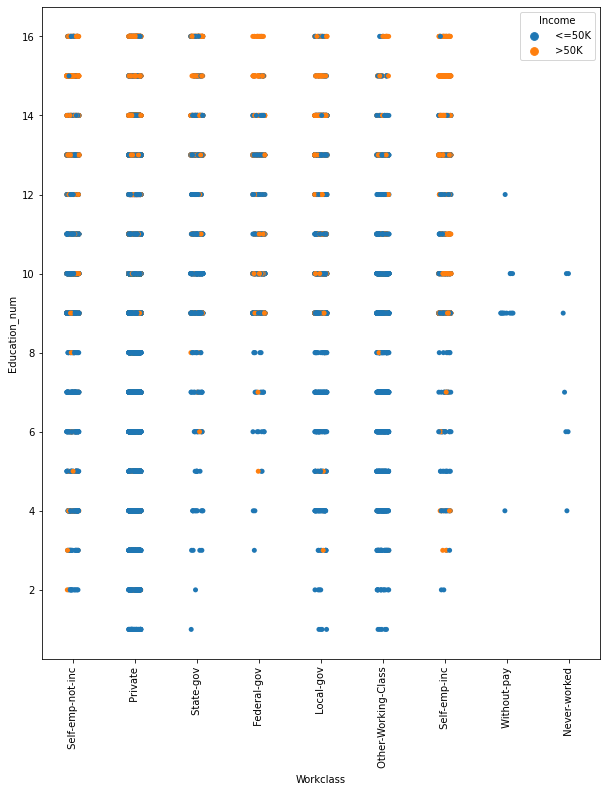

----------------------------------------------------------------------------------------------------


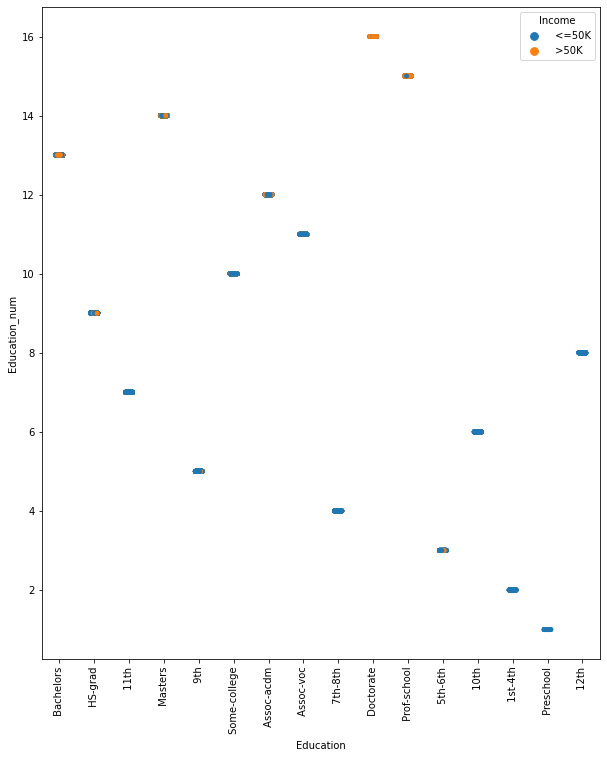

----------------------------------------------------------------------------------------------------


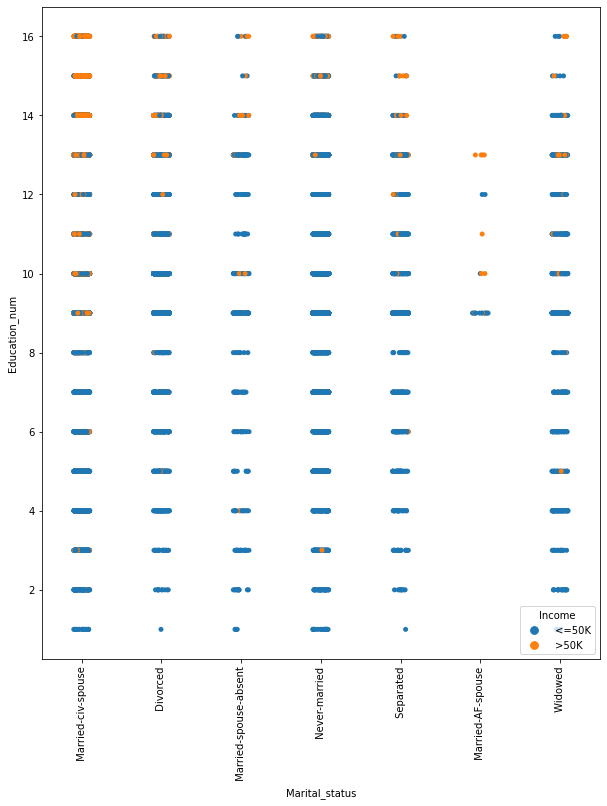

----------------------------------------------------------------------------------------------------


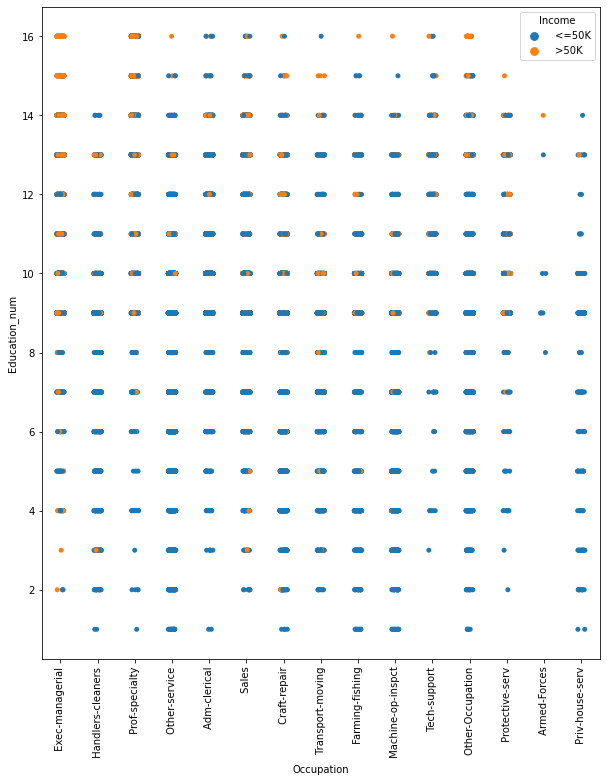

----------------------------------------------------------------------------------------------------


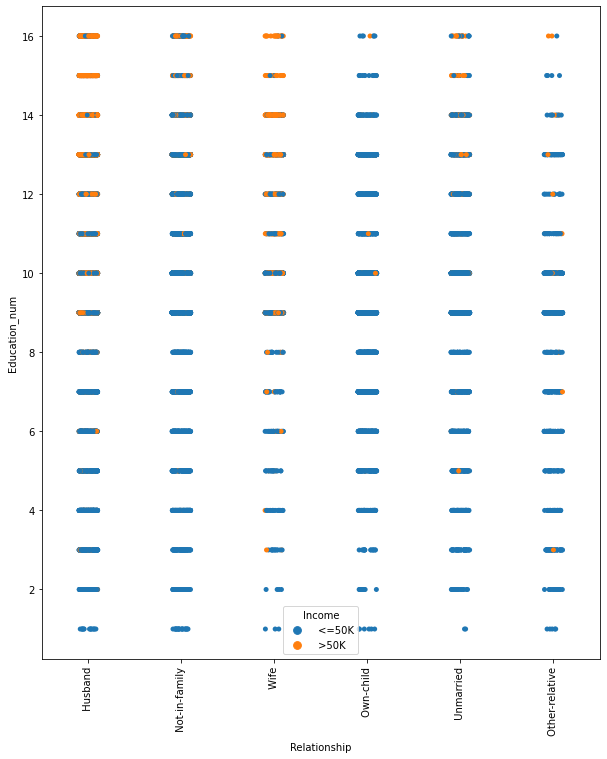

----------------------------------------------------------------------------------------------------


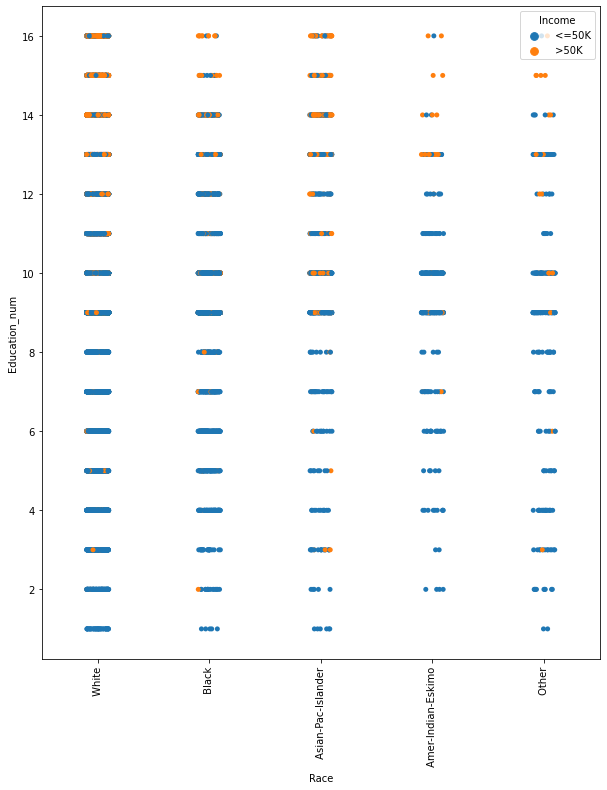

----------------------------------------------------------------------------------------------------


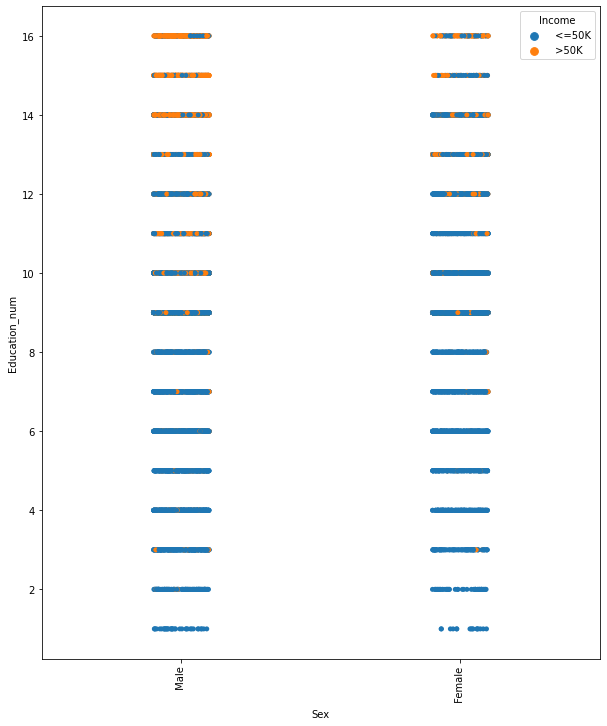

----------------------------------------------------------------------------------------------------


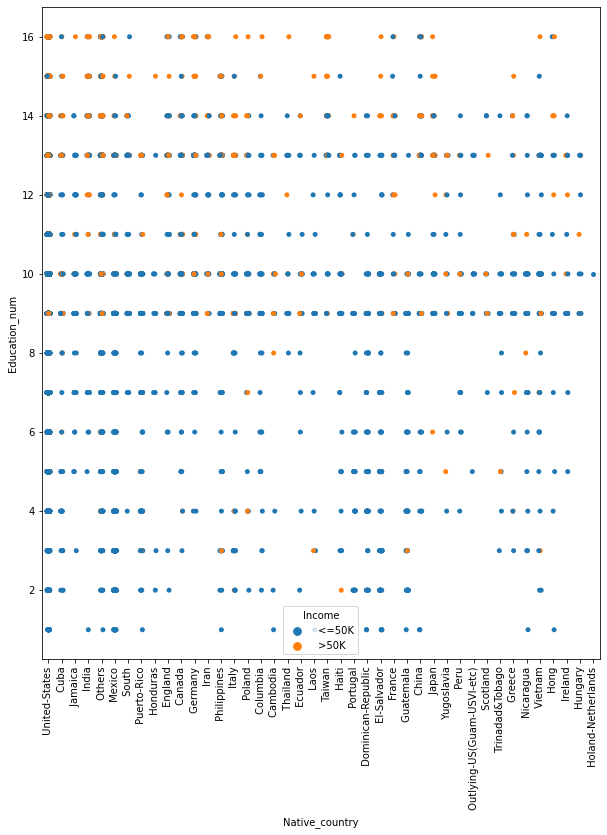

----------------------------------------------------------------------------------------------------


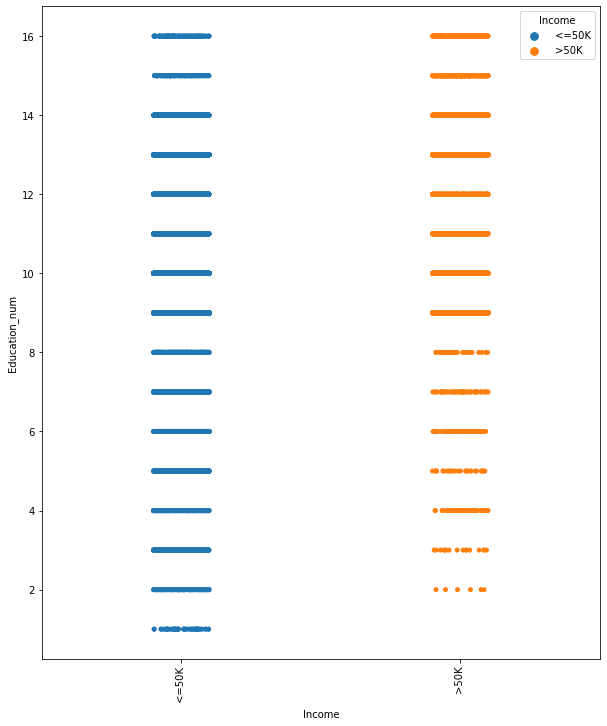

----------------------------------------------------------------------------------------------------


In [55]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.stripplot(df[c],df.Education_num,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Education_num')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

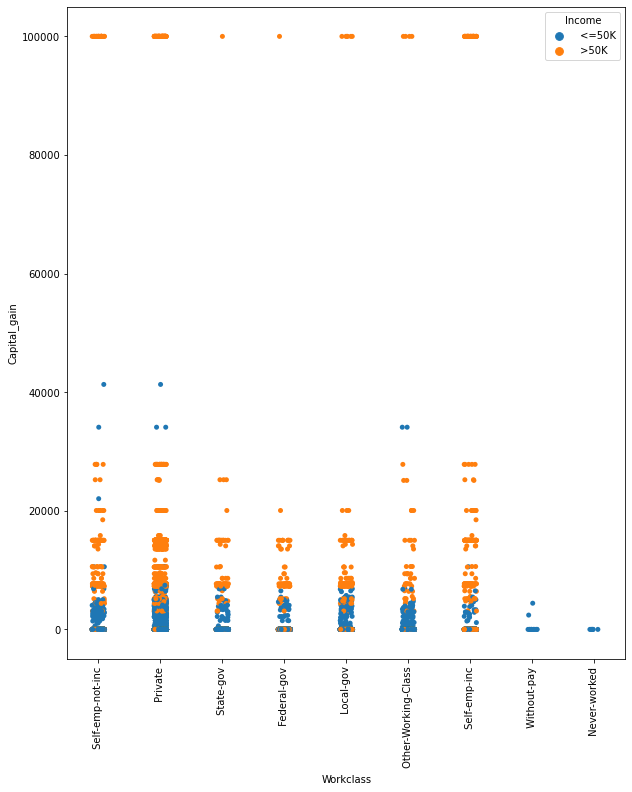

----------------------------------------------------------------------------------------------------


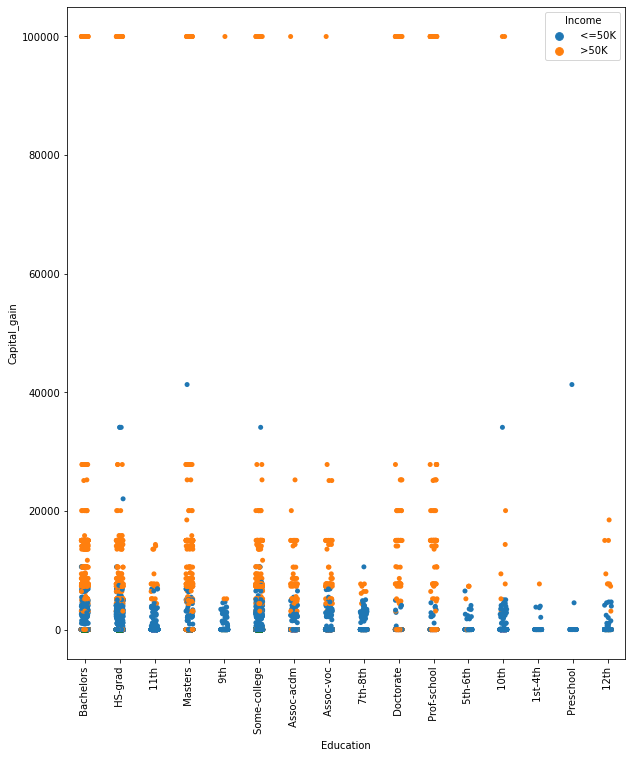

----------------------------------------------------------------------------------------------------


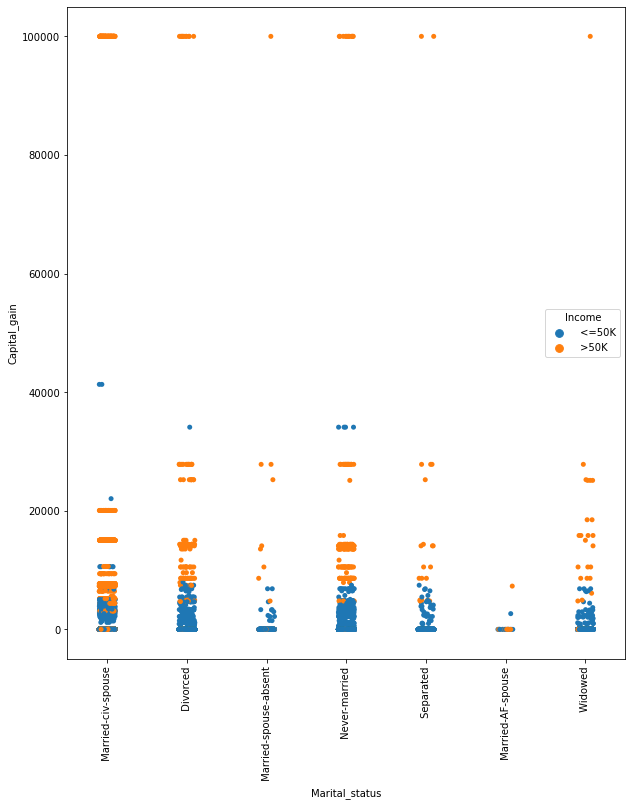

----------------------------------------------------------------------------------------------------


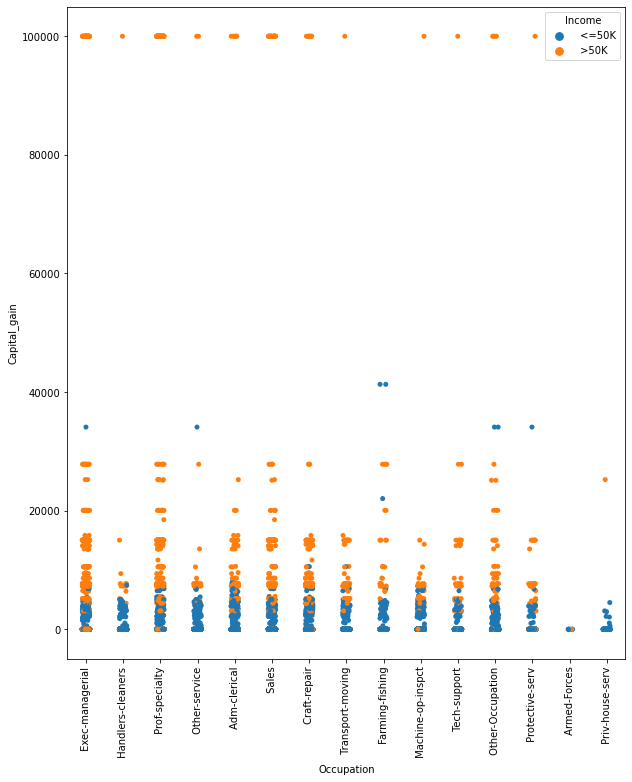

----------------------------------------------------------------------------------------------------


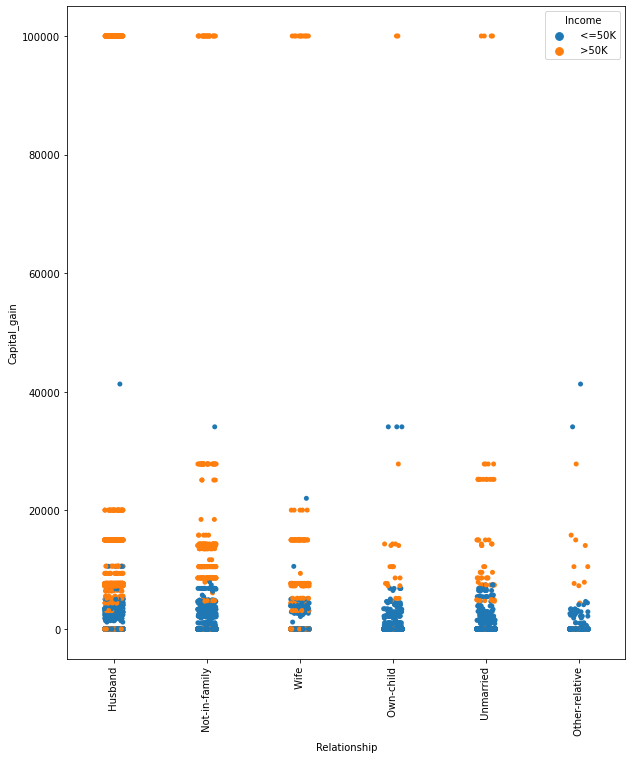

----------------------------------------------------------------------------------------------------


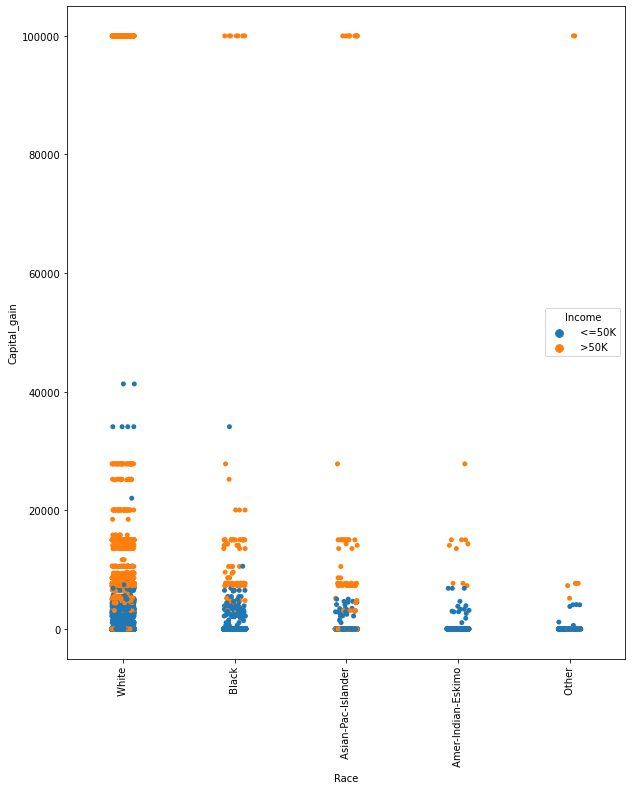

----------------------------------------------------------------------------------------------------


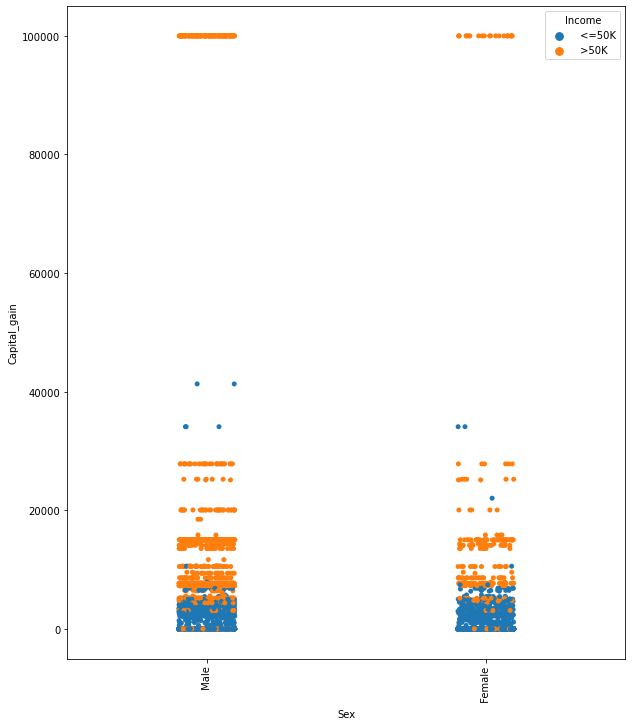

----------------------------------------------------------------------------------------------------


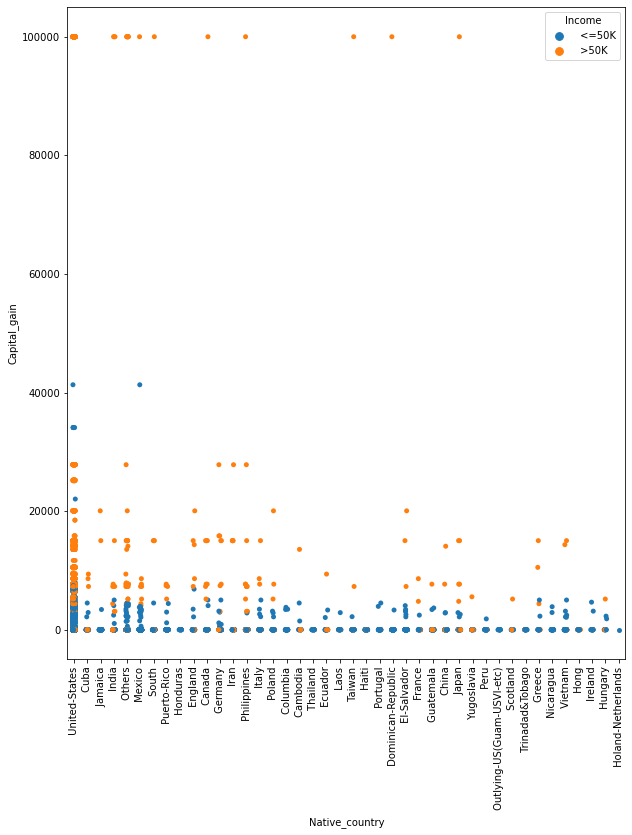

----------------------------------------------------------------------------------------------------


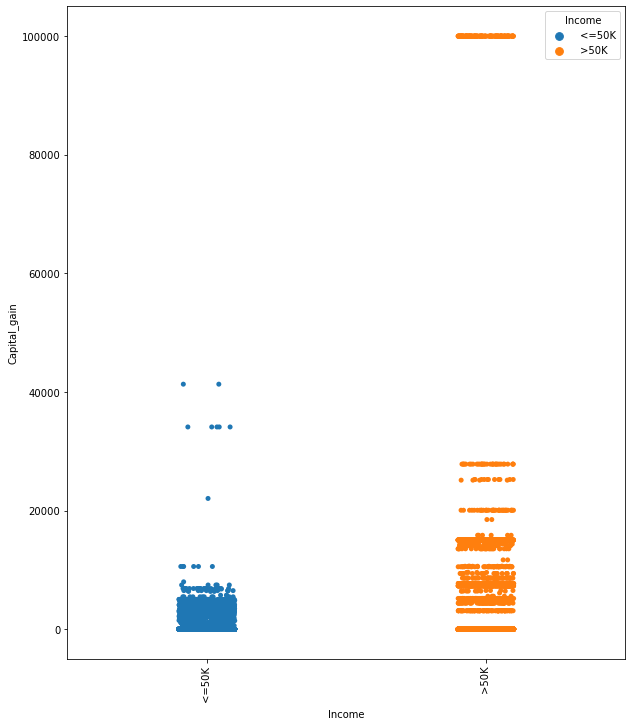

----------------------------------------------------------------------------------------------------


In [56]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.stripplot(df[c],df.Capital_gain,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Capital_gain')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

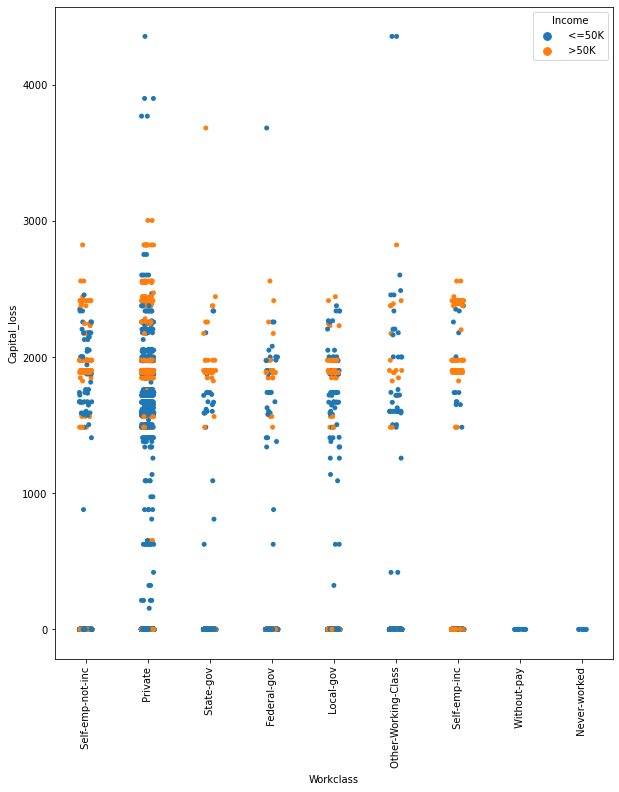

----------------------------------------------------------------------------------------------------


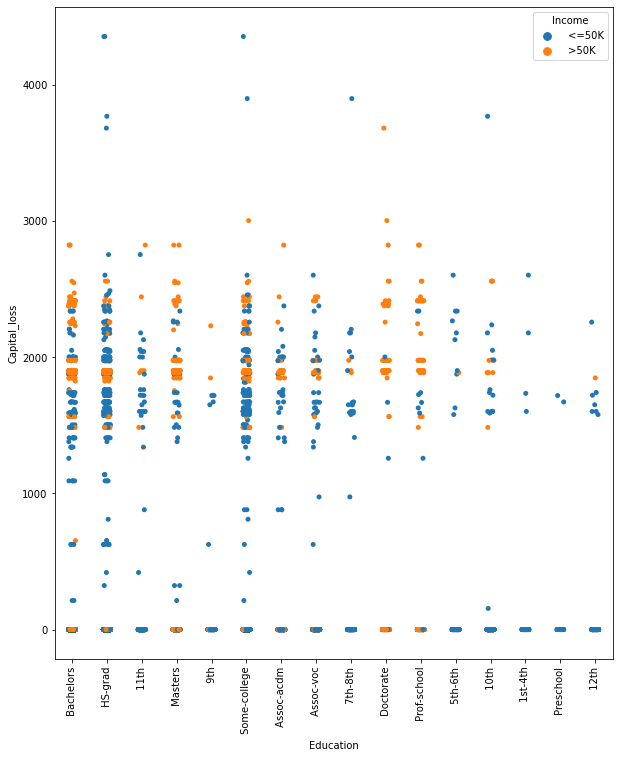

----------------------------------------------------------------------------------------------------


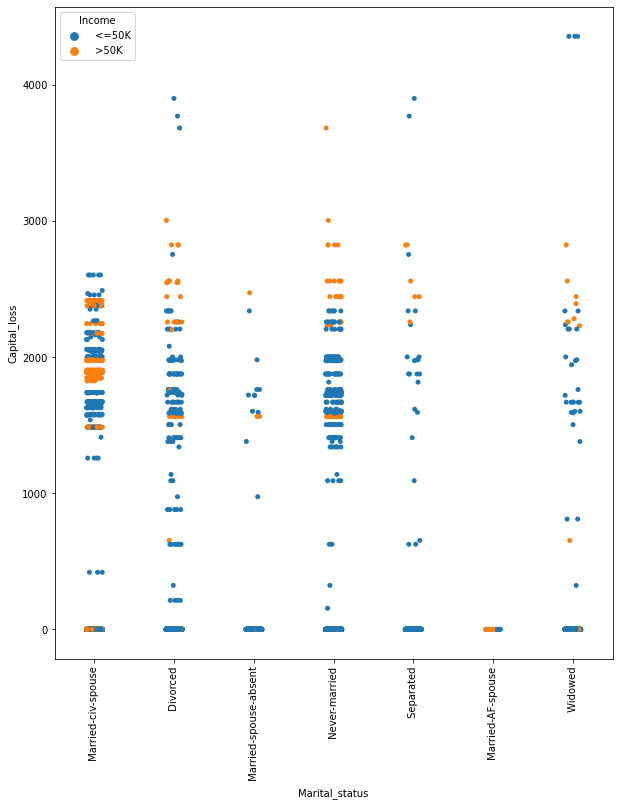

----------------------------------------------------------------------------------------------------


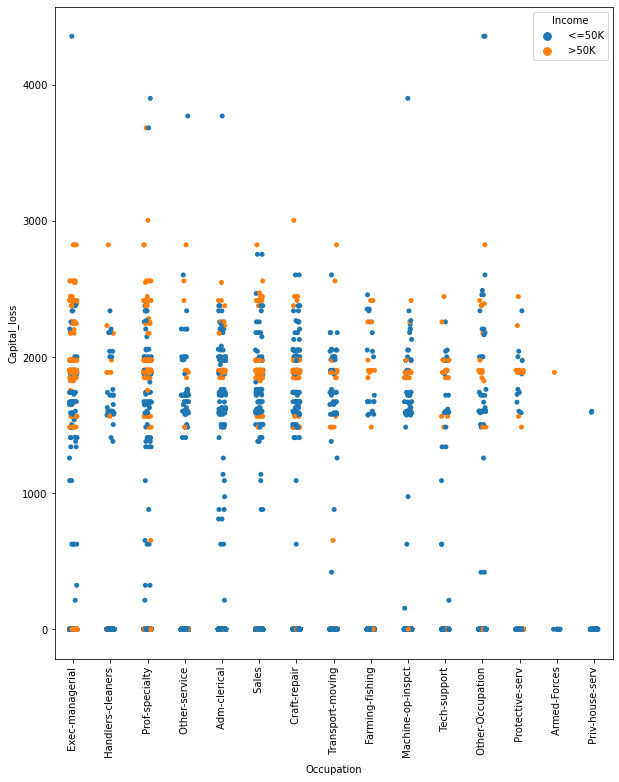

----------------------------------------------------------------------------------------------------


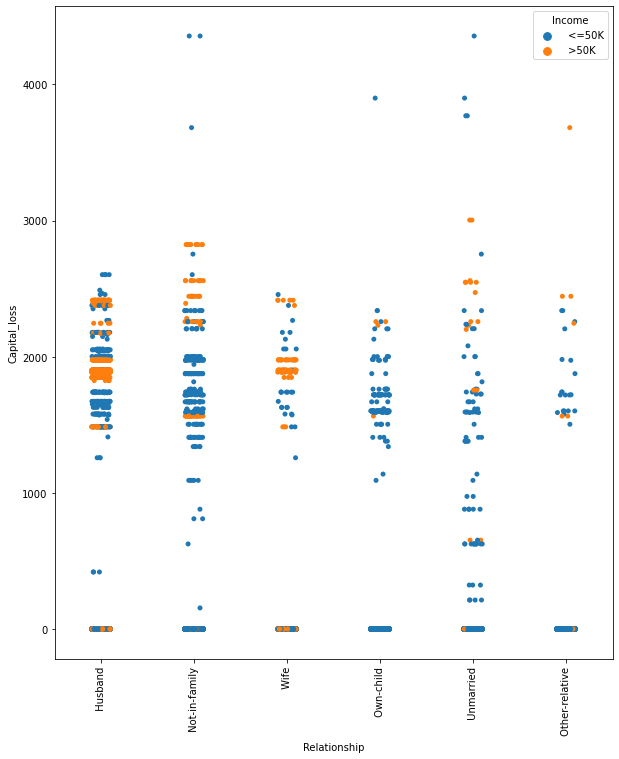

----------------------------------------------------------------------------------------------------


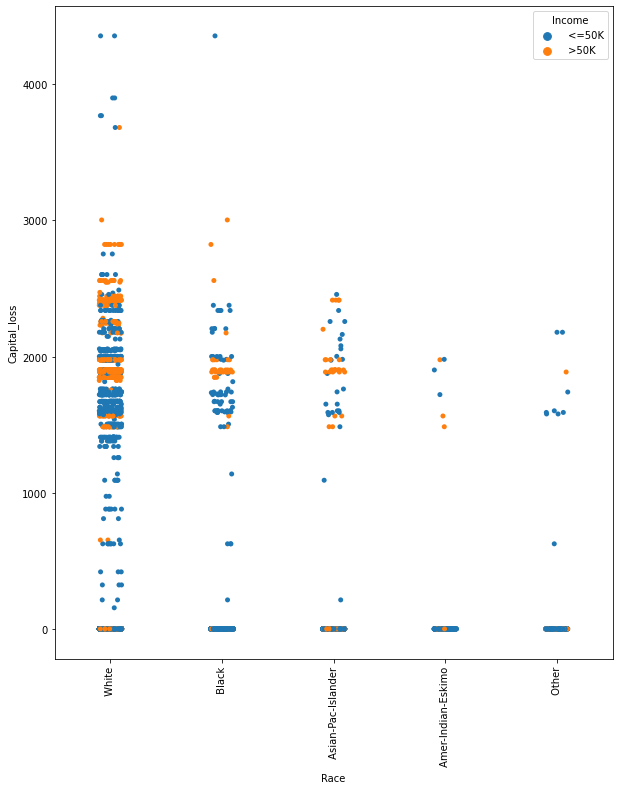

----------------------------------------------------------------------------------------------------


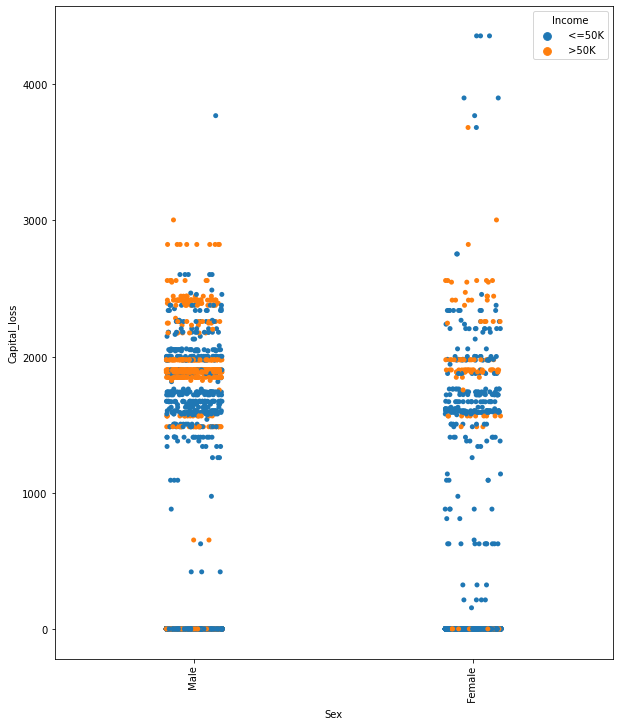

----------------------------------------------------------------------------------------------------


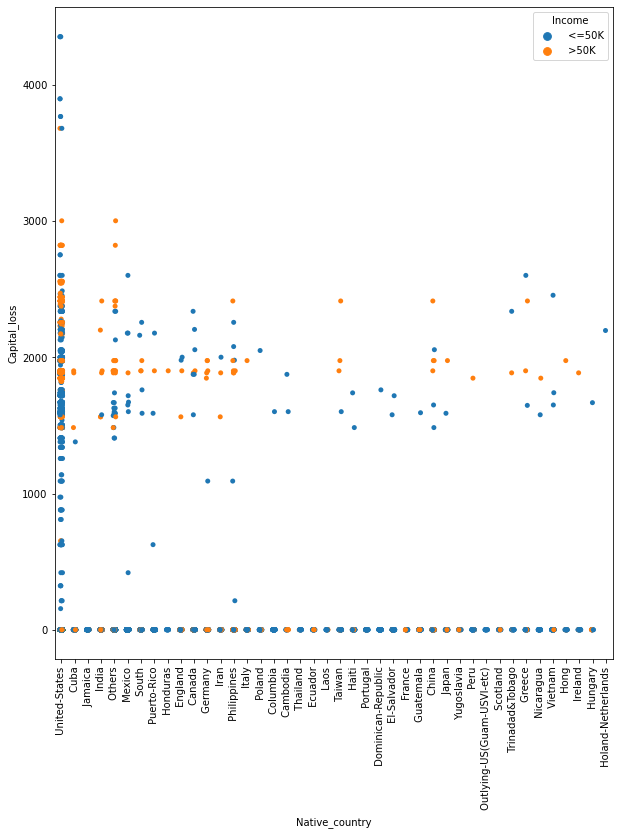

----------------------------------------------------------------------------------------------------


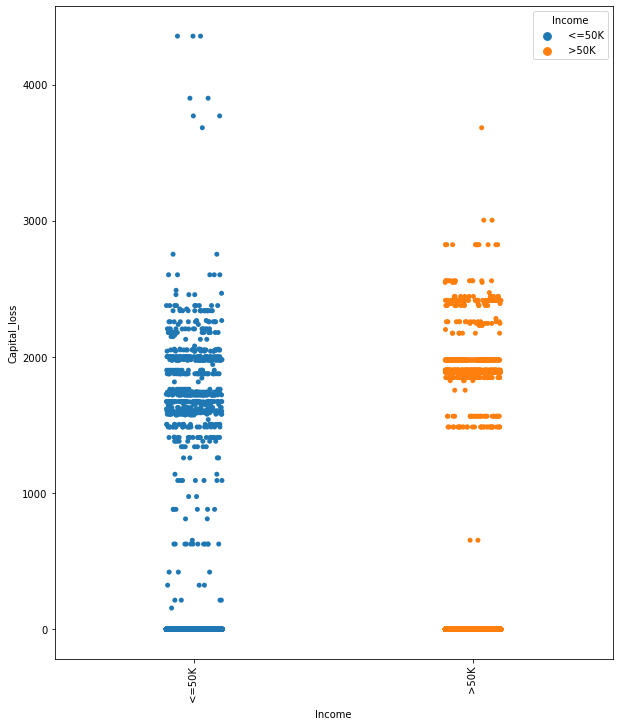

----------------------------------------------------------------------------------------------------


In [57]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.stripplot(df[c],df.Capital_loss,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Capital_loss')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

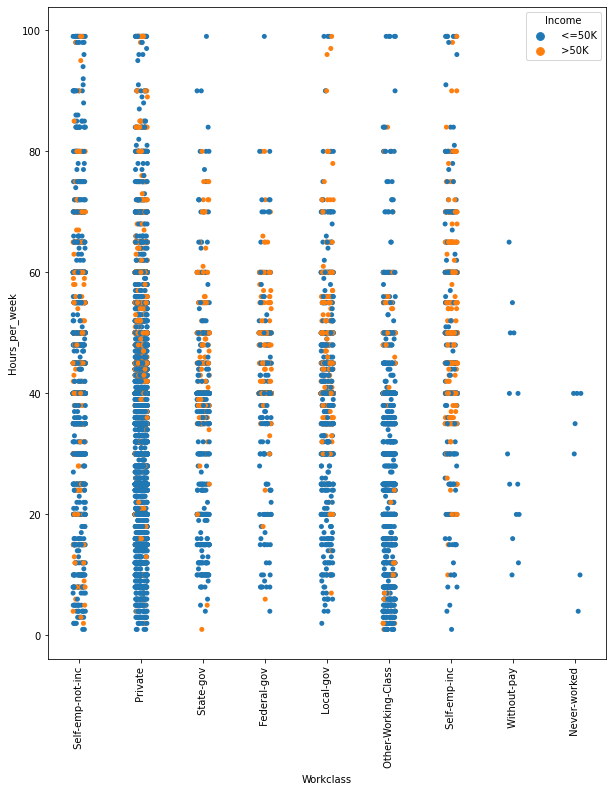

----------------------------------------------------------------------------------------------------


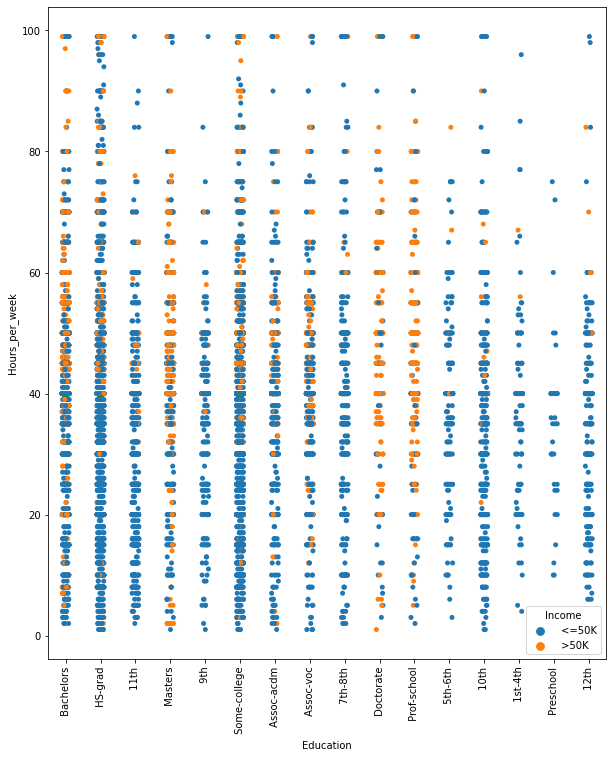

----------------------------------------------------------------------------------------------------


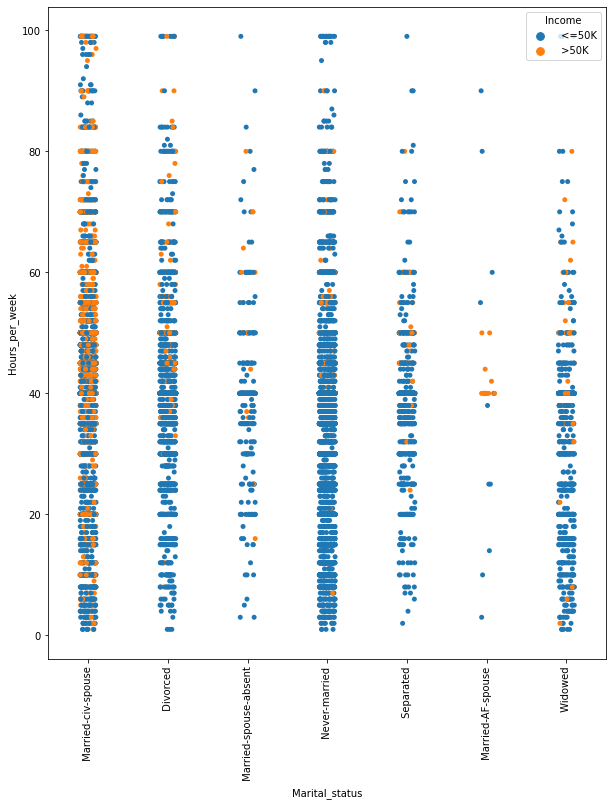

----------------------------------------------------------------------------------------------------


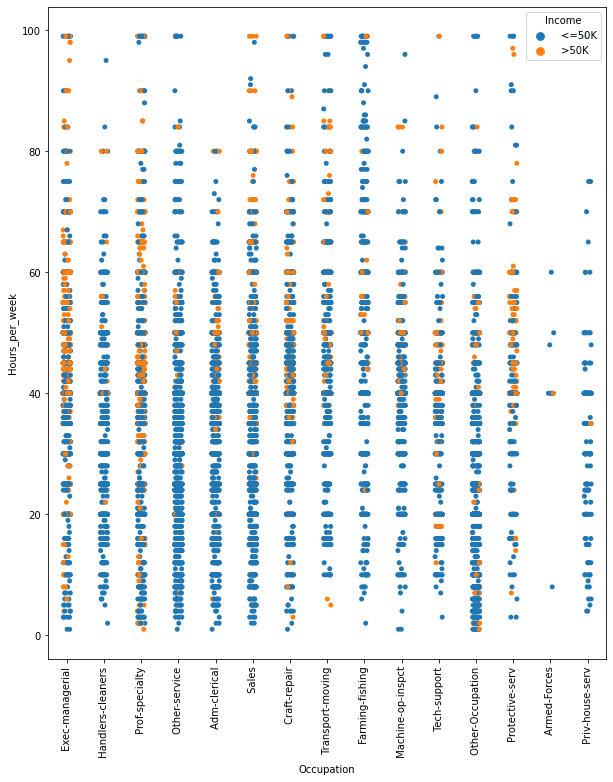

----------------------------------------------------------------------------------------------------


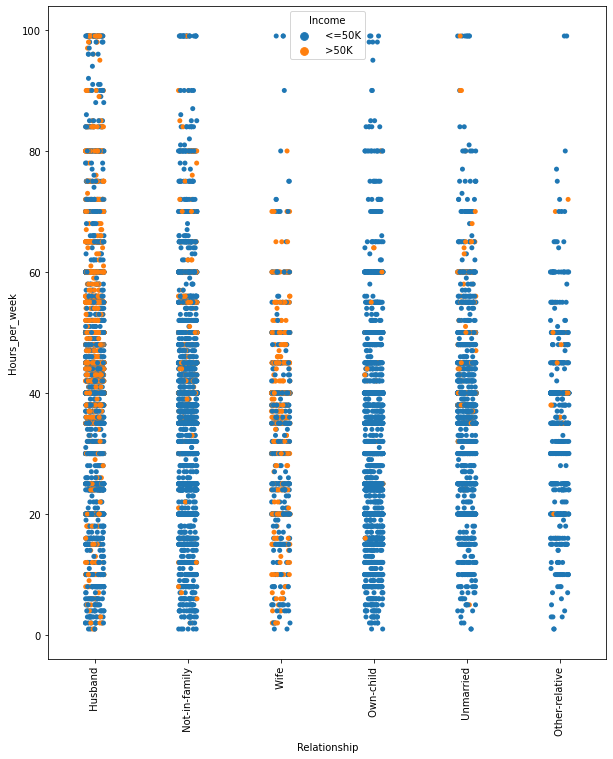

----------------------------------------------------------------------------------------------------


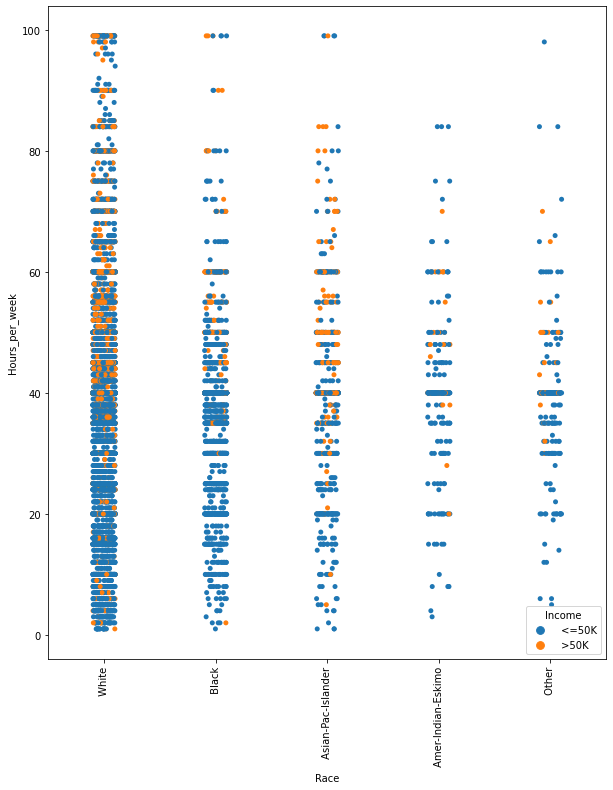

----------------------------------------------------------------------------------------------------


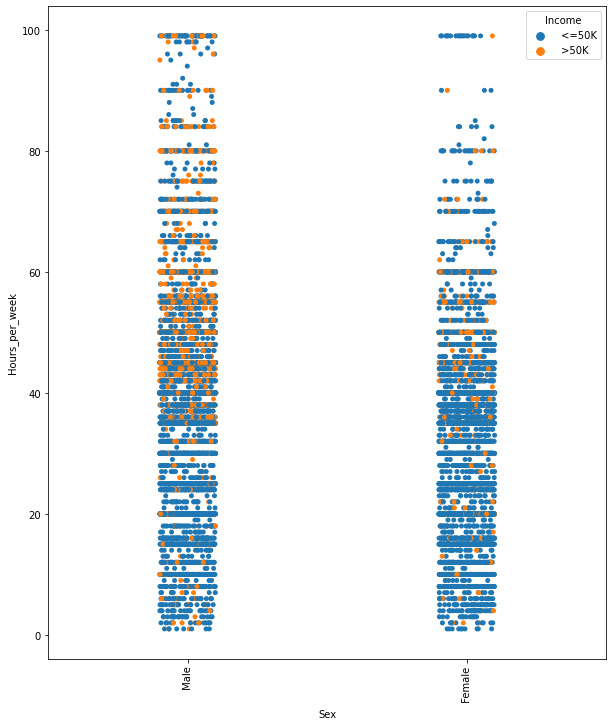

----------------------------------------------------------------------------------------------------


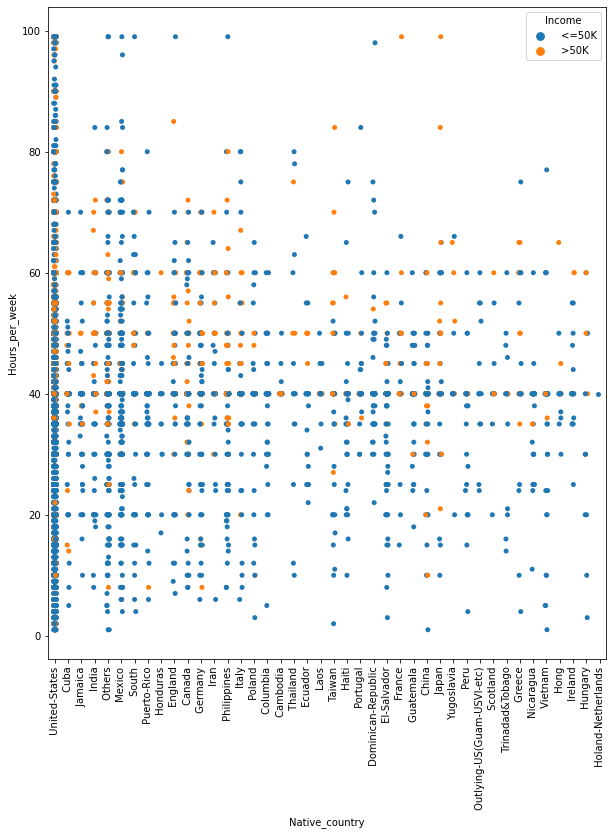

----------------------------------------------------------------------------------------------------


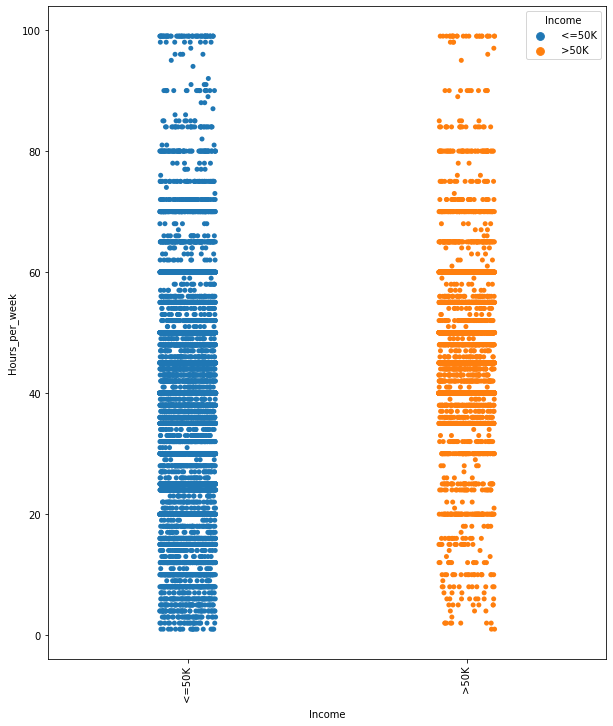

----------------------------------------------------------------------------------------------------


In [58]:
for c in categorical_variables:
    plt.figure(figsize=(10,12))
    sns.stripplot(df[c],df.Hours_per_week,hue=df.Income)
    plt.xlabel(c)
    plt.ylabel('Hours_per_week')
    plt.xticks(rotation=90)
    plt.show()
    print('-'*100)

I created a strip plot with every numerical vs categorical variables with hue being the target variable i.e Income

Here I have completed the vizualization part

Now I will check if they are any outliers present or not.

In [59]:
df.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


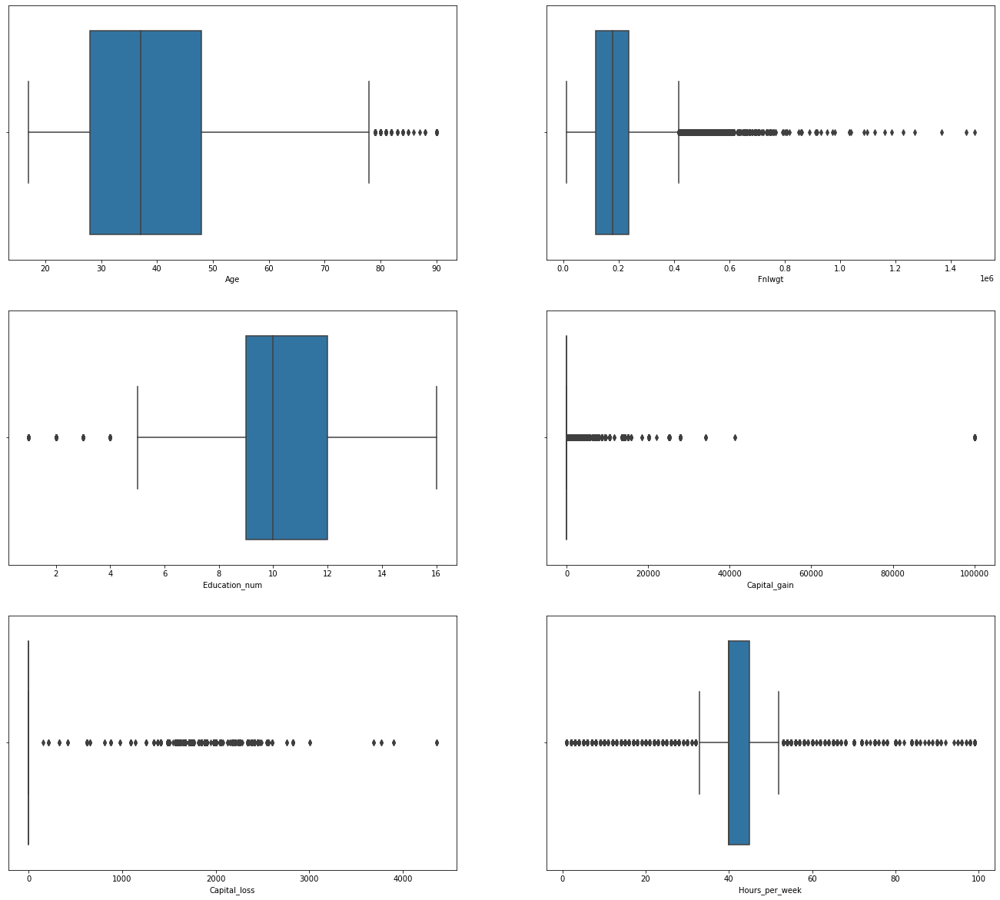

In [60]:
#Outliers found in numerical variables

plt.figure(figsize=(23,28))
plot = 1
for i in num_var:
    if plot < 8:
        ax = plt.subplot(4,2,plot)
        sns.boxplot(df[i])
    plot += 1
plt.show()

I will deal with outliers in the latter stages 

# Encoding : Converting categorical to numerical variables

In [61]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

In [62]:
categorical_variables.head()

,Workclass,Education,Marital_status,Occupation,Relationship,Race,Sex,Native_country,Income
0,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,<=50K
1,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,<=50K
2,Private,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,<=50K
3,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,Cuba,<=50K
4,Private,Masters,Married-civ-spouse,Exec-managerial,Wife,White,Female,United-States,<=50K


In [63]:
categorical_variables.columns

Index(['Workclass', 'Education', 'Marital_status', 'Occupation',
       'Relationship', 'Race', 'Sex', 'Native_country', 'Income'],
      dtype='object')

In [64]:
#Encdoing Code

for feature in categorical_variables:
    df[feature] = le.fit_transform(df[feature])
    df[feature]

In [65]:
df.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,6,83311,9,13,2,3,0,4,1,0,0,13,39,0
1,38,4,215646,11,9,0,5,1,4,1,0,0,40,39,0
2,53,4,234721,1,7,2,5,0,2,1,0,0,40,39,0
3,28,4,338409,9,13,2,10,5,2,0,0,0,40,4,0
4,37,4,284582,12,14,2,3,5,4,0,0,0,40,39,0


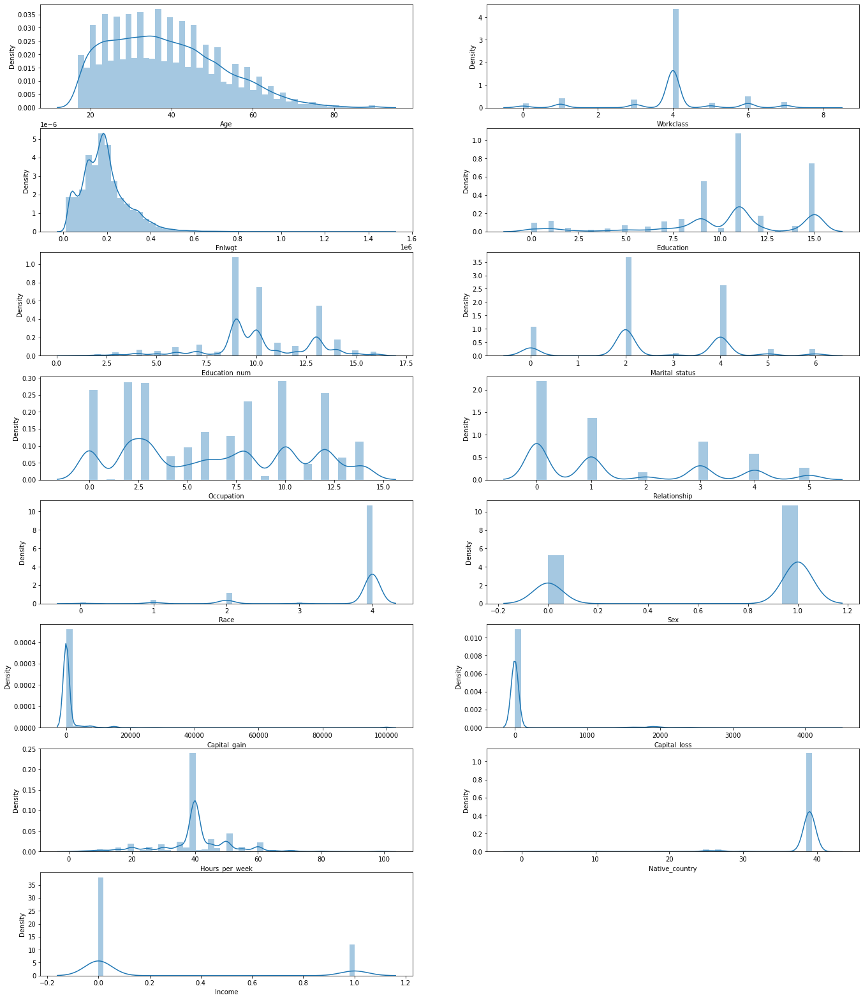

In [66]:
# Data Distribution after doing encoding

plt.figure(figsize=(23,28))
plot = 1
for i in df:
    if plot < 16:
        ax = plt.subplot(8,2,plot)
        sns.distplot(df[i])
    plot += 1
plt.show()

# Correlation Matrix

I will use correlation matrix and check for correlation between the variables.

In [67]:
df_corr = df.corr()

df_corr

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
Age,1.000000,0.008676,-0.076646,-0.010508,0.036527,-0.266292,-0.006221,-0.263698,0.028718,0.088832,0.077674,0.057775,0.068756,0.000215,0.234039
Workclass,0.008676,1.000000,-0.018017,0.001001,-0.009089,-0.021033,-0.000524,-0.060688,0.053443,0.076753,0.030563,0.000954,0.059916,-0.010058,0.002252
Fnlwgt,-0.076646,-0.018017,1.000000,-0.028156,-0.043159,0.028184,0.000023,0.008922,-0.021278,0.026882,0.000437,-0.010259,-0.018770,-0.064520,-0.009481
Education,-0.010508,0.001001,-0.028156,1.000000,0.359172,-0.038398,-0.034562,-0.010879,0.014135,-0.027349,0.030047,0.016744,0.055510,0.077589,0.079311
Education_num,0.036527,-0.009089,-0.043159,0.359172,1.000000,-0.069338,0.091522,-0.094145,0.031825,0.012256,0.122627,0.079932,0.148127,0.082418,0.335182
Marital_status,-0.266292,-0.021033,0.028184,-0.038398,-0.069338,1.000000,0.028162,0.185461,-0.068025,-0.129337,-0.043398,-0.034182,-0.190521,-0.023865,-0.199295
Occupation,-0.006221,-0.000524,0.000023,-0.034562,0.091522,0.028162,1.000000,-0.039954,-0.004136,0.043381,0.021146,0.011739,0.004328,-0.006531,0.045372
Relationship,-0.263698,-0.060688,0.008922,-0.010879,-0.094145,0.185461,-0.039954,1.000000,-0.116052,-0.582453,-0.057918,-0.061064,-0.248975,-0.009215,-0.250924
Race,0.028718,0.053443,-0.021278,0.014135,0.031825,-0.068025,-0.004136,-0.116052,1.000000,0.087197,0.011143,0.018902,0.041910,0.130910,0.071853
Sex,0.088832,0.076753,0.026882,-0.027349,0.012256,-0.129337,0.043381,-0.582453,0.087197,1.000000,0.048477,0.045572,0.229312,-0.002117,0.215995


<AxesSubplot:>

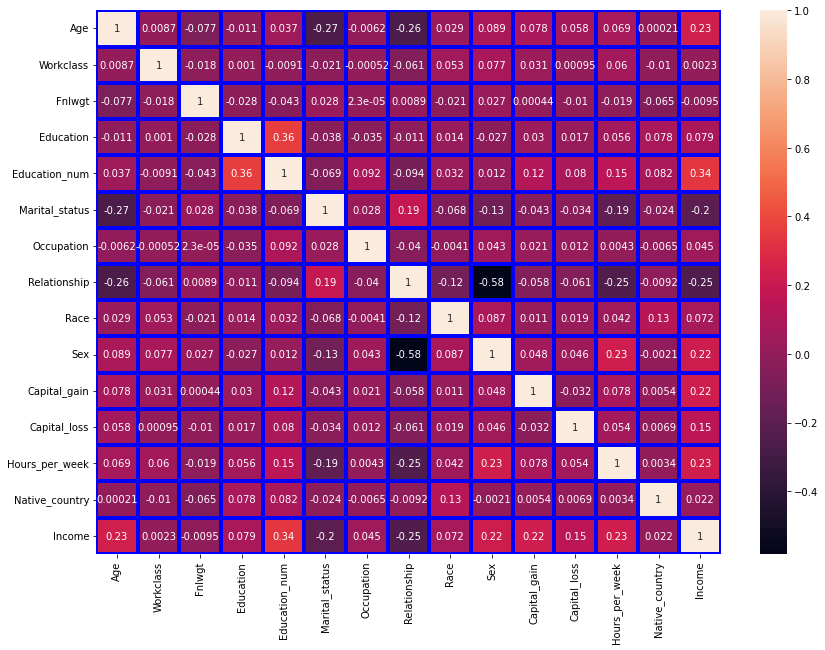

In [68]:
plt.figure(figsize=(14,10))
sns.heatmap(df_corr,annot=True,linecolor='blue',linewidths=4)

# Correlation Bar Plot comparing features with our label

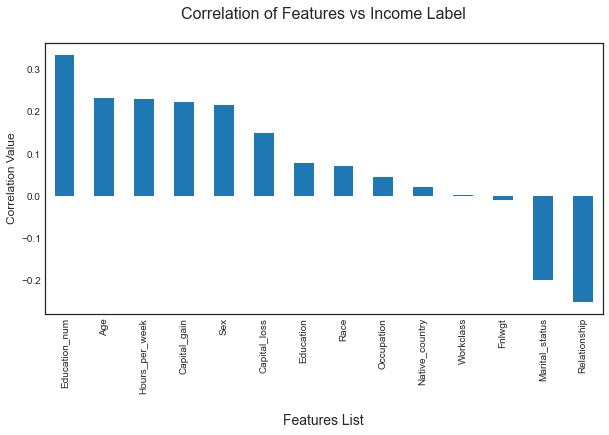

In [69]:
plt.style.use('seaborn-white')
df_corr = df.corr()
plt.figure(figsize=(10,5))
df_corr['Income'].sort_values(ascending=False).drop('Income').plot.bar()
plt.title("Correlation of Features vs Income Label\n", fontsize=16)
plt.xlabel("\nFeatures List", fontsize=14)
plt.ylabel("Correlation Value", fontsize=12)
plt.show()

Since the heatmap was not able to give us a clear picture on positive and negative correlation columns I have generated this bar plot and I see that columns relationship and marital status are the only one's negatively correlated rest all the other feature columns are positively correlated with our label column.

Now I will treat the outliers

# Using Z score to treat outliers

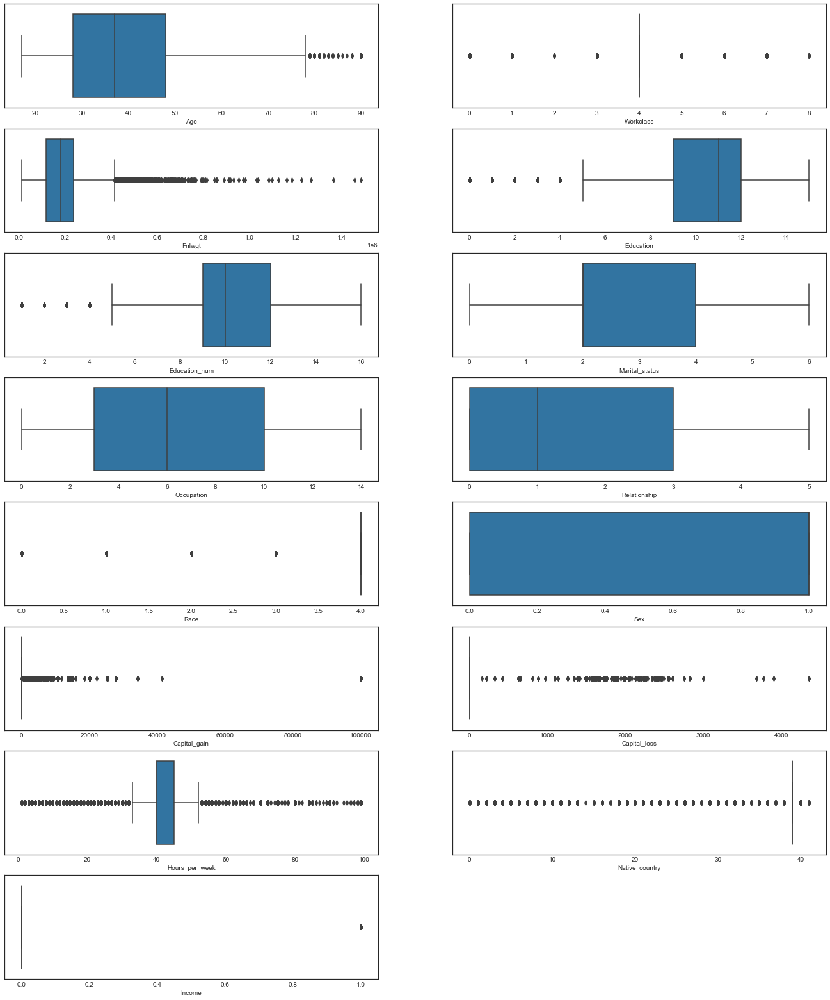

In [70]:
#Outlier Detection
plt.figure(figsize=(23,28))
plot = 1
for i in df:
    if plot < 16:
        ax = plt.subplot(8,2,plot)
        sns.boxplot(df[i])
    plot += 1
plt.show()

In [71]:
from scipy.stats import zscore

In [72]:
z = np.abs(zscore(df))
z

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,0.837097,1.525612,1.008742,0.335443,1.134779,0.406183,0.798538,0.900177,0.393675,0.703087,0.145914,0.216663,2.222120,0.289849,0.563210
1,0.042640,0.041568,0.245046,0.181319,0.420027,1.734026,0.338053,0.277810,0.393675,0.703087,0.145914,0.216663,0.035430,0.289849,0.563210
2,1.057031,0.041568,0.425770,2.402489,1.197429,0.406183,0.338053,0.900177,1.962583,0.703087,0.145914,0.216663,0.035430,0.289849,0.563210
3,0.775755,0.041568,1.408146,0.335443,1.134779,0.406183,0.813162,2.211658,1.962583,1.422298,0.145914,0.216663,0.035430,5.158508,0.563210
4,0.115952,0.041568,0.898170,0.439700,1.523480,0.406183,0.798538,2.211658,0.393675,1.422298,0.145914,0.216663,0.035430,0.289849,0.563210
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,0.849066,0.041568,0.639710,0.852204,0.746077,0.406183,1.503890,2.211658,0.393675,1.422298,0.145914,0.216663,0.197407,0.289849,0.563210
32556,0.103982,0.041568,0.335466,0.181319,0.420027,0.406183,0.107810,0.900177,0.393675,0.703087,0.145914,0.216663,0.035430,0.289849,1.775537
32557,1.423589,0.041568,0.358811,0.181319,0.420027,2.249503,1.489267,1.589291,0.393675,1.422298,0.145914,0.216663,0.035430,0.289849,0.563210
32558,1.215624,0.041568,0.110927,0.181319,0.420027,0.921660,1.489267,0.966924,0.393675,0.703087,0.145914,0.216663,1.655200,0.289849,0.563210


In [73]:
threshold = 3
df1 = df[(z<3).all(axis=1)]
df1

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,6,83311,9,13,2,3,0,4,1,0,0,13,39,0
1,38,4,215646,11,9,0,5,1,4,1,0,0,40,39,0
2,53,4,234721,1,7,2,5,0,2,1,0,0,40,39,0
4,37,4,284582,12,14,2,3,5,4,0,0,0,40,39,0
5,49,4,160187,6,5,3,8,1,2,0,0,0,16,22,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,4,257302,7,12,2,13,5,4,0,0,0,38,39,0
32556,40,4,154374,11,9,2,6,0,4,1,0,0,40,39,1
32557,58,4,151910,11,9,6,0,4,4,0,0,0,40,39,0
32558,22,4,201490,11,9,4,0,3,4,1,0,0,20,39,0


In [74]:
print(df.shape)# shape of the original data 
print(df1.shape)# shape of the data after using zscore to remove outliers

(32560, 15)
(27782, 15)


In [75]:
df = df1.copy()# reassigning the changed dataframe name to our original dataframe name

df

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,6,83311,9,13,2,3,0,4,1,0,0,13,39,0
1,38,4,215646,11,9,0,5,1,4,1,0,0,40,39,0
2,53,4,234721,1,7,2,5,0,2,1,0,0,40,39,0
4,37,4,284582,12,14,2,3,5,4,0,0,0,40,39,0
5,49,4,160187,6,5,3,8,1,2,0,0,0,16,22,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,4,257302,7,12,2,13,5,4,0,0,0,38,39,0
32556,40,4,154374,11,9,2,6,0,4,1,0,0,40,39,1
32557,58,4,151910,11,9,6,0,4,4,0,0,0,40,39,0
32558,22,4,201490,11,9,4,0,3,4,1,0,0,20,39,0


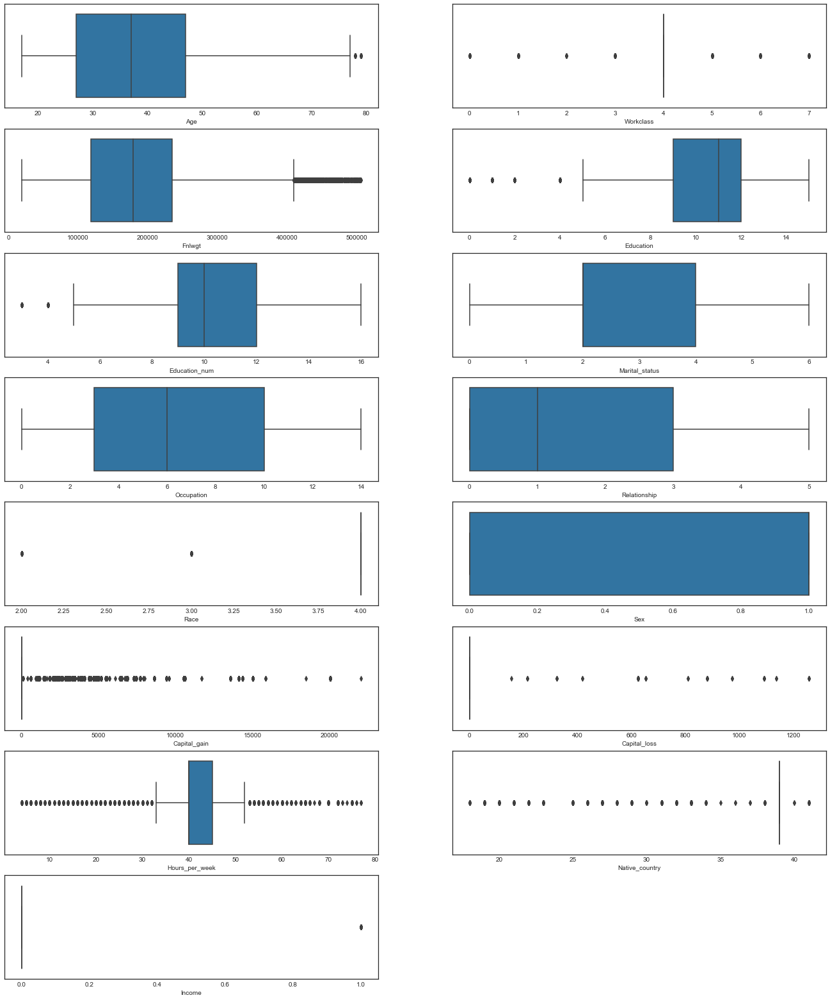

In [76]:
plt.figure(figsize=(23,28))
plot = 1
for i in df:
    if plot < 16:
        ax = plt.subplot(8,2,plot)
        sns.boxplot(df[i])
    plot += 1
plt.show()

I have dealt with quite a few outliers but there are some more there which will not effect our model preparation

Check for skewness

In [77]:
df.skew()

Age                0.484849
Workclass         -0.663777
Fnlwgt             0.628132
Education         -0.955885
Education_num     -0.146011
Marital_status    -0.045708
Occupation         0.101699
Relationship       0.753819
Race              -2.585938
Sex               -0.689465
Capital_gain       4.931812
Capital_loss      29.520944
Hours_per_week    -0.360027
Native_country    -4.364306
Income             1.322364
dtype: float64

There are skewness in the df dataset.I will use PowerTransformer to tune the skewness in the latter stages

# Splitting the dataset into 2 variables namely 'X' and 'Y' for feature and label

In [78]:
X = df.drop(['Income'],axis=1)
Y = df['Income']

In [79]:
X.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country
0,50,6,83311,9,13,2,3,0,4,1,0,0,13,39
1,38,4,215646,11,9,0,5,1,4,1,0,0,40,39
2,53,4,234721,1,7,2,5,0,2,1,0,0,40,39
4,37,4,284582,12,14,2,3,5,4,0,0,0,40,39
5,49,4,160187,6,5,3,8,1,2,0,0,0,16,22


In [80]:
Y.head()

0    0
1    0
2    0
4    0
5    0
Name: Income, dtype: int32

# Tuning the Imbalanced dataset into Balanced dataset

0    21552
1     6230
Name: Income, dtype: int64


<AxesSubplot:xlabel='Income', ylabel='count'>

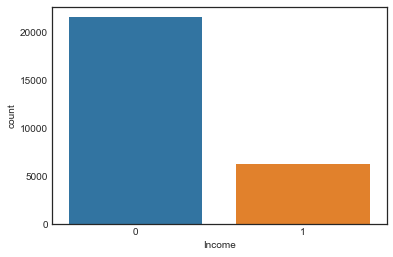

In [81]:
print(Y.value_counts())

sns.countplot(Y)

In [82]:
from imblearn.over_sampling import SMOTE

In [83]:
# adding samples to make all the categorical quality values same

oversample = SMOTE(0.97)
X, Y = oversample.fit_resample(X, Y)

In [84]:
Y.value_counts()

0    21552
1    20905
Name: Income, dtype: int64

# Power Transfomer

In [85]:
from sklearn.preprocessing import PowerTransformer

In [86]:
p_transform = PowerTransformer(method = 'yeo-johnson')
X = pd.DataFrame(p_transform.fit_transform(X), columns=X.columns)
X.head(5)

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country
0,0.837675,1.861957,-1.133864,-0.538449,1.144749,-0.241242,-0.751080,-0.901512,0.342816,0.674318,-0.381207,-0.033992,-2.437013,0.224690
1,-0.103671,0.051558,0.422424,0.097162,-0.649574,-1.941483,-0.221587,0.539543,0.342816,0.674318,-0.381207,-0.033992,-0.203605,0.224690
2,1.058230,0.051558,0.604992,-2.251949,-1.454181,-0.241242,-0.221587,-0.901512,-2.923425,0.674318,-0.381207,-0.033992,-0.203605,0.224690
3,-0.187157,0.051558,1.053115,0.441266,1.627339,-0.241242,-0.751080,1.566812,0.342816,-1.482981,-0.381207,-0.033992,-0.203605,0.224690
4,0.762982,0.051558,-0.154377,-1.350300,-2.185157,0.497554,0.465747,0.539543,-2.923425,-1.482981,-0.381207,-0.033992,-2.240046,-3.755319


# Feature Scaling

In [87]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_scaled = pd.DataFrame(scaler.fit_transform(X),columns=X.columns)

X_scaled.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country
0,0.837675,1.861957,-1.133864,-0.538449,1.144749,-0.241242,-0.751080,-0.901512,0.342816,0.674318,-0.381207,-0.033992,-2.437013,0.224690
1,-0.103671,0.051558,0.422424,0.097162,-0.649574,-1.941483,-0.221587,0.539543,0.342816,0.674318,-0.381207,-0.033992,-0.203605,0.224690
2,1.058230,0.051558,0.604992,-2.251949,-1.454181,-0.241242,-0.221587,-0.901512,-2.923425,0.674318,-0.381207,-0.033992,-0.203605,0.224690
3,-0.187157,0.051558,1.053115,0.441266,1.627339,-0.241242,-0.751080,1.566812,0.342816,-1.482981,-0.381207,-0.033992,-0.203605,0.224690
4,0.762982,0.051558,-0.154377,-1.350300,-2.185157,0.497554,0.465747,0.539543,-2.923425,-1.482981,-0.381207,-0.033992,-2.240046,-3.755319


# VIF

In [88]:
from statsmodels.stats.outliers_influence import variance_inflation_factor 

vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(X_scaled,i) for i in range(X_scaled.shape[1])]
vif['features'] = X.columns
vif

,vif,features
0,1.260600,Age
1,1.010240,Workclass
2,1.021469,Fnlwgt
3,1.039685,Education
4,1.116335,Education_num
5,1.172525,Marital_status
6,1.022008,Occupation
7,2.036158,Relationship
8,1.038587,Race
9,1.697081,Sex


Since variables have  vif less than 10 , I can conclude that there is no multicollinearity in our feature variables.I can proceed to the model building part

# Model Building

In [89]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_curve,roc_auc_score,plot_confusion_matrix,plot_roc_curve
from sklearn.model_selection import cross_val_score,KFold,StratifiedShuffleSplit,StratifiedKFold

Data

In [90]:
X_scaled

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country
0,0.837675,1.861957,-1.133864,-0.538449,1.144749,-0.241242,-0.751080,-0.901512,0.342816,0.674318,-0.381207,-0.033992,-2.437013,0.224690
1,-0.103671,0.051558,0.422424,0.097162,-0.649574,-1.941483,-0.221587,0.539543,0.342816,0.674318,-0.381207,-0.033992,-0.203605,0.224690
2,1.058230,0.051558,0.604992,-2.251949,-1.454181,-0.241242,-0.221587,-0.901512,-2.923425,0.674318,-0.381207,-0.033992,-0.203605,0.224690
3,-0.187157,0.051558,1.053115,0.441266,1.627339,-0.241242,-0.751080,1.566812,0.342816,-1.482981,-0.381207,-0.033992,-0.203605,0.224690
4,0.762982,0.051558,-0.154377,-1.350300,-2.185157,0.497554,0.465747,0.539543,-2.923425,-1.482981,-0.381207,-0.033992,-2.240046,-3.755319
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42452,-0.021058,0.051558,1.847115,-1.969068,-1.060397,-0.241242,-0.476823,-0.901512,0.342816,0.674318,2.621476,-0.033992,0.097475,0.224690
42453,-0.708406,0.051558,-0.109981,-0.538449,0.219033,-0.241242,-0.751080,-0.901512,0.342816,0.674318,-0.381207,-0.033992,0.942300,0.224690
42454,-0.187157,0.051558,0.436141,-0.538449,0.675110,-0.241242,0.675698,-0.901512,0.342816,-1.482981,-0.381207,-0.033992,-0.684923,0.224690
42455,0.762982,-1.396031,-0.795973,0.802189,0.675110,-0.241242,0.878282,-0.901512,0.342816,0.674318,-0.381207,-0.033992,0.512483,0.224690


In [91]:
Y

0        0
1        0
2        0
3        0
4        0
        ..
42452    1
42453    1
42454    1
42455    1
42456    1
Name: Income, Length: 42457, dtype: int32

I will be using Logistic Regression , Decision Tree , K-Nearest Neigbour , Random Forest for training and testing my data.

# 1]Logistic Regression

Finding the best random state for our model

In [92]:
maxAccuracy=0
maxRandomState=0

for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(X_scaled,Y,test_size=0.25,random_state=i)
    lr = LogisticRegression()
    lr.fit(x_train,y_train)
    y_lr = lr.predict(x_test)
    accuracy_lr = accuracy_score(y_test,y_lr)*100
    
    if accuracy_lr > maxAccuracy:
        maxAccuracy = accuracy_lr
        maxRandomState = i
        
print("Best random state is ",maxRandomState,"with accuracy",accuracy_lr)

Best random state is  1 with accuracy 77.95572303344323


Accuracy score :  78.58690532265662
-----------------------------------------------------------------------
[0.75730099 0.77626001 0.77635143 0.78094453 0.79802143]
Cross Validation Score :  0.7777756786951222
-----------------------------------------------------------------------
[[4171 1267]
 [1006 4171]]
-----------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.77      0.79      5438
           1       0.77      0.81      0.79      5177

    accuracy                           0.79     10615
   macro avg       0.79      0.79      0.79     10615
weighted avg       0.79      0.79      0.79     10615



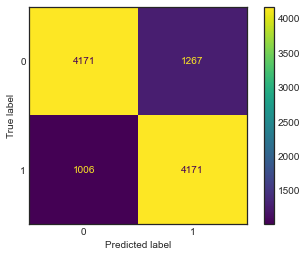

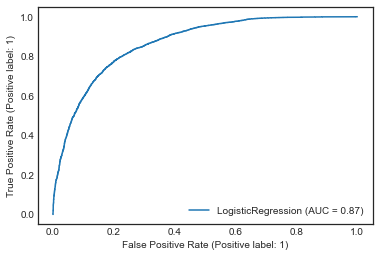

In [157]:
x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.25, random_state=1)

#training our model
lr=LogisticRegression()
lr.fit(x_train, y_train)

#Predicting y_test
y_lr = lr.predict(x_test)
accuracy_lr = accuracy_score(y_test, y_lr)

#Accuracy Score
print("Accuracy score : ", accuracy_lr*100)

print("-----------------------------------------------------------------------")

#Cross Validation Score
cross_val_lr = cross_val_score(lr,X_scaled,Y,cv=5)
print(cross_val_lr)
print("Cross Validation Score : ",cross_val_lr.mean())

print("-----------------------------------------------------------------------")

#Confusion Matrix
print(confusion_matrix(y_test,y_lr))

print("-----------------------------------------------------------------------")

#Classification Report
print(classification_report(y_test,y_lr))

#Plot Confusion Matrix
print(plot_confusion_matrix(lr,x_test,y_test))

#PLot Roc Curve
print(plot_roc_curve(lr,x_test,y_test))

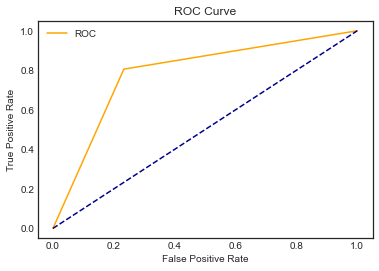

78.63444473863554

In [94]:
fpr,tpr ,thresholds = roc_curve(y_test,y_lr)

plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

auc_score = roc_auc_score(y_test,y_lr)
auc_score*100

Now I will use K fold ,Stratified Shuffle Split and Stratified K Fold to compare the scores and choose better score

In [95]:
#K-fold cross validation
K_fold = KFold(5)
print(K_fold)
l1 = cross_val_score(lr,X_scaled,Y,cv=K_fold)
print(l1)
print("--------------------------------------------------")
print("K-Fold Cross Validation Score : " , l1.mean()*100)

KFold(n_splits=5, random_state=None, shuffle=False)
[0.7245643  0.72103156 0.72641621 0.75409257 0.6722412 ]
--------------------------------------------------
K-Fold Cross Validation Score :  71.9669165095868


In [96]:
#Stratified Shuffle Split
Stratified_Shuffle = StratifiedShuffleSplit(n_splits=5,test_size=0.25)
print(Stratified_Shuffle)
l2 = cross_val_score(lr,X_scaled,Y,cv=Stratified_Shuffle)
print(l2)
print("--------------------------------------------------")
print(" Stratified Shuffle Split : ",l2.mean()*100)

StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.25,
            train_size=None)
[0.78323128 0.78040509 0.77983985 0.78483278 0.77352803]
--------------------------------------------------
 Stratified Shuffle Split :  78.03674046161092


In [97]:
#Stratified K fold Cross Validation
Stra_K_fold = StratifiedKFold(n_splits=5)
print(Stra_K_fold)
l3 = cross_val_score(lr,X_scaled,Y,cv=Stra_K_fold)
print(l3)
print("--------------------------------------------------------")
print("Stratified K Fold : ",l3.mean()*100)

StratifiedKFold(n_splits=5, random_state=None, shuffle=False)
[0.75730099 0.77626001 0.77635143 0.78094453 0.79802143]
--------------------------------------------------------
Stratified K Fold :  77.77756786951223


From the above splits I consider that the score for logistic regression has better split in Stratified K fold and in Stratified Shuffle Split

I have created a pretty table to get the overall accuracy scores in logistic regression model to have a clear understanding about the model

In [98]:
from prettytable import PrettyTable

In [99]:
table = PrettyTable(['Model Name','Accuracy Score','Cross Validation Score','K Fold','Stratified K Fold','Stratified Shuffle Split'])

In [100]:
table.add_row(['Logistic Regression','79.03','78.08','72.29','78.08','78.27'])

In [101]:
print(table)

+---------------------+----------------+------------------------+--------+-------------------+--------------------------+
|      Model Name     | Accuracy Score | Cross Validation Score | K Fold | Stratified K Fold | Stratified Shuffle Split |
+---------------------+----------------+------------------------+--------+-------------------+--------------------------+
| Logistic Regression |     79.03      |         78.08          | 72.29  |       78.08       |          78.27           |
+---------------------+----------------+------------------------+--------+-------------------+--------------------------+


# 2]Decision Tree

Finding the best random state for the model

In [102]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.25, random_state=i)
    dt=DecisionTreeClassifier()
    dt.fit(x_train, y_train)
    y_dt = dt.predict(x_test)
    accuracy_dt = accuracy_score(y_test, y_dt)
    
    if accuracy_dt>maxAccuracy:
        maxAccuracy=accuracy_dt
        maxRandomState=i

print("Best random state is ",maxRandomState,"with accuracy",accuracy_dt)

Best random state is  54 with accuracy 0.8517192651907678


Accuracy score :  85.6806406029204
---------------------------------------------
[0.73316062 0.82336317 0.89094335 0.8936521  0.89141444]
Cross Validation Score :  0.8465067359842872
---------------------------------------------
[[4592  766]
 [ 754 4503]]
---------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.86      0.86      5358
           1       0.85      0.86      0.86      5257

    accuracy                           0.86     10615
   macro avg       0.86      0.86      0.86     10615
weighted avg       0.86      0.86      0.86     10615



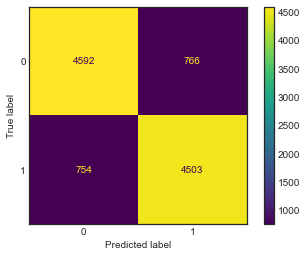

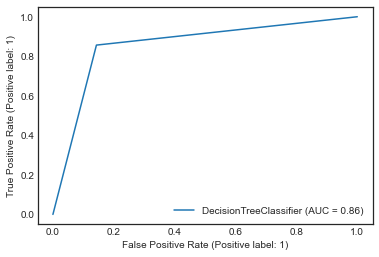

In [103]:
x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.25, random_state=16)

#training our model
dt=DecisionTreeClassifier()
dt.fit(x_train, y_train)

#Predicting y_test
y_dt = dt.predict(x_test)
accuracy_dt = accuracy_score(y_test, y_dt)

#Accuracy Score
print("Accuracy score : ", accuracy_dt*100)

print("---------------------------------------------")

#Cross Validation Score
cross_val_dt = cross_val_score(dt,X_scaled,Y,cv=5)
print(cross_val_dt)
print("Cross Validation Score : ",cross_val_dt.mean())

print("---------------------------------------------")

#Confusion Matrix
print(confusion_matrix(y_test,y_dt))

print("---------------------------------------------")

#Classification Report
print(classification_report(y_test,y_dt))

#PLot Confusion Matrix
print(plot_confusion_matrix(dt,x_test,y_test))

#Plot Roc Curve
print(plot_roc_curve(dt,x_test,y_test))

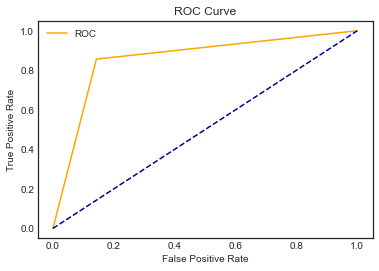

85.68041985008986

In [104]:
fpr,tpr ,thresholds = roc_curve(y_test,y_dt)

plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

auc_score = roc_auc_score(y_test,y_dt)
auc_score*100

Now I will use K fold ,Stratified Shuffle Split and Stratified K Fold to compare the scores and choose better score

In [105]:
#K-fold cross validation
K_fold = KFold(5)
print(K_fold)
d1 = cross_val_score(dt,X_scaled,Y,cv=K_fold)
print(d1)
print("--------------------------------------------------")
print("K-Fold Cross Validation Score : " , d1.mean()*100)

KFold(n_splits=5, random_state=None, shuffle=False)
[0.80581724 0.80569948 0.79543046 0.90177835 0.92403722]
--------------------------------------------------
K-Fold Cross Validation Score :  84.65525493647009


In [106]:
#Stratified Shuffle Split
Stratified_Shuffle = StratifiedShuffleSplit(n_splits=5,test_size=0.25)
print(Stratified_Shuffle)
d2 = cross_val_score(dt,X_scaled,Y,cv=Stratified_Shuffle)
print(d2)
print("--------------------------------------------------")
print(" Stratified Shuffle Split : ",d2.mean()*100)

StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.25,
            train_size=None)
[0.85492228 0.84983514 0.85303815 0.84342911 0.85407442]
--------------------------------------------------
 Stratified Shuffle Split :  85.10598210080076


In [107]:
#Stratified K fold Cross Validation
Stra_K_fold = StratifiedKFold(n_splits=5)
print(Stra_K_fold)
d3 = cross_val_score(dt,X_scaled,Y,cv=Stra_K_fold)
print(d3)
print("--------------------------------------------------------")
print("Stratified K Fold : ",d3.mean()*100)

StratifiedKFold(n_splits=5, random_state=None, shuffle=False)
[0.73374941 0.82630711 0.89000118 0.89341656 0.88941232]
--------------------------------------------------------
Stratified K Fold :  84.6577315827964


From the above splits I consider that the score for decision tree has better split in Stratified K fold and in Stratified Shuffle Split

I have created a pretty table to get the overall accuracy scores in decision tree model to have a clear understanding about the model

In [108]:
table1 = PrettyTable(['Model Name','Accuracy Score','Cross Validation Score','K Fold','Stratified K Fold','Stratified Shuffle Split'])

In [109]:
table1.add_row(['Decision Tree','85.94','84.70','84.90','85.28','84.78'])

In [110]:
print(table1)

+---------------+----------------+------------------------+--------+-------------------+--------------------------+
|   Model Name  | Accuracy Score | Cross Validation Score | K Fold | Stratified K Fold | Stratified Shuffle Split |
+---------------+----------------+------------------------+--------+-------------------+--------------------------+
| Decision Tree |     85.94      |         84.70          | 84.90  |       85.28       |          84.78           |
+---------------+----------------+------------------------+--------+-------------------+--------------------------+


# 3]KNN

Finding the best random state for my model

In [111]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.25, random_state=i)
    knn=KNeighborsClassifier()
    knn.fit(x_train, y_train)
    y_knn = knn.predict(x_test)
    accuracy_knn = accuracy_score(y_test, y_knn)
    
    if accuracy_knn>maxAccuracy:
        maxAccuracy=accuracy_knn
        maxRandomState=i

print("Best accuracy score is", maxAccuracy ," on Random State", maxRandomState)

Best accuracy score is 0.8560527555346208  on Random State 95


Accuracy score :  85.35091851154027
---------------------------------------------
[0.78026378 0.828309   0.87351313 0.87009775 0.87563302]
Cross Validation Score :  0.8455633359374779
---------------------------------------------
[[4531  874]
 [ 681 4529]]
---------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.84      0.85      5405
           1       0.84      0.87      0.85      5210

    accuracy                           0.85     10615
   macro avg       0.85      0.85      0.85     10615
weighted avg       0.85      0.85      0.85     10615



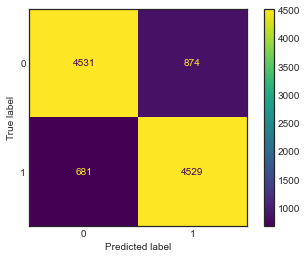

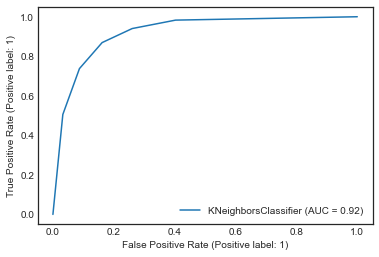

In [112]:
x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.25, random_state=48)

#training our model
knn=KNeighborsClassifier()
knn.fit(x_train, y_train)

#Predicting y_test
y_knn = knn.predict(x_test)
accuracy_knn = accuracy_score(y_test, y_knn)

#Accuracy Score
print("Accuracy score : ", accuracy_knn*100)

print("---------------------------------------------")

#Cross Validation Score
cross_val_knn = cross_val_score(knn,X_scaled,Y,cv=5)
print(cross_val_knn)
print("Cross Validation Score : ",cross_val_knn.mean())

print("---------------------------------------------")

#Confusion Matrix
print(confusion_matrix(y_test,y_knn))

print("---------------------------------------------")

#Classification Report
print(classification_report(y_test,y_knn))

#Confusion Matrix Plot
print(plot_confusion_matrix(knn,x_test,y_test))

#Plot Roc Curve
print(plot_roc_curve(knn,x_test,y_test))

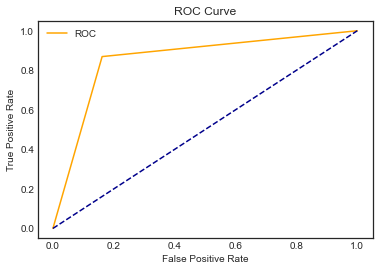

85.37938497978519

In [113]:
fpr,tpr ,thresholds = roc_curve(y_test,y_knn)

plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

auc_score = roc_auc_score(y_test,y_knn)
auc_score*100

Now I will use K fold ,Stratified Shuffle Split and Stratified K Fold to compare the scores and choose better score

In [114]:
#K-fold cross validation
K_fold = KFold(5)
print(K_fold)
k1 = cross_val_score(knn,X_scaled,Y,cv=K_fold)
print(k1)
print("--------------------------------------------------")
print("K-Fold Cross Validation Score : " , k1.mean()*100)

KFold(n_splits=5, random_state=None, shuffle=False)
[0.80499293 0.80051813 0.80449888 0.87092215 0.86668237]
--------------------------------------------------
K-Fold Cross Validation Score :  82.95228945690909


In [115]:
#Stratified Shuffle Split
Stratified_Shuffle = StratifiedShuffleSplit(n_splits=5,test_size=0.25)
print(Stratified_Shuffle)
k2 = cross_val_score(knn,X_scaled,Y,cv=Stratified_Shuffle)
print(k2)
print("--------------------------------------------------")
print(" Stratified Shuffle Split : ",k2.mean()*100)

StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.25,
            train_size=None)
[0.84908149 0.85190768 0.84747998 0.84597268 0.84823363]
--------------------------------------------------
 Stratified Shuffle Split :  84.8535091851154


In [116]:
#Stratified K fold Cross Validation
Stra_K_fold = StratifiedKFold(n_splits=5)
print(Stra_K_fold)
k3 = cross_val_score(knn,X_scaled,Y,cv=Stra_K_fold)
print(k3)
print("--------------------------------------------------------")
print("Stratified K Fold : ",k3.mean()*100)

StratifiedKFold(n_splits=5, random_state=None, shuffle=False)
[0.78026378 0.828309   0.87351313 0.87009775 0.87563302]
--------------------------------------------------------
Stratified K Fold :  84.5563335937478


From the above splits I consider that the score for decision tree has better split in Stratified K fold and in Stratified Shuffle Split

I have created a pretty table to get the overall accuracy scores in decision tree model to have a clear understanding about the model

In [117]:
table2 = PrettyTable(['Model Name','Accuracy Score','Cross Validation Score','K Fold','Stratified K Fold','Stratified Shuffle Split'])

In [118]:
table2.add_row(['KNN','85.65','84.73','82.97','84.98','84.73'])

In [119]:
print(table2)

+------------+----------------+------------------------+--------+-------------------+--------------------------+
| Model Name | Accuracy Score | Cross Validation Score | K Fold | Stratified K Fold | Stratified Shuffle Split |
+------------+----------------+------------------------+--------+-------------------+--------------------------+
|    KNN     |     85.65      |         84.73          | 82.97  |       84.98       |          84.73           |
+------------+----------------+------------------------+--------+-------------------+--------------------------+


# 4]Random Forest

In [120]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.25, random_state=i)
    rf=RandomForestClassifier()
    rf.fit(x_train, y_train)
    y_rf = rf.predict(x_test)
    accuracy_rf = accuracy_score(y_test, y_rf)
    
    if accuracy_rf>maxAccuracy:
        maxAccuracy=accuracy_rf
        maxRandomState=i

print("Best accuracy score is", maxAccuracy ," on Random State", maxRandomState)

Best accuracy score is 0.8964672633066415  on Random State 12


Accuracy score :  89.5242581252944
---------------------------------------------
[0.7597739  0.86504946 0.92556825 0.93251678 0.93098575]
Cross Validation Score :  0.8827788287984181
---------------------------------------------
[[4854  533]
 [ 579 4649]]
---------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.90      0.90      5387
           1       0.90      0.89      0.89      5228

    accuracy                           0.90     10615
   macro avg       0.90      0.90      0.90     10615
weighted avg       0.90      0.90      0.90     10615



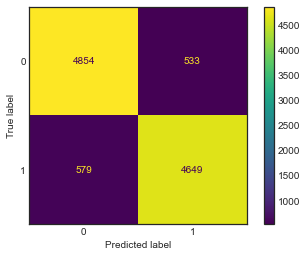

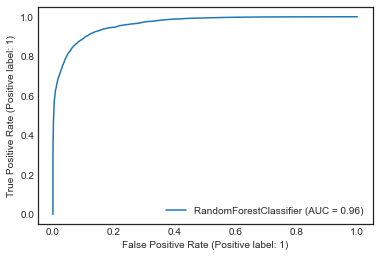

In [121]:
x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.25, random_state=12)

#training our model
rf=RandomForestClassifier()
rf.fit(x_train, y_train)

#Predicting y_test
y_rf = rf.predict(x_test)
accuracy_rf = accuracy_score(y_test, y_rf)

#Accuracy Score
print("Accuracy score : ", accuracy_rf*100)

print("---------------------------------------------")

#Cross Validation Score
cross_val_rf = cross_val_score(rf,X_scaled,Y,cv=5)
print(cross_val_rf)
print("Cross Validation Score : ",cross_val_rf.mean())

print("---------------------------------------------")

#Confusion Matrix
print(confusion_matrix(y_test,y_rf))

print("---------------------------------------------")

#Classification Report
print(classification_report(y_test,y_rf))

#Plot Confusion Matrix
print(plot_confusion_matrix(rf,x_test,y_test))

#Plot Roc Curve
print(plot_roc_curve(rf,x_test,y_test))

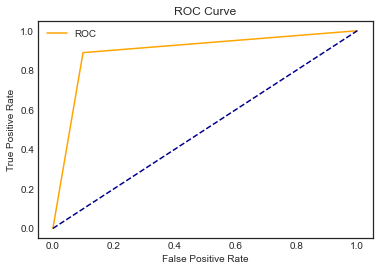

89.5154147058953

In [122]:
fpr,tpr ,thresholds = roc_curve(y_test,y_rf)

plt.plot(fpr,tpr,color='orange',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

auc_score = roc_auc_score(y_test,y_rf)
auc_score*100

Now I will use K fold ,Stratified Shuffle Split and Stratified K Fold to compare the scores and choose better score

In [123]:
#K-fold cross validation
K_fold = KFold(5)
print(K_fold)
r1 = cross_val_score(rf,X_scaled,Y,cv=K_fold)
print(r1)
print("--------------------------------------------------")
print("K-Fold Cross Validation Score : " , r1.mean()*100)

KFold(n_splits=5, random_state=None, shuffle=False)
[0.84891663 0.84138012 0.8519609  0.93557885 0.95889766]
--------------------------------------------------
K-Fold Cross Validation Score :  88.73468308385377


In [124]:
#Stratified Shuffle Split
Stratified_Shuffle = StratifiedShuffleSplit(n_splits=5,test_size=0.25)
print(Stratified_Shuffle)
r2 = cross_val_score(rf,X_scaled,Y,cv=Stratified_Shuffle)
print(r2)
print("--------------------------------------------------")
print(" Stratified Shuffle Split : ",r2.mean()*100)

StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.25,
            train_size=None)
[0.89458314 0.89411211 0.89307584 0.89062647 0.89392369]
--------------------------------------------------
 Stratified Shuffle Split :  89.32642487046631


In [125]:
#Stratified K fold Cross Validation
Stra_K_fold = StratifiedKFold(n_splits=5)
print(Stra_K_fold)
r3 = cross_val_score(rf,X_scaled,Y,cv=Stra_K_fold)
print(r3)
print("--------------------------------------------------------")
print("Stratified K Fold : ",r3.mean()*100)

StratifiedKFold(n_splits=5, random_state=None, shuffle=False)
[0.75800754 0.86351861 0.92556825 0.92969026 0.92969026]
--------------------------------------------------------
Stratified K Fold :  88.12949823073313


From the above splits I consider that the score for decision tree has better split in Stratified K fold and in Stratified Shuffle Split

I have created a pretty table to get the overall accuracy scores in decision tree model to have a clear understanding about the model

In [126]:
table3 = PrettyTable(['Model Name','Accuracy Score','Cross Validation Score','K Fold','Stratified K Fold','Stratified Shuffle Split'])

In [127]:
table3.add_row(['Random Forest','89.65','88.34','88.83','89.18','88.35'])

In [128]:
print(table3)

+---------------+----------------+------------------------+--------+-------------------+--------------------------+
|   Model Name  | Accuracy Score | Cross Validation Score | K Fold | Stratified K Fold | Stratified Shuffle Split |
+---------------+----------------+------------------------+--------+-------------------+--------------------------+
| Random Forest |     89.65      |         88.34          | 88.83  |       89.18       |          88.35           |
+---------------+----------------+------------------------+--------+-------------------+--------------------------+


From the models which I have used for training and testing ,I spotted that the Random Forest model has been giving me good accuracy compared to the other models.The cross validations scores for RF model gives a good score than other models.So for hypertuning the model ,I will use Random Forest Classifier to tune my parameters for a better fit.

# Hyper Parameter Tuning

In [129]:
from sklearn.model_selection import GridSearchCV

In [130]:
#Choosing Random Forest Classifier

params = {
    'n_estimators' : [100,120,150,170],
    'criterion' : ['gini','entropy','log_loss'],
    'max_depth' : [2,4,6,8],
    'min_samples_split' : [1,2,3],
    'max_features' : ['sqrt','log2']
}

In [131]:
gs_rf = GridSearchCV(rf,param_grid=params,cv=5)

gs_rf

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 4, 6, 8],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_split': [1, 2, 3],
                         'n_estimators': [100, 120, 150, 170]})

In [132]:
gs_rf.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 4, 6, 8],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_split': [1, 2, 3],
                         'n_estimators': [100, 120, 150, 170]})

In [133]:
gs_rf.best_params_

{'criterion': 'gini',
 'max_depth': 8,
 'max_features': 'log2',
 'min_samples_split': 2,
 'n_estimators': 170}

In [134]:
gs_rf.best_estimator_

RandomForestClassifier(max_depth=8, max_features='log2', n_estimators=170)

In [135]:
gs_rf.best_score_

0.8604359428639509

In [136]:
gs_rf.cv_results_['mean_test_score']

array([       nan,        nan,        nan,        nan, 0.79131351,
       0.79398303, 0.78924081, 0.79511352, 0.79206759, 0.79115637,
       0.7862885 , 0.79398293,        nan,        nan,        nan,
              nan, 0.79263238, 0.78713634, 0.79234957, 0.78801585,
       0.79454797, 0.7921613 , 0.79115613, 0.79134505,        nan,
              nan,        nan,        nan, 0.82080265, 0.82064552,
       0.82102253, 0.82020594, 0.82149354, 0.82092826, 0.8205828 ,
       0.82193321,        nan,        nan,        nan,        nan,
       0.81951511, 0.82089688, 0.82073986, 0.82209027, 0.82114817,
       0.82092834, 0.82130513, 0.82224738,        nan,        nan,
              nan,        nan, 0.83936312, 0.8378872 , 0.83779293,
       0.83848379, 0.84090189, 0.84046208, 0.83970865, 0.83948868,
              nan,        nan,        nan,        nan, 0.84024251,
       0.83760444, 0.84061928, 0.8396456 , 0.83763594, 0.83848373,
       0.83886072, 0.83854657,        nan,        nan,        

I will use the best parameters for training our Random Forest Classifier and check the accuracy score

Accuracy Score after Hyperparameter Tuning is :  86.189354686764
----------------------------------------------------------------------
Classification Report after Hyperparameter Tuning is :                precision    recall  f1-score   support

           0       0.90      0.82      0.86      5387
           1       0.83      0.90      0.87      5228

    accuracy                           0.86     10615
   macro avg       0.86      0.86      0.86     10615
weighted avg       0.86      0.86      0.86     10615

----------------------------------------------------------------------
Confusion Matrix :  <sklearn.metrics._plot.confusion_matrix.ConfusionMatrixDisplay object at 0x00000194BC861700>
----------------------------------------------------------------------
ROC Curve :  <sklearn.metrics._plot.roc_curve.RocCurveDisplay object at 0x00000194BC861700>
----------------------------------------------------------------------


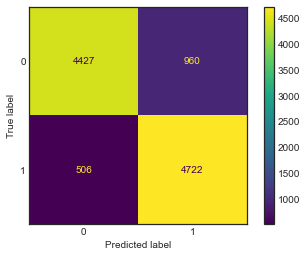

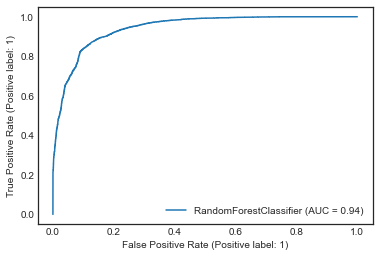

In [146]:
final_model = RandomForestClassifier(max_depth=8, max_features='log2', n_estimators=170,criterion='gini',min_samples_split=2)
final_model.fit(x_train,y_train)
final_model_pred = final_model.predict(x_test)
print("Accuracy Score after Hyperparameter Tuning is : ",accuracy_score(y_test,final_model_pred)*100)
print('-'*70)
print("Classification Report after Hyperparameter Tuning is : ",classification_report(y_test,final_model_pred))
print('-'*70)
print("Confusion Matrix : ",plot_confusion_matrix(final_model,x_test,y_test))
print('-'*70)
print("ROC Curve : ",plot_roc_curve(final_model,x_test,y_test))
print('-'*70)

Now I will use Pretty table to compare the RF Model with before and after hyperparameter tuning accuracy scores.

In [151]:
table4 = PrettyTable(['Model Name','Before HyperParameter Score','After Hyperparameter Score'])

In [152]:
table4.add_row(['Random Forest','89.65','86.18'])

In [153]:
print(table4)

+---------------+-----------------------------+----------------------------+
|   Model Name  | Before HyperParameter Score | After Hyperparameter Score |
+---------------+-----------------------------+----------------------------+
| Random Forest |            89.65            |           86.18            |
+---------------+-----------------------------+----------------------------+


So I can conclude that the parmeters used in the Hyperparameter tuning have accuracy less than the default parameters used in the First Model for Random forest

# Saving the best model

So I will save the best model i.e the Random Forest which I have created in the model building phase which has the  accuracy score of 89%.The data in the model is not overfitting because the Cross Validation score is almost equal to the accuracy score of the model.

In [154]:
print(table3)

+---------------+----------------+------------------------+--------+-------------------+--------------------------+
|   Model Name  | Accuracy Score | Cross Validation Score | K Fold | Stratified K Fold | Stratified Shuffle Split |
+---------------+----------------+------------------------+--------+-------------------+--------------------------+
| Random Forest |     89.65      |         88.34          | 88.83  |       89.18       |          88.35           |
+---------------+----------------+------------------------+--------+-------------------+--------------------------+


Roc curve for the best model

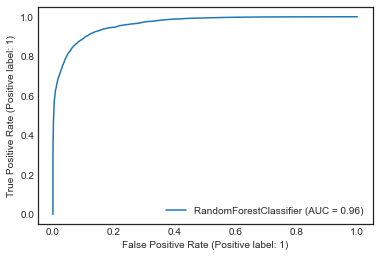

In [155]:
plot_roc_curve(rf,x_test,y_test)

In [143]:
#Import library to save the best model
import pickle 

In [144]:
#Create a filename to save the best model
filename = 'Census_Income.pkl'

In [145]:
pickle.dump(rf,open(filename,'wb'))

Finally I have saved my best model using the pickle library